# **Imports**

In [110]:
#1
#Check CPU and RAM specifications
!cat /proc/cpuinfo
!cat /proc/meminfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2200.000
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa itlb_multihit
bogomips	: 4400.00
clflush size	: 64
cache_alignment	: 64
address sizes	: 46 bits 

In [112]:
#2
!pip list

Package                  Version        
------------------------ ---------------
absl-py                  0.9.0          
alabaster                0.7.12         
albumentations           0.1.12         
altair                   4.1.0          
asgiref                  3.2.7          
astor                    0.8.1          
astropy                  4.0.1.post1    
astunparse               1.6.3          
atari-py                 0.2.6          
atomicwrites             1.4.0          
attrs                    19.3.0         
audioread                2.1.8          
autograd                 1.3            
Babel                    2.8.0          
backcall                 0.2.0          
beautifulsoup4           4.6.3          
bleach                   3.1.5          
blis                     0.4.1          
bokeh                    1.4.0          
boto                     2.49.0         
boto3                    1.13.23        
botocore                 1.16.23        
Bottleneck      

In [0]:
#3
import numpy as np 
import time
from google.colab import files, auth, drive
import cv2 as cv
from google.colab.patches import cv2_imshow

In [114]:
#4
# Mount
drive.mount('/content/gdrive', force_remount=True)
data_dir_drive ='/content/gdrive/My Drive/Colab Notebooks/CV/Proj2' #change to the project folder on the drive
data_dir ='/content' # When read from unziped file

Mounted at /content/gdrive


In [0]:
#5
# Unzip dataset to /content
start = time.time()

!unzip -q '/content/gdrive/My Drive/Colab Notebooks/CV/Proj2/Project2.zip' -d '/content/gdrive/My Drive/Colab Notebooks/CV/Proj2/data'

print('Took', (time.time() - start), ' secundes to unzip')

mapname:  conversion of  failed
replace /content/gdrive/My Drive/Colab Notebooks/CV/Proj2/data/training_data/Task4/6.mp4? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
Took 16.66066026687622  secundes to unzip


In [0]:
#6
!ls '/content/gdrive/My Drive/Colab Notebooks/CV/Proj2/data'

format_output  training_data


In [0]:
#7
folder_in = data_dir_drive + '/data/training_data/'
folder_out = data_dir_drive + '/output_data/lupascu_marian_407/'

# **Task 1**
You receive a test set of 57 images of a snooker table seen from above at a random time of a game (for example the black ball might be potted). The task is to count the number of balls on the table and specify their color for each of the 57 images in the test set.

In [0]:
#1
def get_bottom_right(img, show_results = True):
    w, h = img.shape[::-1]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

    meth = methods[1]

    template1 = cv.imread(data_dir_drive + '/data/templates/tem1.jpg', 0)
    template2 = cv.imread(data_dir_drive + '/data/templates/tem11.jpg', 0)
    w1, h1 = template1.shape[::-1]
    w2, h2 = template2.shape[::-1]

    method = eval(meth)

    # Apply template Matching
    res1 = cv.matchTemplate(img[h//2:, w//2:],template1,method)
    res2 = cv.matchTemplate(img[h//2:, w//2:],template2,method)
    min_val1, max_val1, min_loc1, max_loc1 = cv.minMaxLoc(res1)
    min_val2, max_val2, min_loc2, max_loc2 = cv.minMaxLoc(res2)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left1 = min_loc1
        top_left2 = min_loc2
    else:
        top_left1 = max_loc1
        top_left2 = max_loc2

    #print(res1[top_left1[1], top_left1[0]])
    #print(res2[top_left2[1], top_left2[0]])

    if res1[top_left1[1], top_left1[0]] > 0.6 or res2[top_left2[1], top_left2[0]] > 0.6:
        if res1[top_left1[1], top_left1[0]] > res2[top_left2[1], top_left2[0]]:
            top_left1 = (top_left1[0] + w//2, top_left1[1] + h//2)
            bottom_right1 = (top_left1[0] + w1, top_left1[1] + h1)
            if show_results:         
                cv.rectangle(img,top_left1, bottom_right1, 255, 2)
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left1, bottom_right1, ((top_left1[0] + bottom_right1[0]) // 2, (top_left1[1] + bottom_right1[1]) // 2), img
        else:
            top_left2 = (top_left2[0] + w//2, top_left2[1] + h//2)
            bottom_right2 = (top_left2[0] + w2, top_left2[1] + h2)
            if show_results:         
                cv.rectangle(img,top_left2, bottom_right2, 255, 2)
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left2, bottom_right2, ((top_left2[0] + bottom_right2[0]) // 2, (top_left2[1] + bottom_right2[1]) // 2), img
    else:
        return None, None, None, img

In [0]:
#2
def get_bottom_left(img, show_results = True):
    w, h = img.shape[::-1]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

    meth = methods[1]

    template1 = cv.imread(data_dir_drive + '/data/templates/tem2.jpg', 0)
    template2 = cv.imread(data_dir_drive + '/data/templates/tem22.jpg', 0)
    w1, h1 = template1.shape[::-1]
    w2, h2 = template2.shape[::-1]

    method = eval(meth)

    # Apply template Matching
    res1 = cv.matchTemplate(img[h//2:, :w//2],template1,method)
    res2 = cv.matchTemplate(img[h//2:, :w//2],template2,method)
    min_val1, max_val1, min_loc1, max_loc1 = cv.minMaxLoc(res1)
    min_val2, max_val2, min_loc2, max_loc2 = cv.minMaxLoc(res2)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left1 = min_loc1
        top_left2 = min_loc2
    else:
        top_left1 = max_loc1
        top_left2 = max_loc2

    #print(res1[top_left1[1], top_left1[0]])
    #print(res2[top_left2[1], top_left2[0]])

    if res1[top_left1[1], top_left1[0]] > 0.6 or res2[top_left2[1], top_left2[0]] > 0.6:
        if res1[top_left1[1], top_left1[0]] > res2[top_left2[1], top_left2[0]]:
            top_left1 = (top_left1[0], top_left1[1] + h//2)
            bottom_right1 = (top_left1[0] + w1, top_left1[1] + h1)
            if show_results:  
                cv.rectangle(img,top_left1, bottom_right1, 255, 2)       
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left1, bottom_right1, ((top_left1[0] + bottom_right1[0]) // 2, (top_left1[1] + bottom_right1[1]) // 2), img
        else:
            top_left2 = (top_left2[0], top_left2[1] + h//2)
            bottom_right2 = (top_left2[0] + w2, top_left2[1] + h2)
            if show_results:         
                cv.rectangle(img,top_left2, bottom_right2, 255, 2)
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left2, bottom_right2, ((top_left2[0] + bottom_right2[0]) // 2, (top_left2[1] + bottom_right2[1]) // 2), img
    else:
        return None, None, None, img

In [0]:
#3
def get_top_left(img, show_results = True):
    w, h = img.shape[::-1]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

    meth = methods[1]

    template1 = cv.imread(data_dir_drive + '/data/templates/tem3.jpg', 0)
    template2 = cv.imread(data_dir_drive + '/data/templates/tem33.jpg', 0)
    w1, h1 = template1.shape[::-1]
    w2, h2 = template2.shape[::-1]

    method = eval(meth)

    # Apply template Matching
    res1 = cv.matchTemplate(img[:h//2, :w//2],template1,method)
    res2 = cv.matchTemplate(img[:h//2, :w//2],template2,method)
    min_val1, max_val1, min_loc1, max_loc1 = cv.minMaxLoc(res1)
    min_val2, max_val2, min_loc2, max_loc2 = cv.minMaxLoc(res2)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left1 = min_loc1
        top_left2 = min_loc2
    else:
        top_left1 = max_loc1
        top_left2 = max_loc2

    #print(res1[top_left1[1], top_left1[0]])
    #print(res2[top_left2[1], top_left2[0]])

    if res1[top_left1[1], top_left1[0]] > 0.6 or res2[top_left2[1], top_left2[0]] > 0.6:
        if res1[top_left1[1], top_left1[0]] > res2[top_left2[1], top_left2[0]]:
            bottom_right1 = (top_left1[0] + w1, top_left1[1] + h1)
            if show_results:         
                cv.rectangle(img,top_left1, bottom_right1, 255, 2)
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left1, bottom_right1, ((top_left1[0] + bottom_right1[0]) // 2, (top_left1[1] + bottom_right1[1]) // 2), img
        else:
            bottom_right2 = (top_left2[0] + w2, top_left2[1] + h2)
            if show_results:  
                cv.rectangle(img,top_left2, bottom_right2, 255, 2)       
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left2, bottom_right2, ((top_left2[0] + bottom_right2[0]) // 2, (top_left2[1] + bottom_right2[1]) // 2), img
    else:
        return None, None, None, img

In [0]:
#4
def get_top_right(img, show_results = True):
    w, h = img.shape[::-1]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

    meth = methods[1]

    template1 = cv.imread(data_dir_drive + '/data/templates/tem4.jpg', 0)
    template2 = cv.imread(data_dir_drive + '/data/templates/tem44.jpg', 0)
    w1, h1 = template1.shape[::-1]
    w2, h2 = template2.shape[::-1]

    method = eval(meth)

    # Apply template Matching
    res1 = cv.matchTemplate(img[:h//2, w//2:],template1,method)
    res2 = cv.matchTemplate(img[:h//2, w//2:],template2,method)
    min_val1, max_val1, min_loc1, max_loc1 = cv.minMaxLoc(res1)
    min_val2, max_val2, min_loc2, max_loc2 = cv.minMaxLoc(res2)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left1 = min_loc1
        top_left2 = min_loc2
    else:
        top_left1 = max_loc1
        top_left2 = max_loc2

    #print(res1[top_left1[1], top_left1[0]])
    #print(res2[top_left2[1], top_left2[0]])

    if res1[top_left1[1], top_left1[0]] > 0.6 or res2[top_left2[1], top_left2[0]] > 0.6:
        if res1[top_left1[1], top_left1[0]] > res2[top_left2[1], top_left2[0]]:
            top_left1 = (top_left1[0] + w//2, top_left1[1])
            bottom_right1 = (top_left1[0] + w1, top_left1[1] + h1)
            if show_results:      
                cv.rectangle(img,top_left1, bottom_right1, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left1, bottom_right1, ((top_left1[0] + bottom_right1[0]) // 2, (top_left1[1] + bottom_right1[1]) // 2), img
        else:
            top_left2 = (top_left2[0] + w//2, top_left2[1])
            bottom_right2 = (top_left2[0] + w2, top_left2[1] + h2)
            if show_results:
                cv.rectangle(img,top_left2, bottom_right2, 255, 2)
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left2, bottom_right2, ((top_left2[0] + bottom_right2[0]) // 2, (top_left2[1] + bottom_right2[1]) // 2), img
    else:
        return None, None, None, img

In [0]:
#5
def get_middle_right(img, show_results = True):
    w, h = img.shape[::-1]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

    meth = methods[1]

    template1 = cv.imread(data_dir_drive + '/data/templates/tem5.jpg', 0)
    template2 = cv.imread(data_dir_drive + '/data/templates/tem55.jpg', 0)
    template3 = cv.imread(data_dir_drive + '/data/templates/tem555.jpg', 0)
    w1, h1 = template1.shape[::-1]
    w2, h2 = template2.shape[::-1]
    w3, h3 = template3.shape[::-1]

    method = eval(meth)

    # Apply template Matching
    res1 = cv.matchTemplate(img[:, w//2:],template1,method)
    res2 = cv.matchTemplate(img[:, w//2:],template2,method)
    res3 = cv.matchTemplate(img[:, w//2:],template3,method)
    min_val1, max_val1, min_loc1, max_loc1 = cv.minMaxLoc(res1)
    min_val2, max_val2, min_loc2, max_loc2 = cv.minMaxLoc(res2)
    min_val3, max_val3, min_loc3, max_loc3 = cv.minMaxLoc(res3)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left1 = min_loc1
        top_left2 = min_loc2
        top_left3 = min_loc3
    else:
        top_left1 = max_loc1
        top_left2 = max_loc2
        top_left3 = max_loc3

    #print(res1[top_left1[1], top_left1[0]])
    #print(res2[top_left2[1], top_left2[0]])
    #print(res3[top_left3[1], top_left3[0]])

    if res1[top_left1[1], top_left1[0]] > 0.75 or res2[top_left2[1], top_left2[0]] > 0.75 or res3[top_left3[1], top_left3[0]] > 0.75:
        L = [res1[top_left1[1], top_left1[0]], res2[top_left2[1], top_left2[0]], res3[top_left3[1], top_left3[0]]]
        i = np.argmax(np.array(L))
        if i == 0:
            top_left1 = (top_left1[0] + w//2, top_left1[1])
            bottom_right1 = (top_left1[0] + w1, top_left1[1] + h1)
            if show_results:      
                cv.rectangle(img,top_left1, bottom_right1, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left1, bottom_right1, ((top_left1[0] + bottom_right1[0]) // 2, (top_left1[1] + bottom_right1[1]) // 2), img

        if i == 1:
            top_left2 = (top_left2[0] + w//2, top_left2[1])
            bottom_right2 = (top_left2[0] + w2, top_left2[1] + h2)
            if show_results:      
                cv.rectangle(img,top_left2, bottom_right2, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left2, bottom_right2, ((top_left2[0] + bottom_right2[0]) // 2, (top_left2[1] + bottom_right2[1]) // 2), img

        if i == 2:
            top_left3 = (top_left3[0] + w//2, top_left3[1])
            bottom_right3 = (top_left3[0] + w3, top_left3[1] + h3)
            if show_results:      
                cv.rectangle(img,top_left3, bottom_right3, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left3, bottom_right3, ((top_left3[0] + bottom_right3[0]) // 2, (top_left3[1] + bottom_right3[1]) // 2), img

    else:
        return None, None, None, img

In [0]:
#6
def get_middle_left(img, show_results = True):
    w, h = img.shape[::-1]

    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

    meth = methods[1]

    template1 = cv.imread(data_dir_drive + '/data/templates/tem6.jpg', 0)
    template2 = cv.imread(data_dir_drive + '/data/templates/tem66.jpg', 0)
    template3 = cv.imread(data_dir_drive + '/data/templates/tem666.jpg', 0)
    w1, h1 = template1.shape[::-1]
    w2, h2 = template2.shape[::-1]
    w3, h3 = template3.shape[::-1]

    method = eval(meth)

    # Apply template Matching
    res1 = cv.matchTemplate(img[:, :w//2],template1,method)
    res2 = cv.matchTemplate(img[:, :w//2],template2,method)
    res3 = cv.matchTemplate(img[:, :w//2],template3,method)
    min_val1, max_val1, min_loc1, max_loc1 = cv.minMaxLoc(res1)
    min_val2, max_val2, min_loc2, max_loc2 = cv.minMaxLoc(res2)
    min_val3, max_val3, min_loc3, max_loc3 = cv.minMaxLoc(res3)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left1 = min_loc1
        top_left2 = min_loc2
        top_left3 = min_loc3
    else:
        top_left1 = max_loc1
        top_left2 = max_loc2
        top_left3 = max_loc3

    #print(res1[top_left1[1], top_left1[0]])
    #print(res2[top_left2[1], top_left2[0]])
    #print(res3[top_left3[1], top_left3[0]])

    if res1[top_left1[1], top_left1[0]] > 0.8 or res2[top_left2[1], top_left2[0]] > 0.8 or res3[top_left3[1], top_left3[0]] > 0.8:
        L = [res1[top_left1[1], top_left1[0]], res2[top_left2[1], top_left2[0]], res3[top_left3[1], top_left3[0]]]
        i = np.argmax(np.array(L))
        if i == 0:
            top_left1 = (top_left1[0], top_left1[1])
            bottom_right1 = (top_left1[0] + w1, top_left1[1] + h1)
            if show_results:      
                cv.rectangle(img,top_left1, bottom_right1, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left1, bottom_right1, ((top_left1[0] + bottom_right1[0]) // 2, (top_left1[1] + bottom_right1[1]) // 2), img

        if i == 1:
            top_left2 = (top_left2[0], top_left2[1])
            bottom_right2 = (top_left2[0] + w2, top_left2[1] + h2)
            if show_results:      
                cv.rectangle(img,top_left2, bottom_right2, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left2, bottom_right2, ((top_left2[0] + bottom_right2[0]) // 2, (top_left2[1] + bottom_right2[1]) // 2), img

        if i == 2:
            top_left3 = (top_left3[0], top_left3[1])
            bottom_right3 = (top_left3[0] + w3, top_left3[1] + h3)
            if show_results:      
                cv.rectangle(img,top_left3, bottom_right3, 255, 2)   
                cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))
            return top_left3, bottom_right3, ((top_left3[0] + bottom_right3[0]) // 2, (top_left3[1] + bottom_right3[1]) // 2), img

    else:
        return None, None, None, img

In [0]:
#7
def get_corners(img, show_results = True):
    _, _, bottom_left_corner, _ = get_bottom_left(img, False)
    _, _, bottom_right_corner, _ = get_bottom_right(img, False)
    _, _, top_right_corner, _ = get_top_right(img, False)
    _, _, top_left_corner, _ = get_top_left(img, False)

    if bottom_left_corner is None or bottom_right_corner is None or top_right_corner is None or top_left_corner is None:

        if bottom_left_corner is None and bottom_right_corner is None:
            print("I can't calculate the top pockets")
        elif bottom_left_corner is None or bottom_right_corner is None:
            if top_right_corner is None or top_left_corner is None:
                print("I can't calculate the top pockets")
            else:
                middle = (top_right_corner[0] + top_left_corner[0]) // 2
                if bottom_left_corner is None:
                    bottom_left_corner = (bottom_right_corner[0] - 2 *(bottom_right_corner[0] - middle), bottom_right_corner[1])
                else:
                    bottom_right_corner = (bottom_left_corner[0] + 2 *(middle - bottom_left_corner[0]), bottom_left_corner[1])

        if top_right_corner is None and top_left_corner is None:
            print("I can't calculate the bottom pockets")
        elif top_right_corner is None or top_left_corner is None:
            if bottom_left_corner is None or bottom_right_corner is None:
                print("I can't calculate the top pockets")
            else:
                middle = (bottom_left_corner[0] + bottom_right_corner[0]) // 2
                if top_left_corner is None:
                    top_left_corner = (top_right_corner[0] - 2 *(top_right_corner[0] - middle), top_right_corner[1])
                else:
                    top_right_corner = (top_left_corner[0] + 2 *(middle - top_left_corner[0]), top_left_corner[1])

    if show_results:
        img = cv.circle(img, bottom_left_corner, 5, 255, 2) 
        img = cv.circle(img, bottom_right_corner, 5, 255, 2) 
        img = cv.circle(img, top_right_corner, 5, 255, 2) 
        img = cv.circle(img, top_left_corner, 5, 255, 2) 

        cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))

    return bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner


1


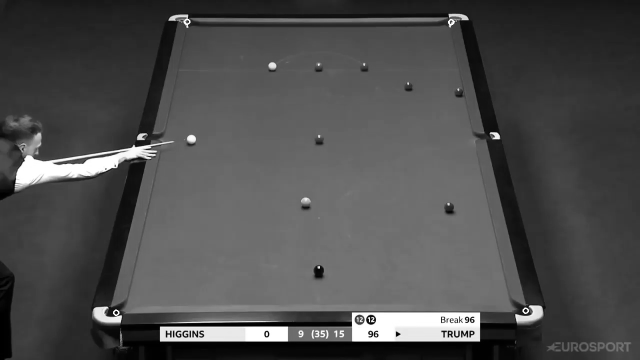

2


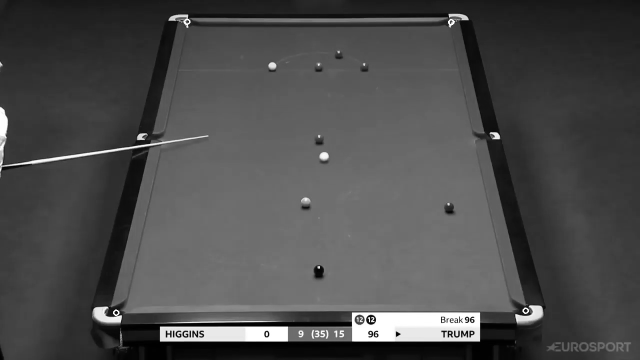

3


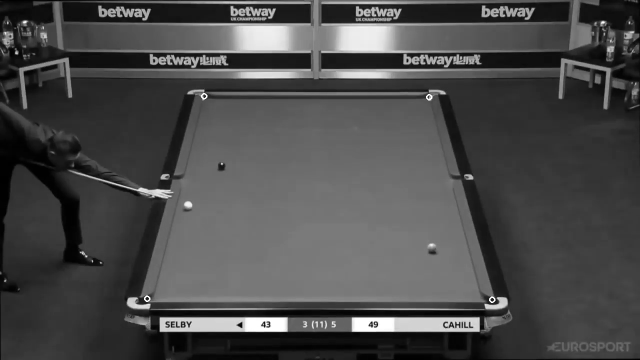

4


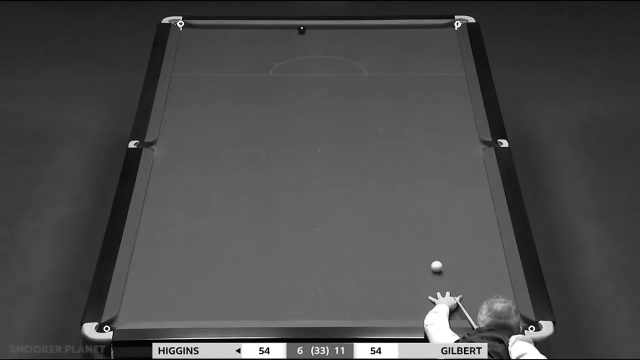

5


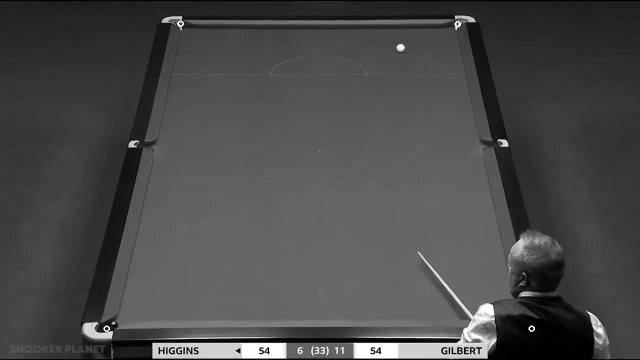

6


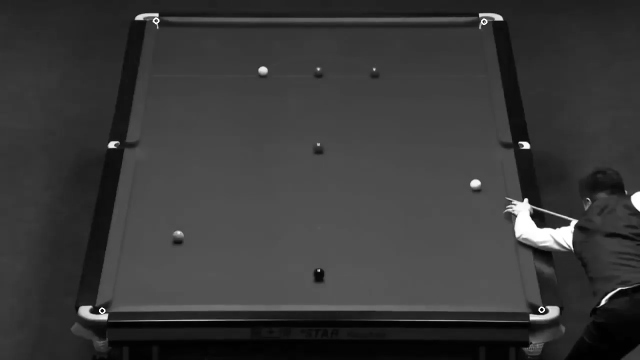

7


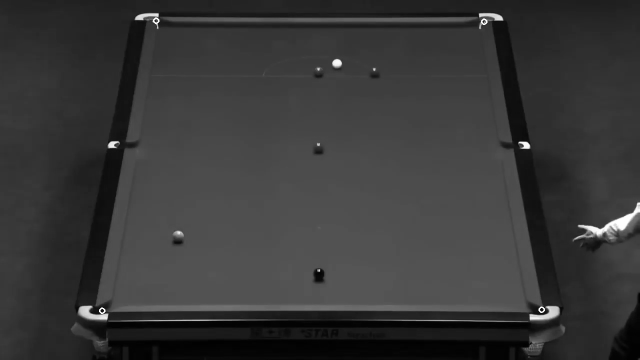

8


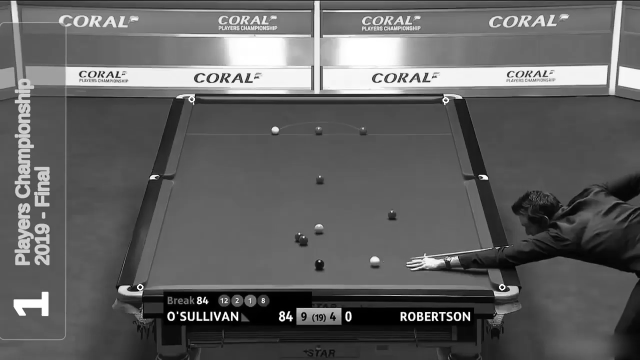

9


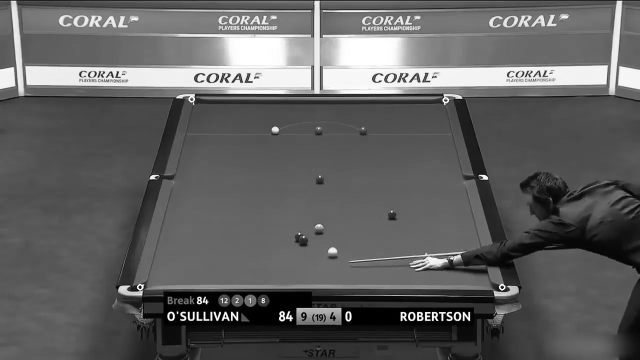

10


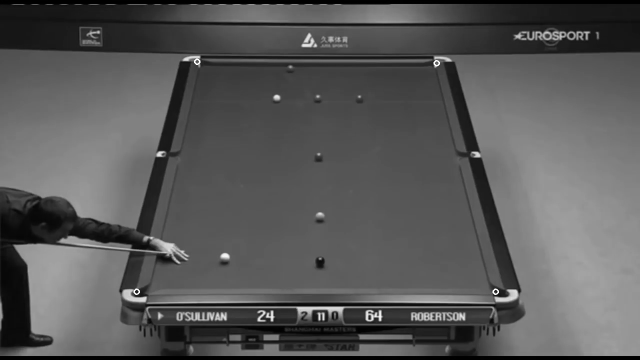

11


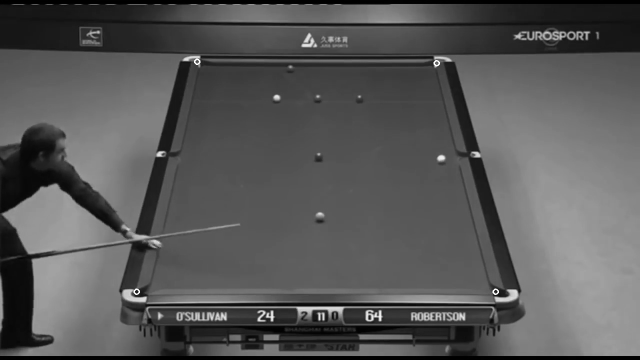

12


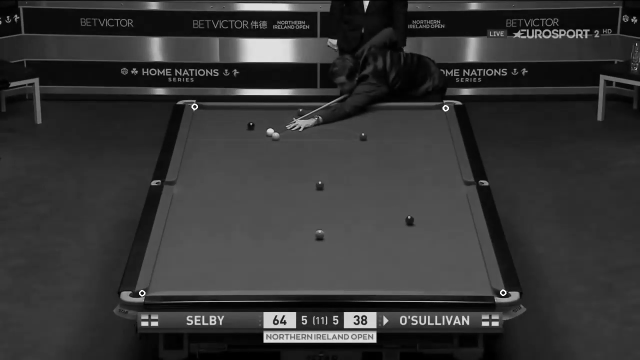

13


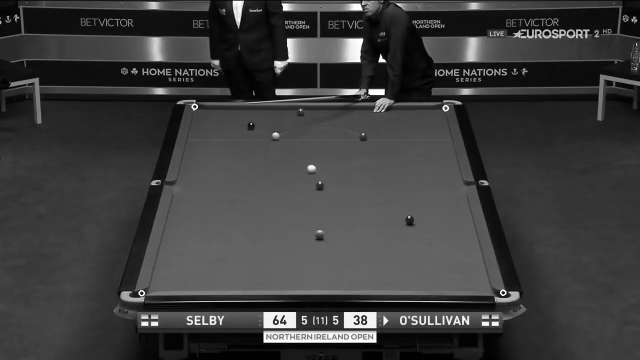

14


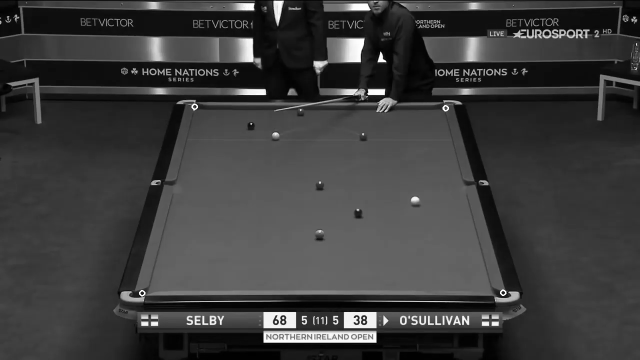

15


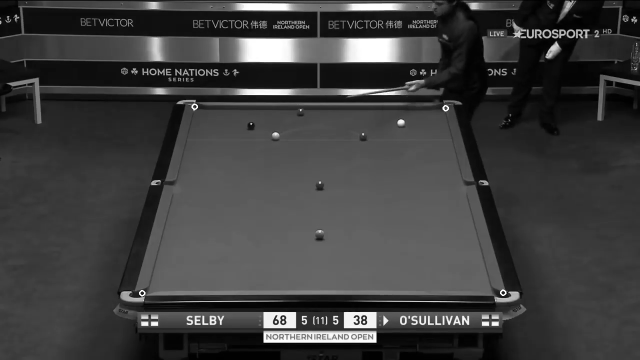

16


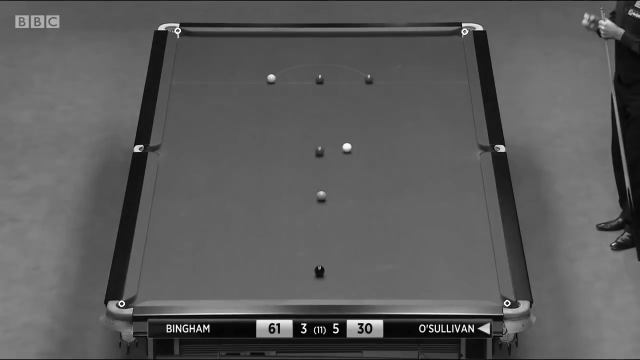

17


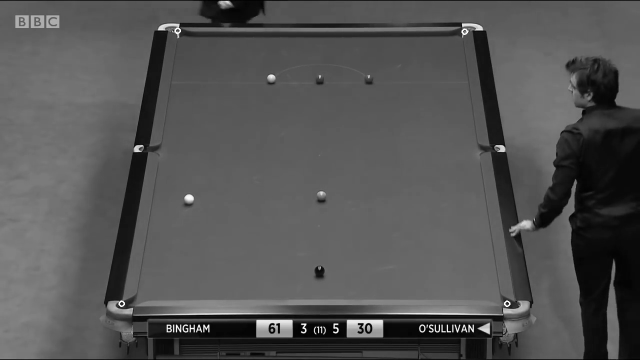

18


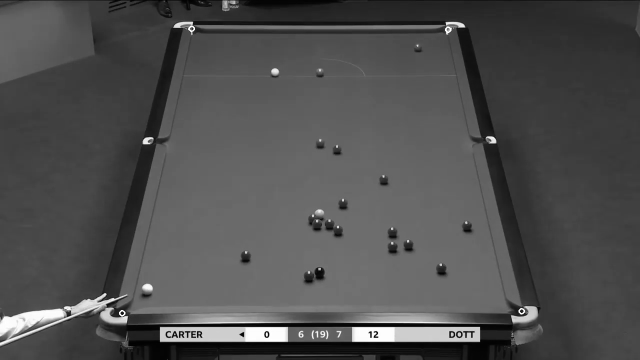

19


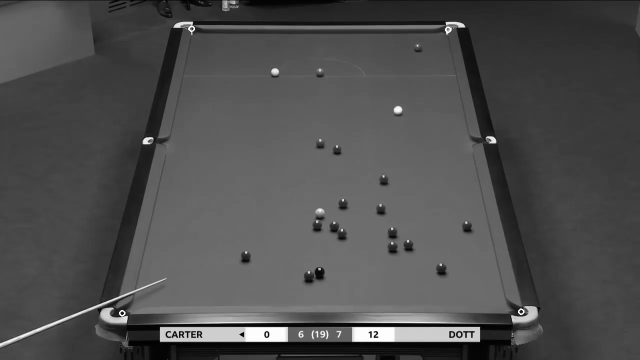

20


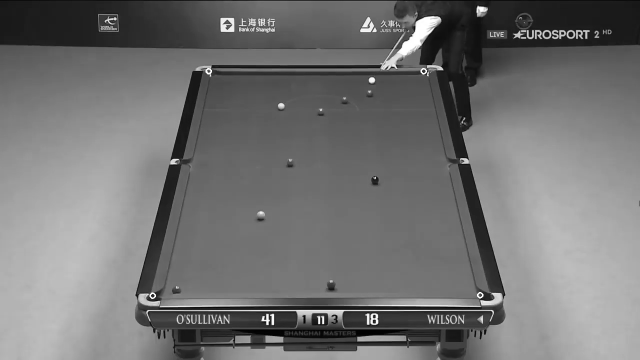

21


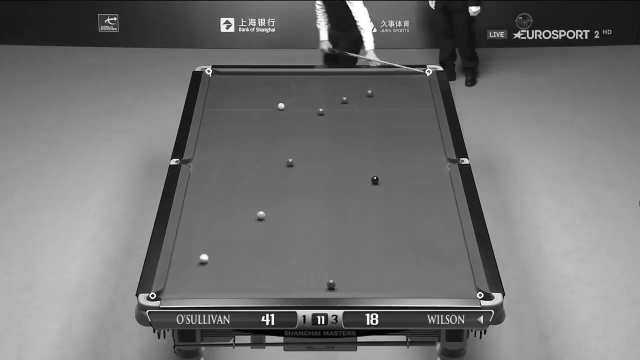

22


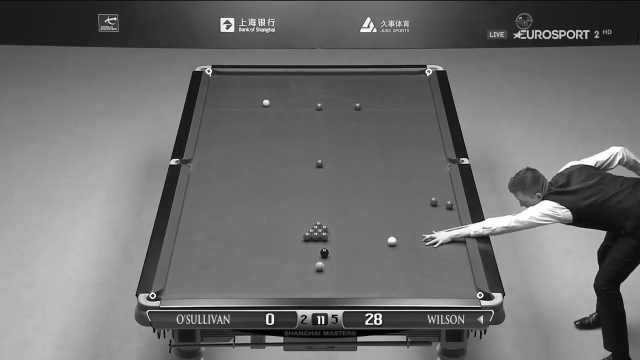

23


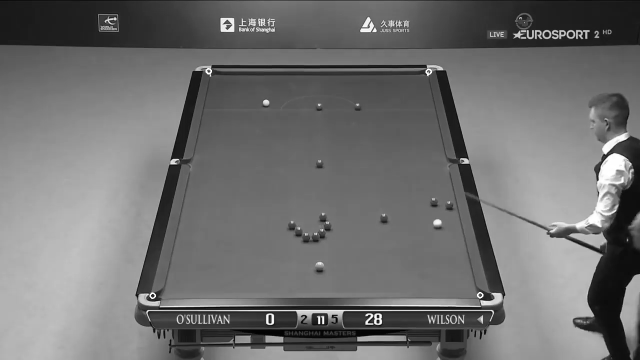

24


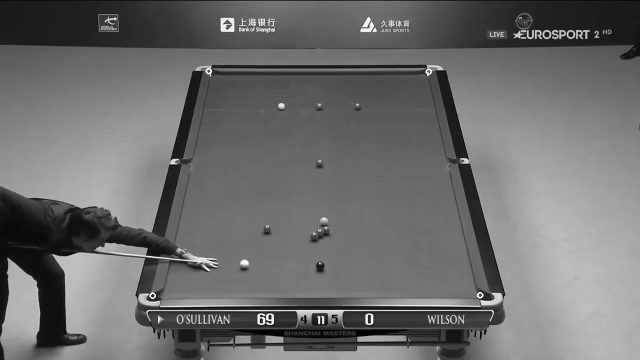

25


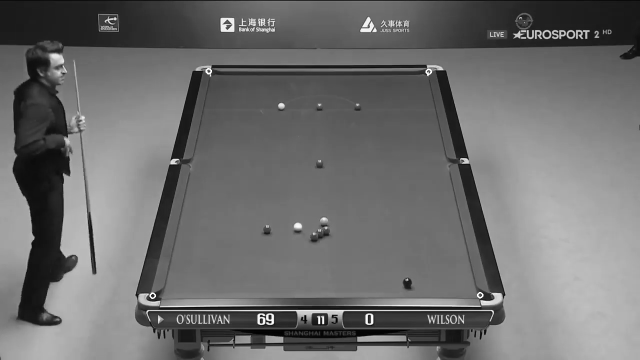

26


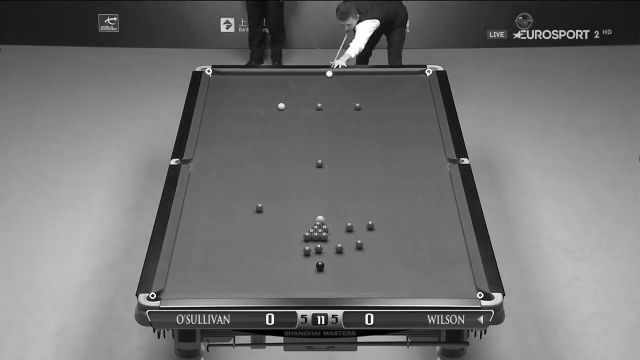

27


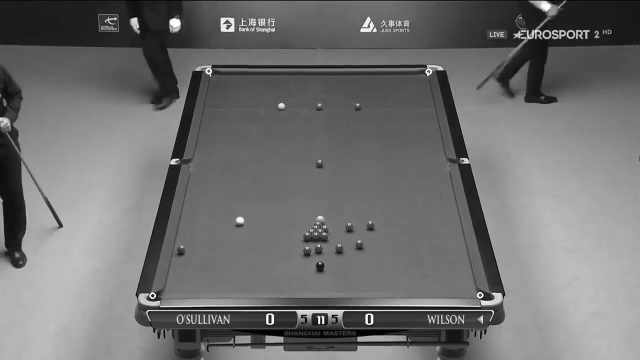

28


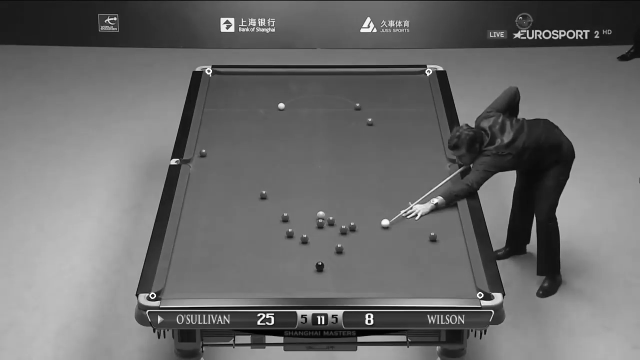

29


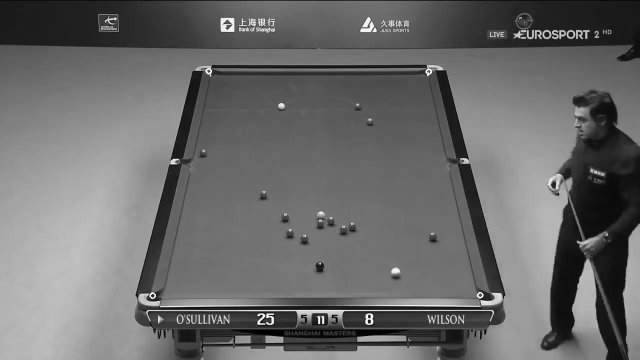

30


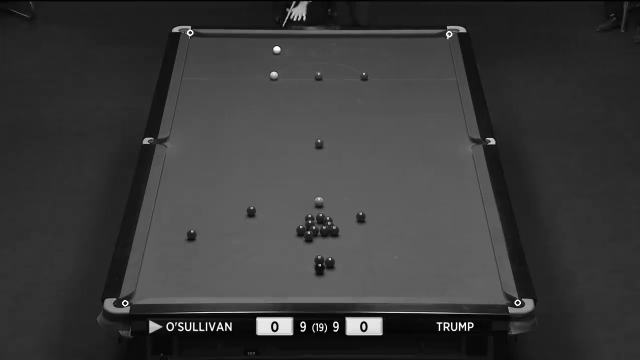

31


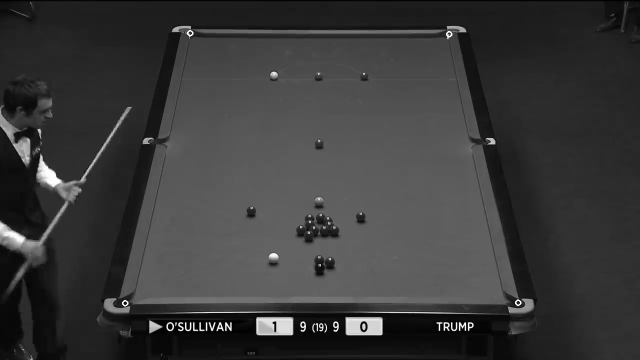

32


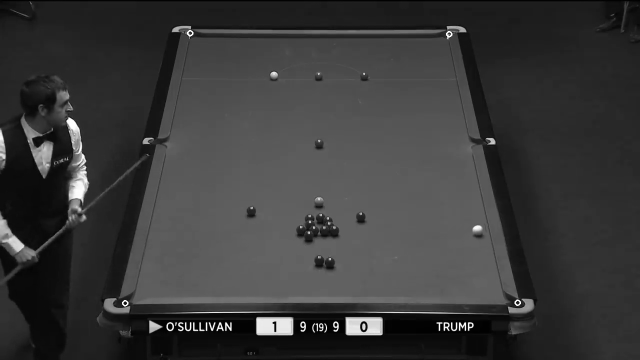

33


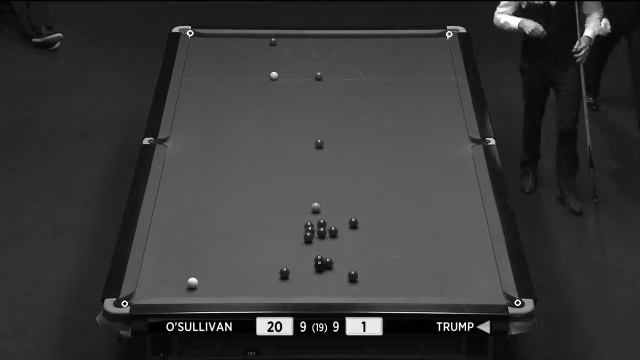

34


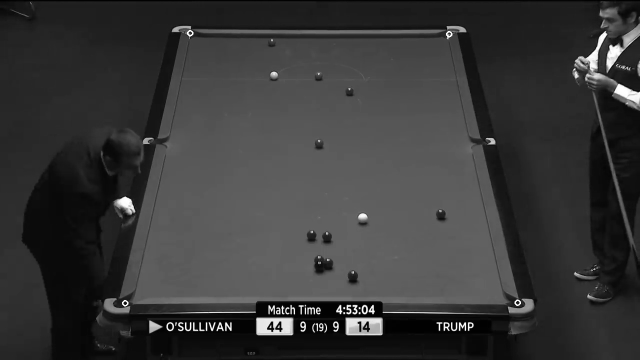

35


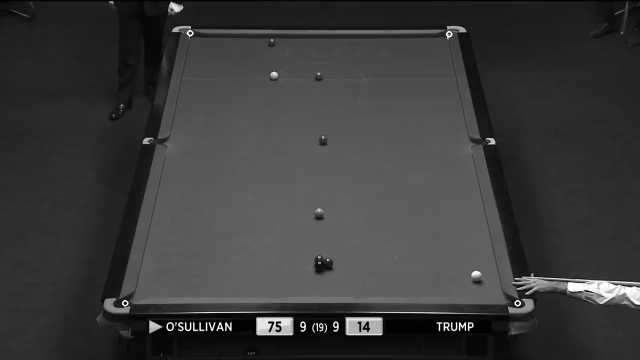

36


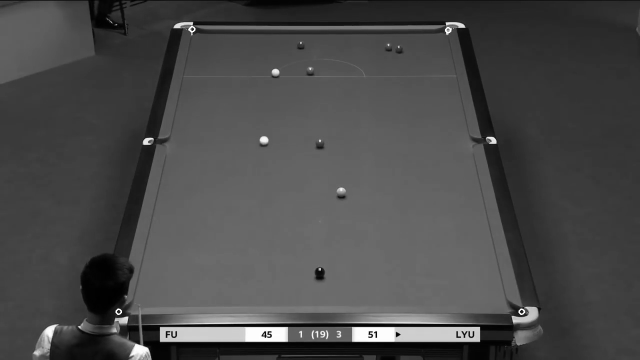

37


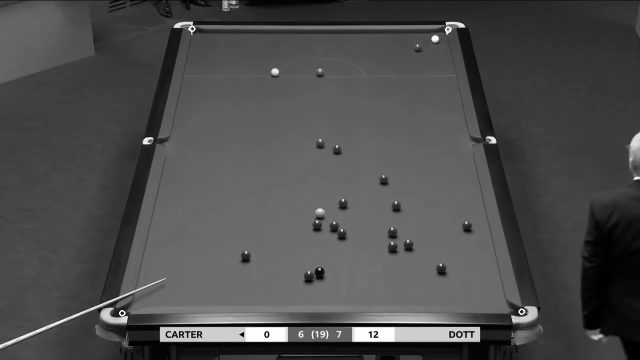

38


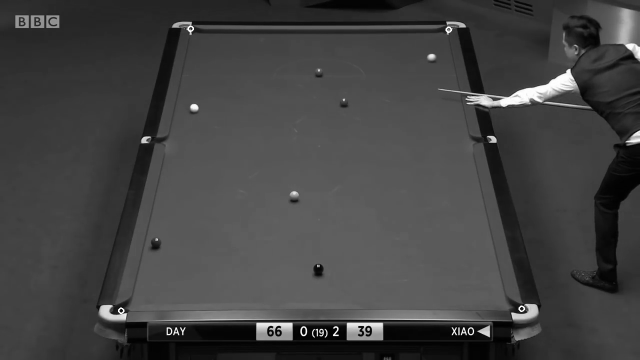

39


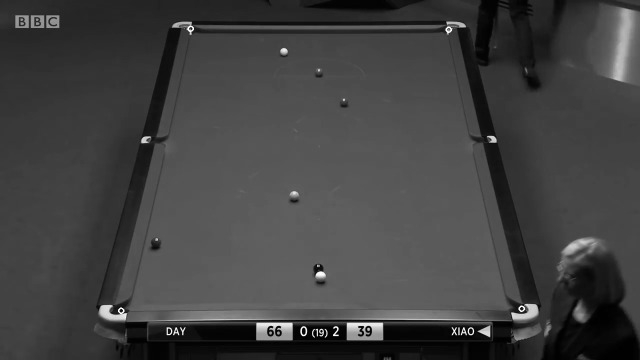

40


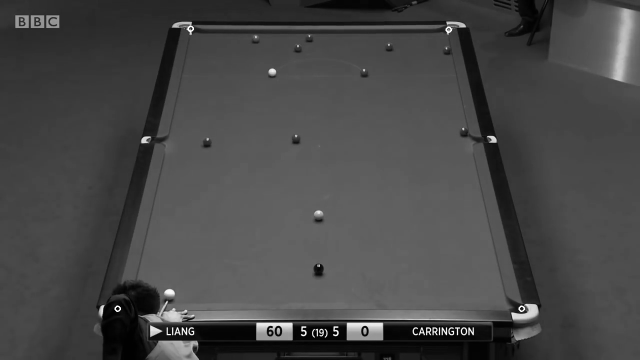

41


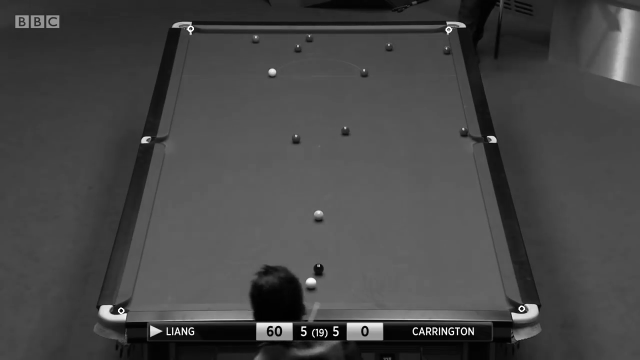

42


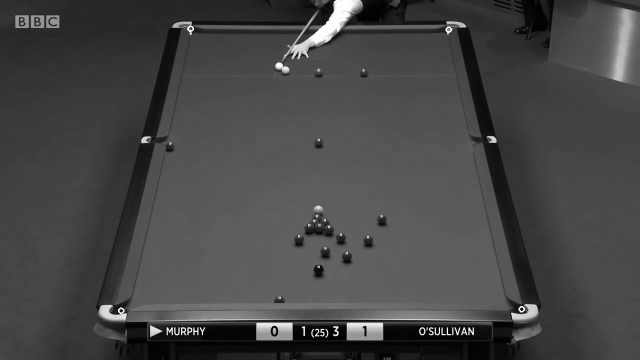

43


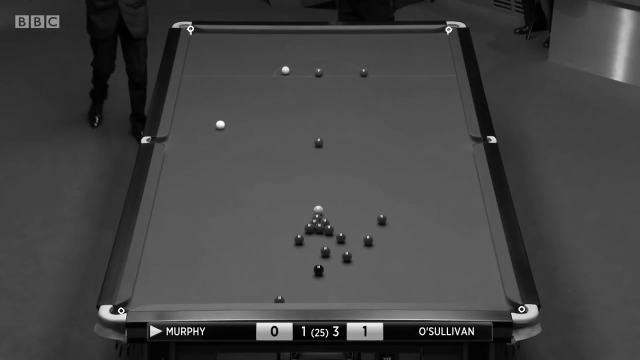

44


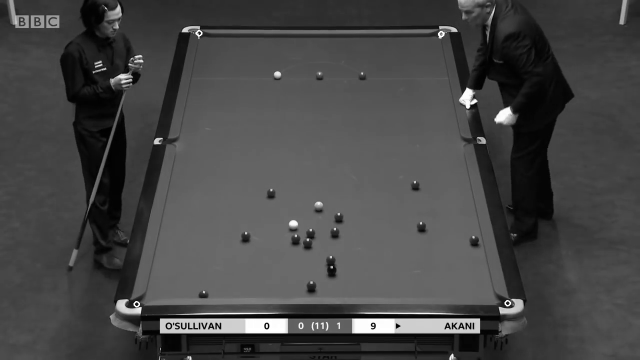

45


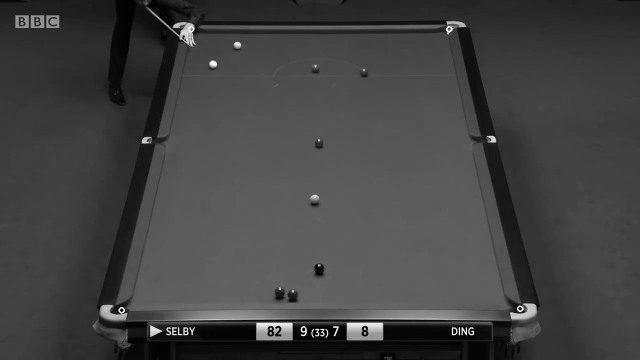

46


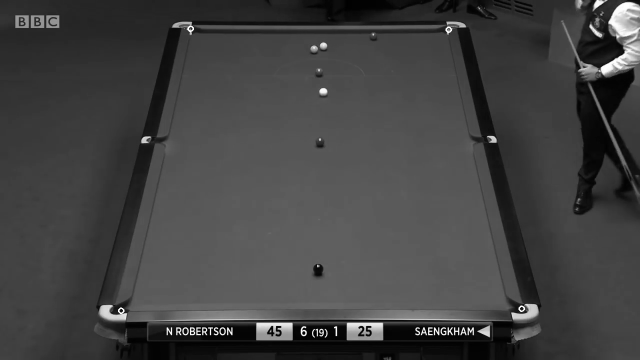

47


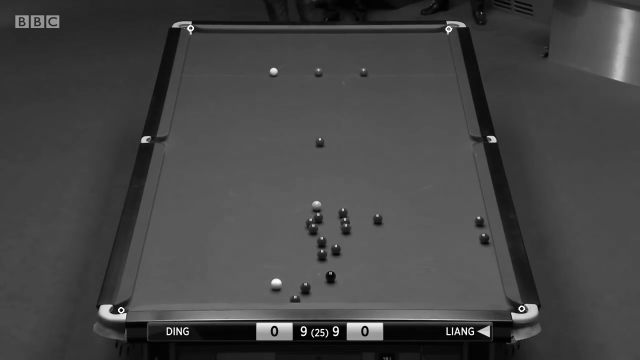

48


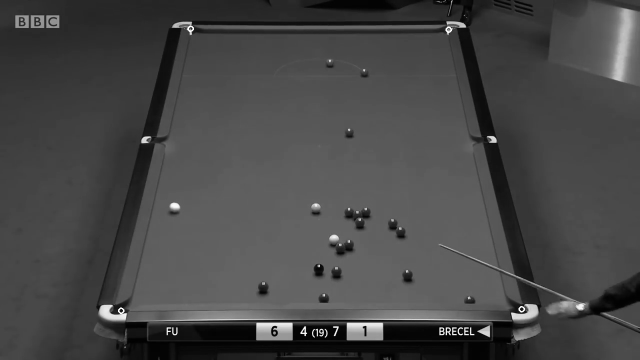

49


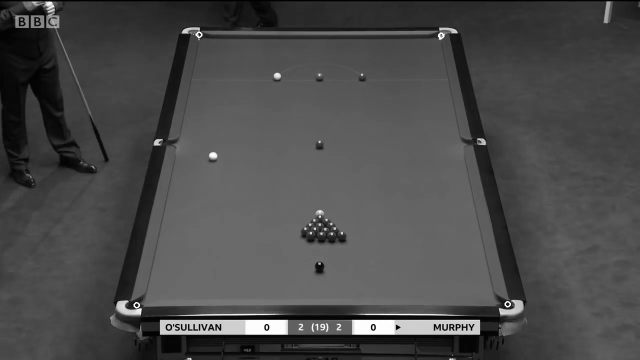

50


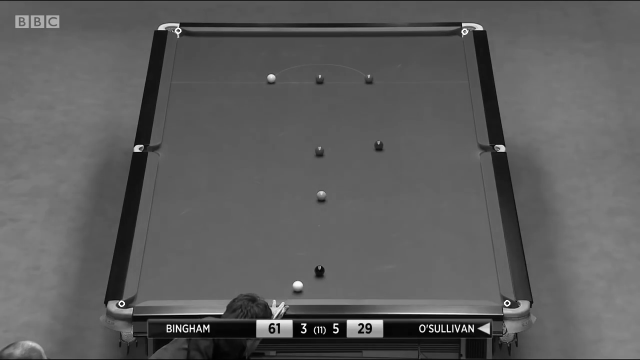

In [0]:
#8
for i in range(1, 51):
    print(i)
    imgColor = cv.imread(folder_in + 'Task1/'+ str(i) +'.jpg')
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
    
    bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner = get_corners(img.copy(), True)

In [0]:
#9
def get_balls_template_matching(img, template, threshold):
    methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
    meth = methods[1]
    method = eval(meth)

    # Apply template Matching
    res = cv.matchTemplate(img,template,method)

    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc

    loc = np.where(res >= threshold)
    return loc[::-1]

In [0]:
#10
# Malisiewicz et al.
def non_max_suppression_fast(boxes, overlapThresh):
	# if there are no boxes, return an empty list
	if len(boxes) == 0:
		return []
	# if the bounding boxes integers, convert them to floats --
	# this is important since we'll be doing a bunch of divisions
	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")
	# initialize the list of picked indexes	
	pick = []
	# grab the coordinates of the bounding boxes
	x1 = boxes[:,0]
	y1 = boxes[:,1]
	x2 = boxes[:,2]
	y2 = boxes[:,3]
	# compute the area of the bounding boxes and sort the bounding
	# boxes by the bottom-right y-coordinate of the bounding box
	area = (x2 - x1 + 1) * (y2 - y1 + 1)
	idxs = np.argsort(y2)
	# keep looping while some indexes still remain in the indexes
	# list
	while len(idxs) > 0:
		# grab the last index in the indexes list and add the
		# index value to the list of picked indexes
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)
		# find the largest (x, y) coordinates for the start of
		# the bounding box and the smallest (x, y) coordinates
		# for the end of the bounding box
		xx1 = np.maximum(x1[i], x1[idxs[:last]])
		yy1 = np.maximum(y1[i], y1[idxs[:last]])
		xx2 = np.minimum(x2[i], x2[idxs[:last]])
		yy2 = np.minimum(y2[i], y2[idxs[:last]])
		# compute the width and height of the bounding box
		w = np.maximum(0, xx2 - xx1 + 1)
		h = np.maximum(0, yy2 - yy1 + 1)
		# compute the ratio of overlap
		overlap = (w * h) / area[idxs[:last]]
		# delete all indexes from the index list that have
		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlapThresh)[0])))
	# return only the bounding boxes that were picked using the
	# integer data type
	return boxes[pick].astype("int")

In [0]:
#11
def false_pozitive(img, box, threshold):
    patch = img[box[1]:box[3], box[0]:box[2]]

    low_green = (46, 100, 0) #46
    high_green = (65, 255, 255) #65

    patch = cv.cvtColor(patch, cv.COLOR_BGR2HSV)
    # get the mask for green
    mask_hsv = cv.inRange(patch, low_green, high_green) // 255
    
    return np.sum(mask_hsv) // (mask_hsv.shape[0] * mask_hsv.shape[1]) > threshold

    return False

In [0]:
#12
def get_box_color(img, box, show_results = True):

    img = cv.copyMakeBorder(img, 10, 10, 10, 10, cv.BORDER_REFLECT)
    
    patch = img[box[1]+5:box[3]+15, box[0]+5:box[2]+15]
    
    if show_results:
        cv2_imshow(patch)

    low_green = (0, 100, 0)
    high_green = (60, 255, 60)

    low_white = (80, 140, 65)
    high_white = (255, 255, 255)
 
    low_blue = (91, 0, 0)
    high_blue = (180, 135, 55)

    low_dark_green = (37, 60, 0)
    high_dark_green = (60, 255, 30)

    low_yellow = (0, 107, 68)
    high_yellow = (60, 255, 255)

    low_red = (0, 0, 50)
    high_red = (30, 50, 255)

    low_pink = (45, 0, 166)
    high_pink = (255, 162, 255)

    low_brown = (0, 52, 37)
    high_brown = (45, 105, 166)

    low_black = (0, 0, 0)
    high_black = (45, 38, 55)

    #patch_hsv = cv.cvtColor(patch, cv.COLOR_BGR2HSV)

    colors_dict = {
        0: "green",
        1: "white",
        2: "red",
        3: "blue",
        4: "pink",
        5: "dark_green",
        6: "brown",
        7: "yellow",
        8: "black"
    }

    hist = np.zeros(9)

    height, width, depth = patch.shape
    for i in range(0, height):
        for j in range(0, width):
            score_green = np.sum(cv.inRange(patch, low_green, high_green))
            score_white = np.sum(cv.inRange(patch, low_white, high_white))
            score_red = np.sum(cv.inRange(patch,low_red,high_red))
            score_blue = np.sum(cv.inRange(patch, low_blue, high_blue))
            score_pink = np.sum(cv.inRange(patch, low_pink, high_pink))
            score_dark_green = np.sum(cv.inRange(patch, low_dark_green, high_dark_green))
            score_brown = np.sum(cv.inRange(patch, low_brown, high_brown))
            score_yellow = np.sum(cv.inRange(patch, low_yellow, high_yellow)) 
            score_black = np.sum(cv.inRange(patch, low_black, high_black))

            scores = [score_green, score_white, score_red, score_blue, score_pink, score_dark_green, score_brown, score_yellow, score_black]
            hist = np.add(hist, scores)
            #idx = np.argmax(np.array(scores))
        
    idxs = np.argsort(hist)

    if show_results:
        print(colors_dict[idxs[8]], colors_dict[idxs[7]], colors_dict[idxs[6]])
        print(hist[idxs[8]], hist[idxs[7]], hist[idxs[6]])
    return [colors_dict[idxs[8]], colors_dict[idxs[7]], colors_dict[idxs[6]]]

In [0]:
#13
def process_colors(colors):
    result = {
        "white" : 0,
        "red" : 0,
        "blue" : 0,
        "pink" : 0,
        "dark_green" : 0,
        "brown" : 0,
        "yellow" : 0,
        "black" : 0
    }

    for color in colors:
        if color[0] != "green":
            result[color[0]] += 1
        else:
            if color[1] != "pink" and color[2] == "pink":
                result["pink"] += 1
            else:
                if color[1] == "white" and color[2] == "dark_green":
                    result["dark_green"] += 1
                else:
                    result[color[1]] += 1
    
    if result["white"] > 1:
        result["white"] = 1
    if result["black"] > 1:
        result["black"] = 1
    if result["yellow"] > 1:
        result["red"] = result["red"] + result["yellow"] - 1
        result["yellow"] = 1
    if result["brown"] > 1:
        result["red"] = result["red"] + result["brown"] - 1
        result["brown"] = 1
    if result["pink"] > 1:
        result["red"] = result["red"] + result["pink"] - 1
        result["pink"] = 1

    if result["dark_green"] == 2 and result["blue"] == 0:
        result["dark_green"] = 1
        result["blue"] = 1
    if result["dark_green"] == 0 and result["blue"] == 2:
        result["dark_green"] = 1
        result["blue"] = 1

    if result["dark_green"] > 1:
        result["dark_green"] = 1

    if result["blue"] > 1:
        result["blue"] = 1

    num_balls = 0
    for _, number in result.items(): 
        num_balls += number

    return result, num_balls

1


green black white
98501400.0 65002050.0 5102550.0


green red black
95104800.0 39412800.0 13280400.0


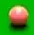

green white pink
234263400.0 37931250.0 35200200.0


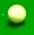

green white yellow
257629050.0 63421050.0 13351800.0


green blue dark_green
112240800.0 20777400.0 9210600.0


green red brown
109884600.0 30416400.0 11781000.0


green red brown
114811200.0 28060200.0 13708800.0


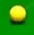

green yellow white
273711900.0 49765800.0 7889700.0


green brown yellow
125521200.0 23776200.0 8353800.0


green dark_green white
147583800.0 15850800.0 4498200.0


black green white
23262120.0 22105440.0 4369680.0


green black white
23332500.0 20272500.0 5992500.0


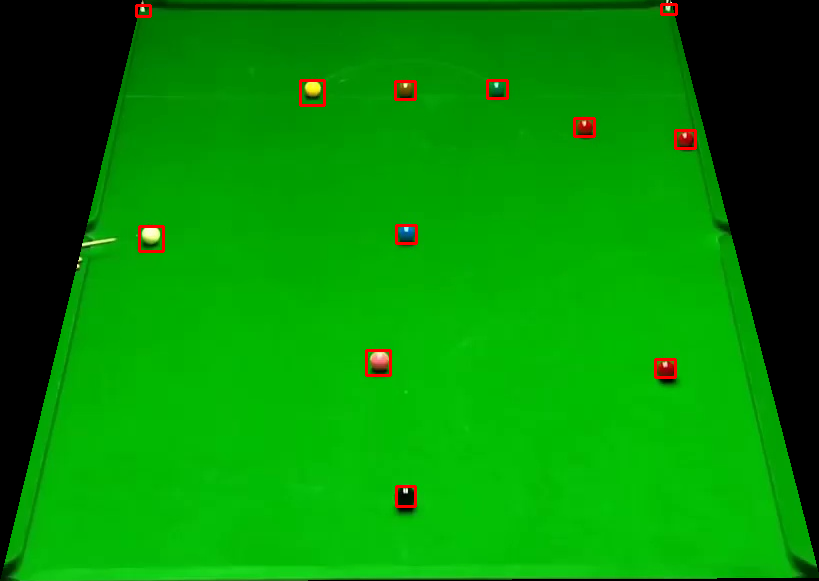

2


green black white
98057700.0 65223900.0 5324400.0


green red black
93177000.0 38984400.0 13923000.0


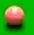

green pink white
232746150.0 37020900.0 35200200.0


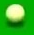

green white yellow
264608400.0 71310750.0 8496600.0


green blue dark_green
110955600.0 21420000.0 10710000.0


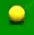

green yellow white
274015350.0 50372700.0 9103500.0


green brown yellow
124450200.0 23133600.0 8353800.0


green dark_green white
141586200.0 16493400.0 4498200.0


green red brown
118238400.0 21848400.0 17350200.0


black green white
22876560.0 22233960.0 4112640.0


green black white
23776200.0 19920600.0 5911920.0


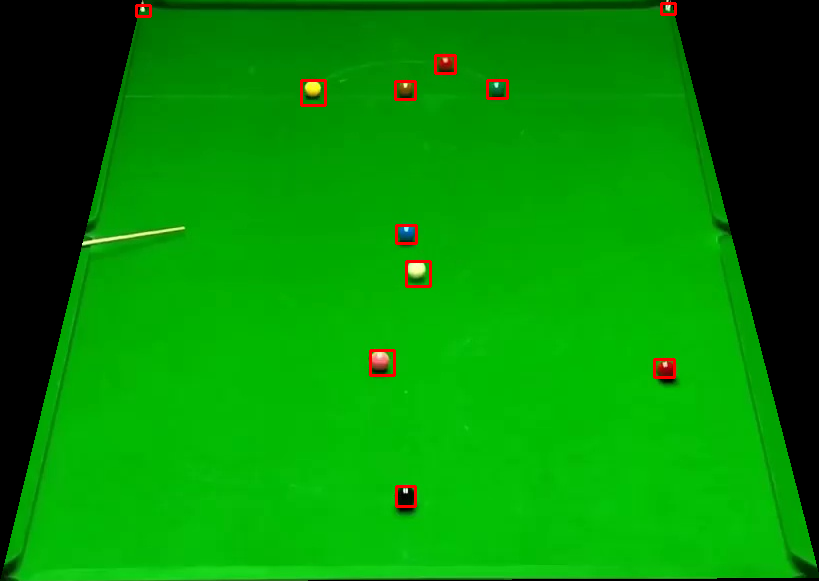

3


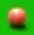

green yellow pink
234566850.0 28827750.0 28827750.0


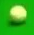

green white yellow
277656750.0 47945100.0 16386300.0


green black white
100755090.0 7807590.0 2602530.0


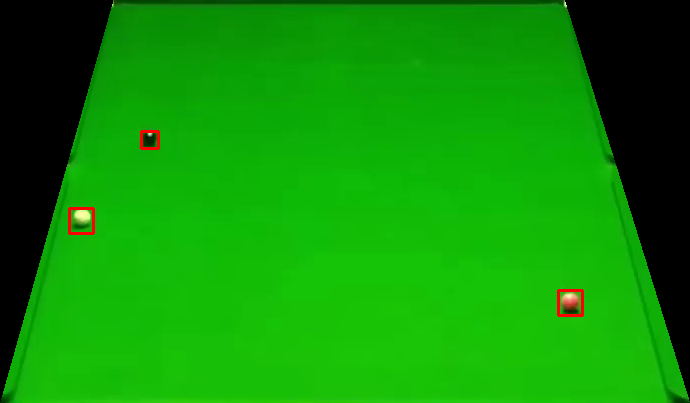

4


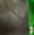

green black brown
20938050.0 18207000.0 14869050.0


black brown yellow
32772600.0 4712400.0 0.0


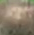

white pink black
133214550.0 33986400.0 0.0


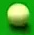

green white yellow
203008050.0 79200450.0 27007050.0


green black white
47403225.0 28627830.0 2230740.0


green black white
19635000.0 18742500.0 6757500.0


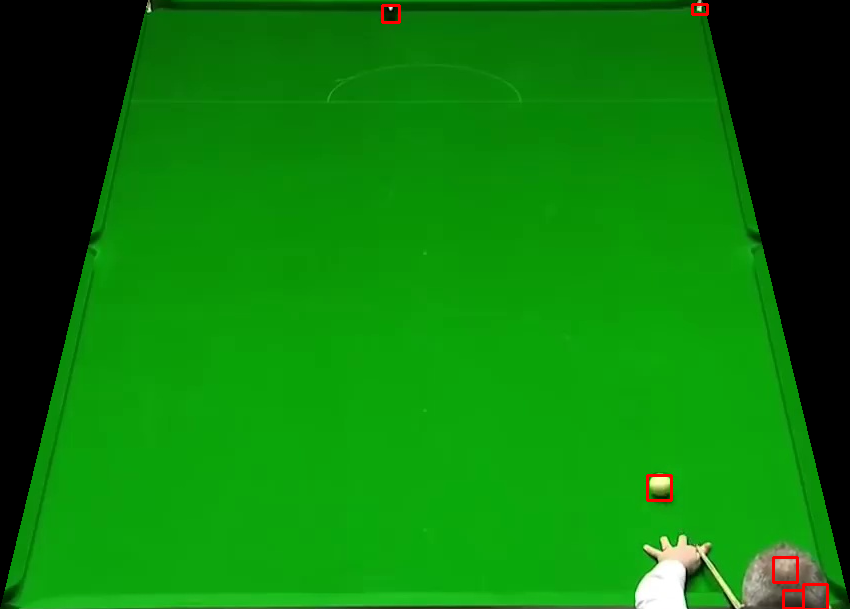

5


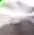

white pink green
236994450.0 5158650.0 303450.0


black green white
26346600.0 11952360.0 3213000.0


black yellow brown
95533200.0 0.0 0.0


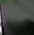

black white pink
88910850.0 5765550.0 303450.0


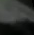

black yellow brown
154759500.0 0.0 0.0


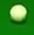

green white yellow
268249800.0 59172750.0 5765550.0


green black white
20145000.0 18232500.0 6757500.0
greseala - ground_truth: 0 me:  1 black
1 2
{'white': 1, 'black': 0, 'pink': 0, 'blue': 0, 'green': 0, 'brown': 0, 'yellow': 0, 'red': 0}
{'white': 1, 'red': 0, 'blue': 0, 'pink': 0, 'dark_green': 0, 'brown': 0, 'yellow': 0, 'black': 1}
False
6


green black yellow
65545200.0 59761800.0 0.0


green black white
83323800.0 62974800.0 3641400.0


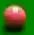

green pink black
168111300.0 50676150.0 29434650.0


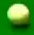

green white yellow
206042550.0 77076300.0 23365650.0


green blue dark_green
82681200.0 27203400.0 11138400.0


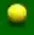

green yellow brown
134124900.0 61903800.0 17600100.0


green dark_green white
45624600.0 7282800.0 4712400.0


green brown black
40912200.0 37699200.0 7068600.0


white black green
5355000.0 3825000.0 2422500.0


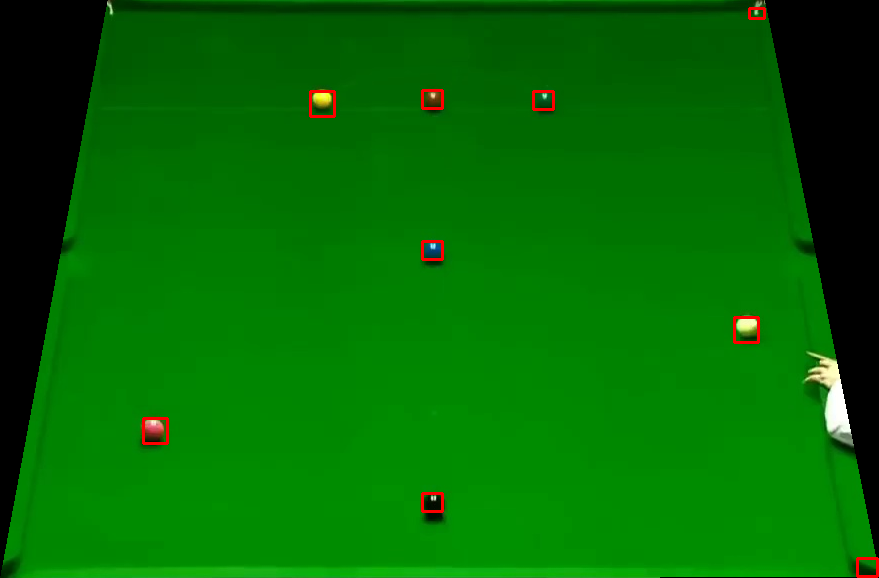

7


green black yellow
65759400.0 57191400.0 0.0


green black white
82681200.0 63831600.0 3641400.0


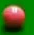

green pink red
171752700.0 46124400.0 28827750.0


green blue dark_green
84180600.0 29773800.0 10067400.0


green dark_green white
40912200.0 7711200.0 5355000.0


green brown red
52693200.0 31487400.0 10281600.0


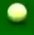

green white yellow
130180050.0 70096950.0 10013850.0


white black green
5227500.0 3825000.0 1657500.0


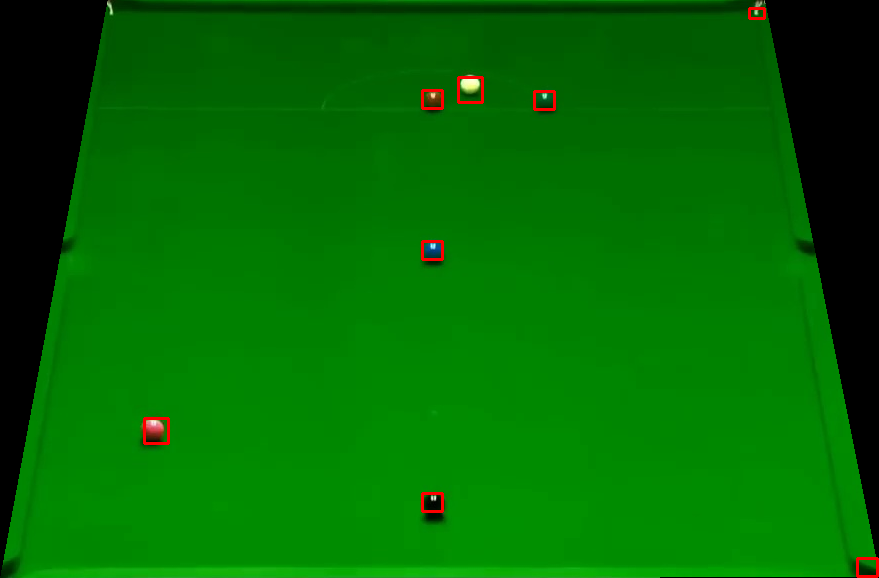

8


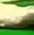

white green brown
170538900.0 57655500.0 41876100.0


green black dark_green
109150200.0 36161550.0 8208450.0


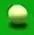

green white yellow
248525550.0 56745150.0 20938050.0


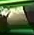

white black brown
85572900.0 69186600.0 32469150.0


red green brown
26392500.0 14407500.0 4462500.0


green red brown
27503280.0 14651280.0 5654880.0


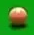

green brown white
253380750.0 29434650.0 28220850.0


green red brown
105600600.0 29773800.0 13708800.0


green blue dark_green
117381600.0 21420000.0 19063800.0


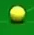

green white yellow
285546450.0 22758750.0 22455300.0


green dark_green white
152296200.0 25704000.0 2784600.0


green brown yellow
132804000.0 19278000.0 4926600.0
greseala - ground_truth: 3 me:  4 red
greseala - ground_truth: 1 me:  0 pink
greseala - ground_truth: 1 me:  0 yellow
10 9
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 3}
{'white': 1, 'red': 4, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 0, 'black': 1}
False
9


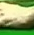

white green brown
175090650.0 56441700.0 42483000.0


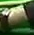

white black brown
91641900.0 71614200.0 42786450.0


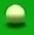

green white yellow
254291100.0 59172750.0 19420800.0


red green brown
25189920.0 16579080.0 6297480.0


green red brown
26860680.0 15807960.0 6040440.0


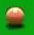

green brown white
252470400.0 28827750.0 27310500.0


green red brown
107100000.0 29773800.0 11138400.0


green blue dark_green
116739000.0 22705200.0 19063800.0


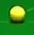

green yellow white
283118850.0 24579450.0 19420800.0


green dark_green white
149297400.0 26560800.0 2998800.0


green brown yellow
131090400.0 21205800.0 4712400.0
greseala - ground_truth: 3 me:  4 red
greseala - ground_truth: 1 me:  0 pink
9 9
{'white': 1, 'black': 0, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 3}
{'white': 1, 'red': 4, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 0}
False


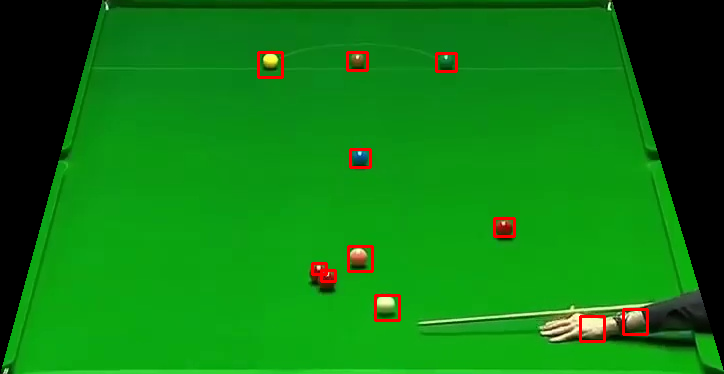

10


green black white
109150200.0 32390100.0 1996650.0


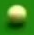

green white yellow
227890950.0 51283050.0 23062200.0


white black pink
57619800.0 48623400.0 19063800.0


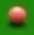

green pink white
230318550.0 32165700.0 23062200.0


green blue dark_green
115668000.0 17564400.0 16707600.0


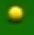

green yellow brown
247311750.0 42786450.0 31862250.0


green white dark_green
146298600.0 3427200.0 1499400.0


green brown pink
110098800.0 40483800.0 3641400.0


brown red pink
13237560.0 9639000.0 4369680.0


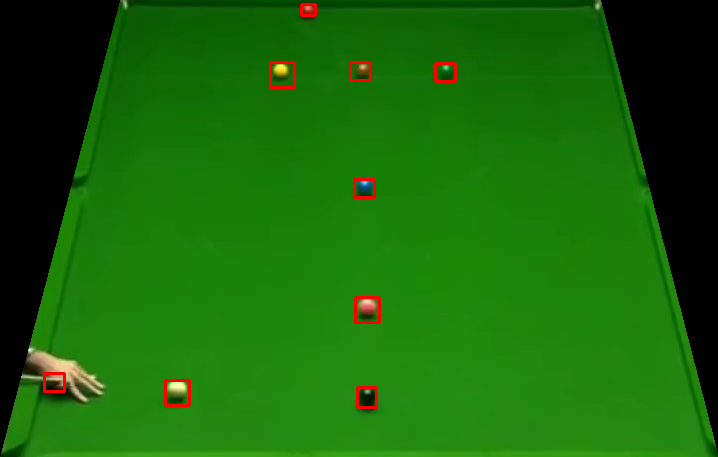

11


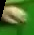

green white brown
129876600.0 64331400.0 56441700.0


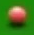

green pink white
228801300.0 30951900.0 22455300.0


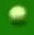

green white yellow
274925700.0 43696800.0 15475950.0


green blue dark_green
115453800.0 17350200.0 16921800.0


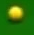

green yellow brown
242760000.0 41876100.0 31558800.0


green white dark_green
146084400.0 3427200.0 1713600.0


green brown white
110313000.0 42197400.0 3641400.0


brown red pink
12980520.0 9381960.0 4369680.0


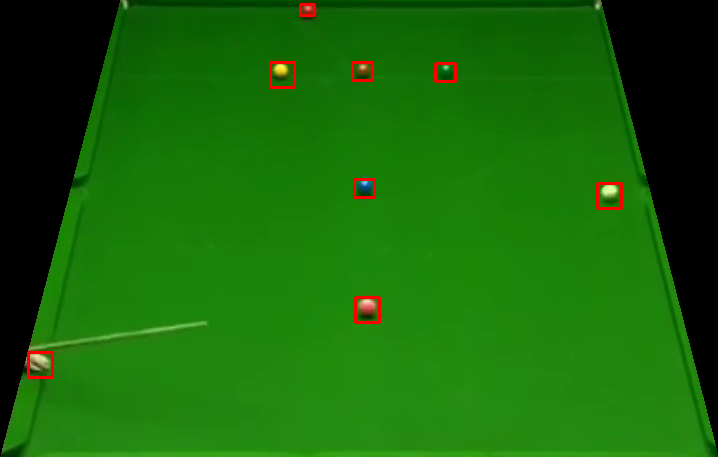

12


green brown black
93177000.0 15850800.0 9639000.0


green red black
108706500.0 26178300.0 20410200.0


green dark_green blue
111384000.0 18207000.0 8782200.0


green dark_green white
65435040.0 18589500.0 2788425.0


green brown white
32345730.0 25467615.0 20262555.0


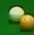

green white brown
118042050.0 48248550.0 35503650.0


green black white
31602150.0 20820240.0 1858950.0


brown red white
17350200.0 4626720.0 3213000.0
greseala - ground_truth: 1 me:  3 red
greseala - ground_truth: 1 me:  0 pink
greseala - ground_truth: 1 me:  0 yellow
8 8
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 1}
{'white': 1, 'red': 3, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 0, 'black': 1}
False


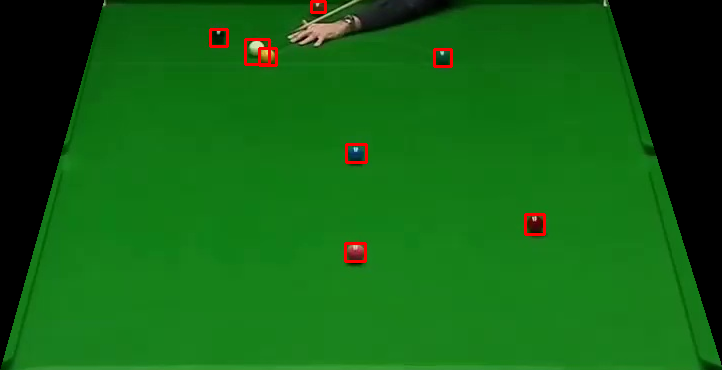

13


green pink brown
98532000.0 17136000.0 11138400.0


green red black
112699800.0 29284200.0 17082450.0


green dark_green blue
116524800.0 21420000.0 16921800.0


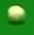

green white yellow
277656750.0 48248550.0 12744900.0


green yellow brown
77704110.0 19518975.0 14499810.0


green dark_green white
96293610.0 15801075.0 3160215.0


green black white
84954015.0 17288235.0 2044845.0


brown green white
20948760.0 7711200.0 2698920.0


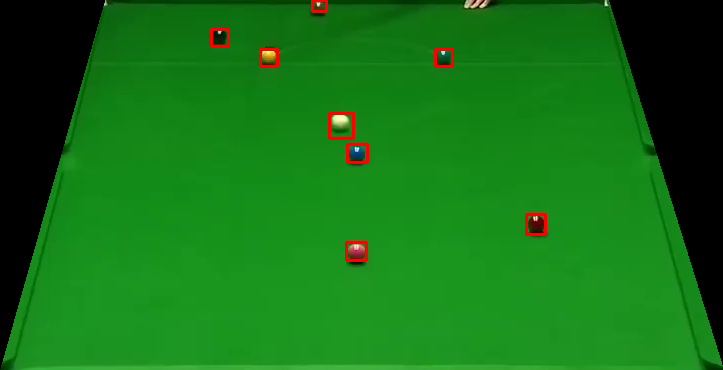

14


green pink brown
97032600.0 17350200.0 12423600.0


green red brown
117136800.0 23072400.0 14863950.0


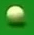

green white yellow
265215300.0 48855450.0 14869050.0


green blue dark_green
115239600.0 19706400.0 17778600.0


green yellow brown
81050220.0 18589500.0 15801075.0


green dark_green white
95921820.0 19333080.0 3346110.0


green black white
85139910.0 14685705.0 1858950.0


brown green white
21077280.0 7197120.0 2698920.0


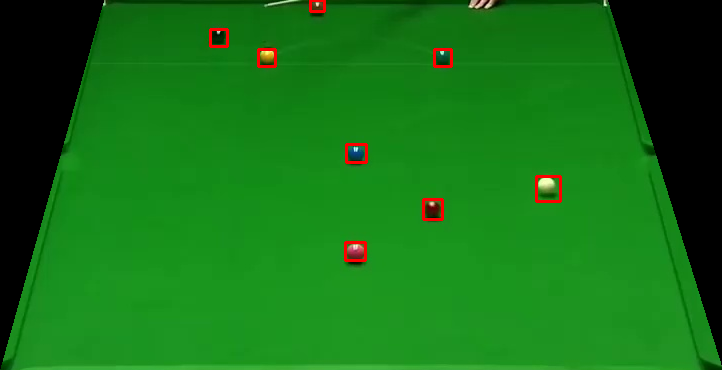

15


green pink brown
97246800.0 18849600.0 11995200.0


green blue dark_green
115668000.0 19706400.0 17992800.0


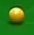

green yellow brown
273711900.0 30648450.0 18510450.0


green dark_green white
96293610.0 18031815.0 3160215.0


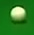

green white yellow
281905050.0 41269200.0 4248300.0


green black white
84954015.0 18589500.0 2044845.0


brown green white
21591360.0 7068600.0 2698920.0


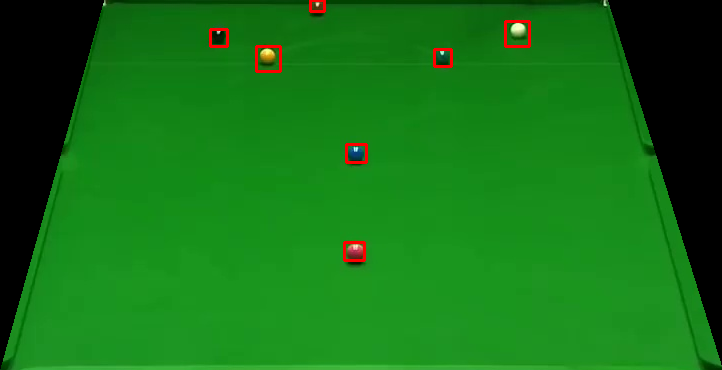

16


green black dark_green
99817200.0 49694400.0 5569200.0


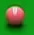

green pink white
238511700.0 40358850.0 20027700.0


green blue dark_green
98103600.0 32130000.0 14565600.0


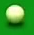

green white yellow
261573900.0 63421050.0 8800050.0


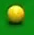

green yellow brown
262484250.0 51283050.0 11834550.0


green brown white
113954400.0 36842400.0 4284000.0


green dark_green white
128305800.0 24633000.0 4284000.0


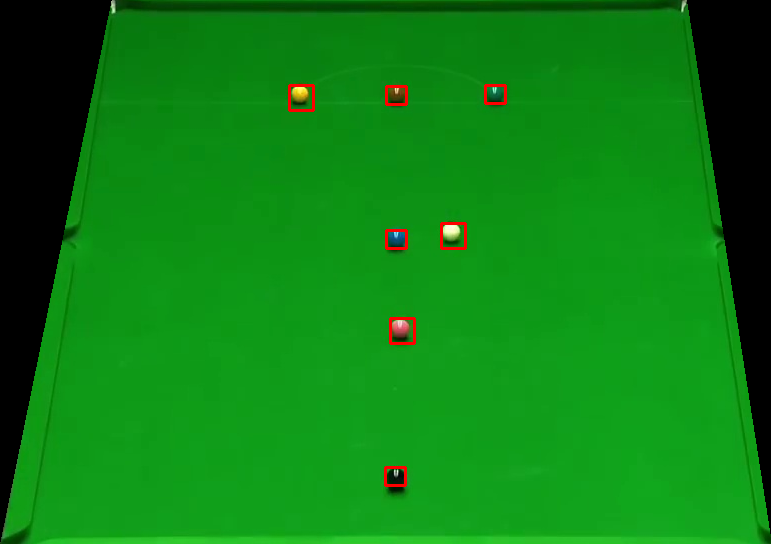

17


green black dark_green
101959200.0 48195000.0 8353800.0


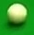

green white yellow
242760000.0 70096950.0 10924200.0


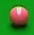

green pink white
236387550.0 40965750.0 19420800.0


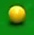

green yellow white
261270450.0 50372700.0 12744900.0


green brown black
114382800.0 33629400.0 4069800.0


green dark_green white
123379200.0 24847200.0 4498200.0


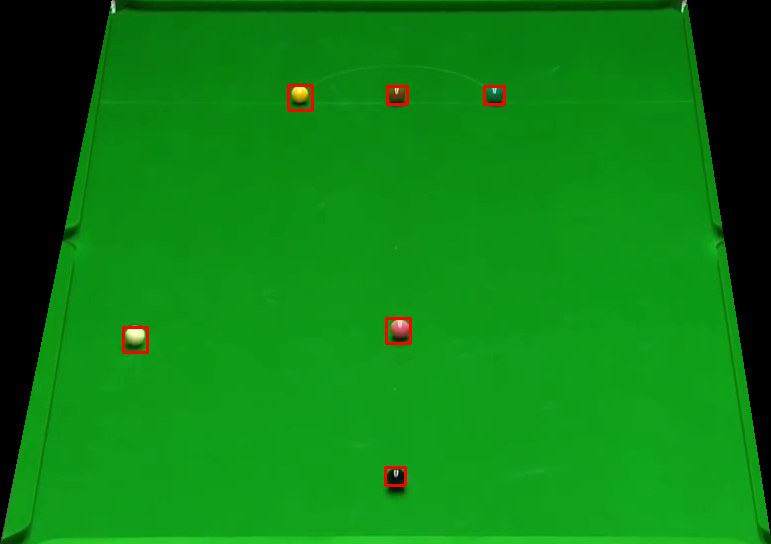

18


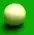

green white yellow
209077050.0 79200450.0 20634600.0


green red black
85465800.0 45410400.0 14779800.0


green black red
88518150.0 60565050.0 6655500.0


green red brown
93177000.0 42411600.0 13280400.0


green red black
89107200.0 41126400.0 16493400.0


green red black
88893000.0 38556000.0 14137200.0


green red black
94890600.0 41340600.0 13708800.0


green red black
95747400.0 37485000.0 14779800.0


green red black
69400800.0 55049400.0 16921800.0


green red black
95533200.0 36628200.0 12852000.0


green red black
66187800.0 52479000.0 13494600.0


red pink brown
35857080.0 6554520.0 3855600.0


green red pink
67044600.0 46053000.0 22705200.0


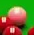

green red pink
145352550.0 60690000.0 54317550.0


green red black
99603000.0 35557200.0 10281600.0


green red brown
103244400.0 34057800.0 9424800.0


green red brown
107956800.0 29773800.0 10495800.0


green blue dark_green
110741400.0 25489800.0 11138400.0


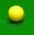

green yellow white
278263650.0 46124400.0 10013850.0


green brown yellow
126378000.0 21634200.0 13494600.0


green dark_green white
137088000.0 10710000.0 3427200.0


green black white
22185000.0 20400000.0 7012500.0


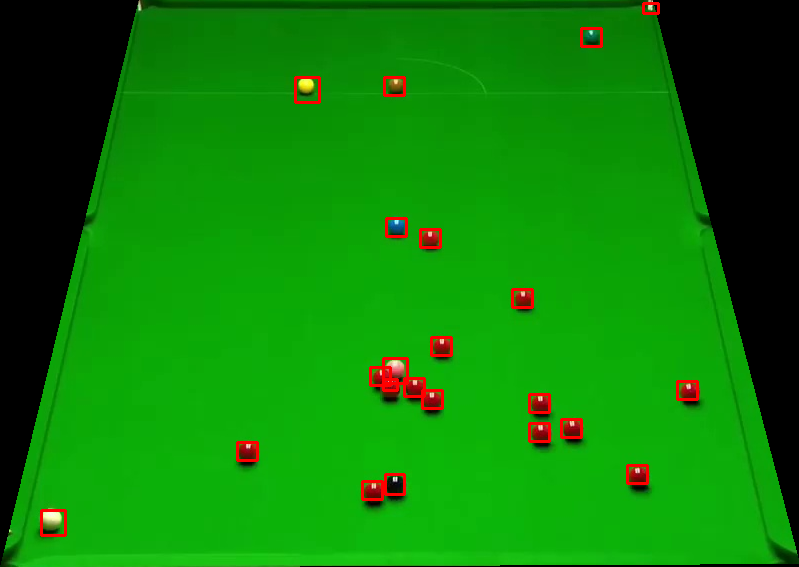

19


green red black
84823200.0 44767800.0 14994000.0


green black red
88518150.0 60565050.0 6877350.0


green red black
89321400.0 41983200.0 14565600.0


green red black
91677600.0 41126400.0 14565600.0


green red black
90392400.0 38984400.0 14137200.0


green red black
93391200.0 43054200.0 14994000.0


green red black
61475400.0 61261200.0 17564400.0


green red black
95319000.0 38127600.0 13708800.0


green red brown
85855950.0 49916250.0 13311000.0


green red brown
95533200.0 36414000.0 12637800.0


green red black
76041000.0 43268400.0 19063800.0


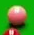

green pink white
202704600.0 43393350.0 40055400.0


green red brown
95104800.0 34057800.0 11138400.0


green red brown
98746200.0 38341800.0 10495800.0


green red brown
101530800.0 32772600.0 9853200.0


green red brown
108813600.0 31701600.0 9210600.0


green blue dark_green
114168600.0 24418800.0 8782200.0


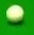

green white yellow
272194650.0 60690000.0 6675900.0


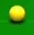

green yellow white
278870550.0 46731300.0 6979350.0


green brown yellow
125949600.0 21848400.0 13708800.0


green dark_green white
138587400.0 11781000.0 3427200.0


green black white
22312500.0 20400000.0 6757500.0


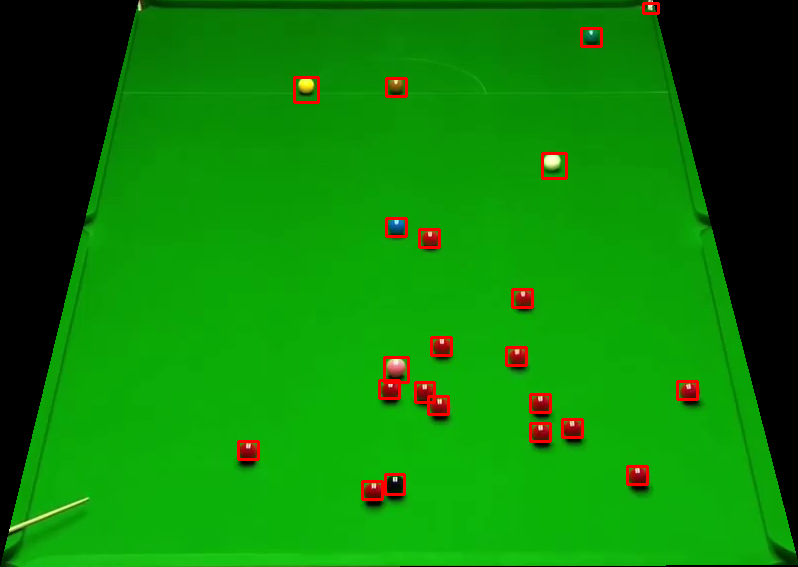

20


green yellow red
64688400.0 35343000.0 26989200.0


green yellow red
88074450.0 29062350.0 27953100.0


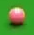

green yellow pink
235173750.0 29434650.0 29131200.0


green black white
141540300.0 7986600.0 3549600.0


green yellow red
115882200.0 16493400.0 16065000.0


green brown yellow
135374400.0 23776200.0 9424800.0


green yellow brown
95921820.0 20076660.0 6878115.0


green blue dark_green
134517600.0 19920600.0 11781000.0


green dark_green white
159150600.0 10281600.0 4926600.0


green white brown
84582225.0 24352245.0 8737065.0


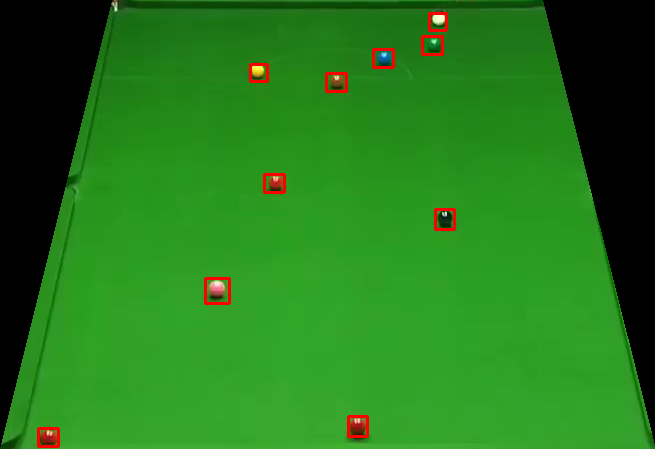

21


green yellow red
87408900.0 27731250.0 27065700.0


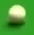

green white yellow
223642650.0 59476200.0 22758750.0


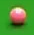

green pink yellow
233656500.0 30345000.0 28220850.0


green black white
142205850.0 6655500.0 3771450.0


green yellow red
116310600.0 15208200.0 14994000.0


green brown yellow
133018200.0 22705200.0 8996400.0


green yellow brown
92389815.0 20076660.0 8922960.0


green blue dark_green
135160200.0 19492200.0 12852000.0


green dark_green white
158293800.0 11995200.0 4284000.0


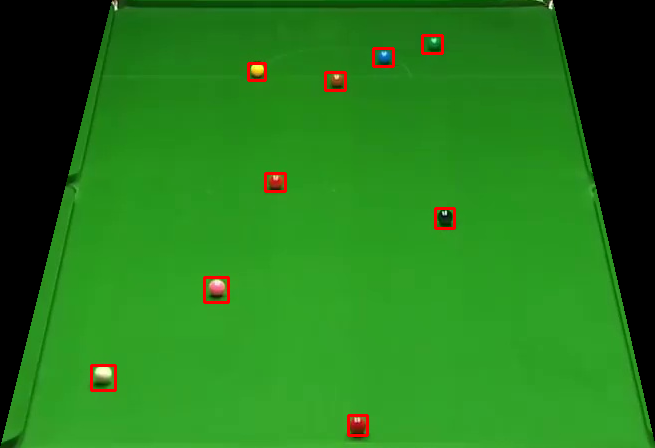

22


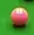

green yellow pink
172966500.0 41269200.0 35200200.0


green black yellow
89405550.0 23072400.0 6433650.0


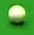

green white yellow
254291100.0 59779650.0 15172500.0


green red pink
60404400.0 44125200.0 15636600.0


red pink black
76255200.0 35343000.0 13494600.0


red green pink
61689600.0 29773800.0 25918200.0


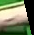

white black brown
139587000.0 74345250.0 21241500.0


pink red white
17221680.0 15936480.0 8739360.0


red yellow pink
15422400.0 11438280.0 11052720.0


green yellow red
19020960.0 12080880.0 10538640.0


green red yellow
104743800.0 19706400.0 19278000.0


green yellow red
103887000.0 19063800.0 17564400.0


green blue white
123165000.0 21205800.0 4712400.0


green dark_green white
159150600.0 8568000.0 4712400.0


green brown yellow
133660800.0 23133600.0 8139600.0


green yellow brown
93691080.0 19518975.0 7621695.0
greseala - ground_truth: 10 me:  8 red
17 15
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 10}
{'white': 1, 'red': 8, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
False
23


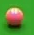

green yellow pink
210897750.0 37020900.0 32469150.0


red green yellow
43696800.0 43696800.0 26132400.0


red green yellow
51622200.0 36199800.0 23776200.0


red green yellow
46481400.0 43482600.0 28274400.0


red yellow green
23005080.0 12980520.0 6554520.0


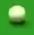

green white yellow
253684200.0 59476200.0 10924200.0


green red yellow
74327400.0 29988000.0 26775000.0


red yellow green
18249840.0 13237560.0 11823840.0


green yellow brown
82895400.0 32772600.0 22491000.0


green yellow red
78611400.0 32130000.0 22062600.0


green red yellow
107742600.0 21634200.0 15636600.0


green yellow red
106457400.0 17992800.0 17992800.0


green blue white
124878600.0 20349000.0 4712400.0


green dark_green white
159579000.0 10067400.0 4712400.0


green brown yellow
133875000.0 24418800.0 5355000.0


green yellow brown
94620555.0 21006135.0 7807590.0


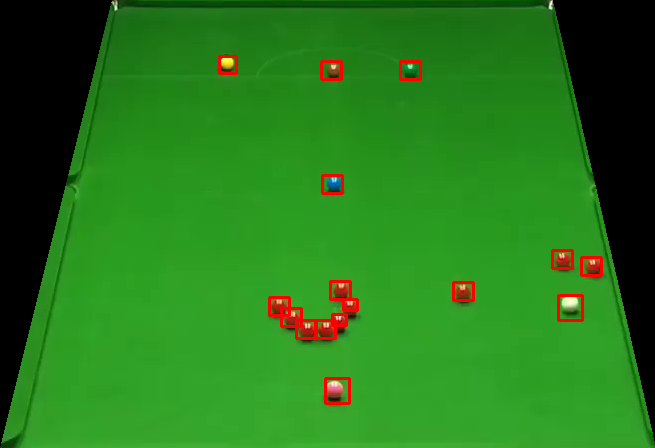

24


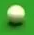

green white yellow
231835800.0 61903800.0 18510450.0


green black white
103160250.0 20410200.0 3549600.0


white brown black
82895400.0 19278000.0 14994000.0


green red yellow
68329800.0 35128800.0 17136000.0


red pink yellow
18635400.0 10410120.0 8610840.0


green yellow red
98532000.0 21205800.0 20777400.0


red yellow pink
16193520.0 10153080.0 9510480.0


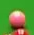

green pink yellow
189049350.0 46124400.0 44910600.0


green blue white
126592200.0 20134800.0 4712400.0


green yellow brown
92389815.0 19333080.0 6506325.0


green dark_green white
159579000.0 11138400.0 4926600.0


green brown yellow
134303400.0 23562000.0 7282800.0


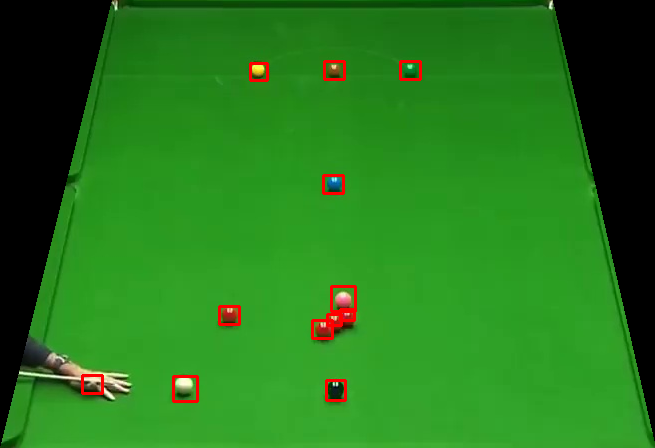

25


green black white
102938400.0 11758050.0 4215150.0


green red yellow
64045800.0 37913400.0 20134800.0


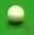

green white yellow
192387300.0 60386550.0 23062200.0


red pink yellow
21462840.0 9381960.0 7582680.0


green red yellow
99817200.0 22062600.0 20991600.0


red yellow pink
17735760.0 9896040.0 8353800.0


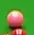

green pink yellow
193904550.0 44910600.0 44000250.0


green blue white
125307000.0 22062600.0 4926600.0


green yellow brown
93505185.0 20634345.0 7064010.0


green brown yellow
131518800.0 22705200.0 7282800.0


green dark_green white
159579000.0 11352600.0 4712400.0


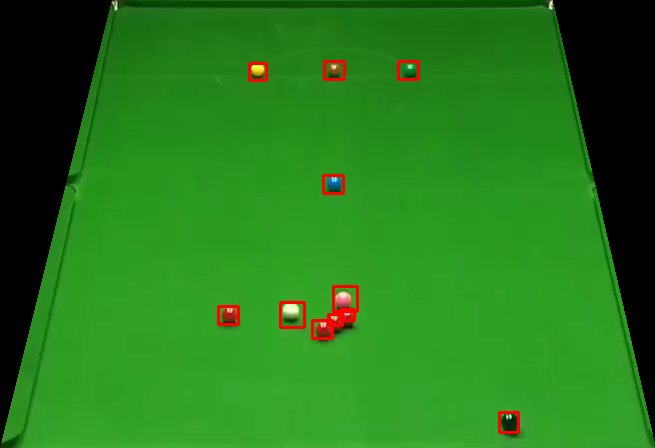

26


green black yellow
92733300.0 23294250.0 4215150.0


green yellow red
80753400.0 38380050.0 26400150.0


green yellow red
97392150.0 28174950.0 25734600.0


green yellow brown
40483800.0 38341800.0 28488600.0


green yellow red
94033800.0 22919400.0 22276800.0


red pink green
66616200.0 24204600.0 23990400.0


red pink brown
80325000.0 34272000.0 16065000.0


green red yellow
56977200.0 48195000.0 18849600.0


green yellow red
107597250.0 25290900.0 23072400.0


pink red white
19149480.0 17864280.0 8867880.0


red pink yellow
17735760.0 11309760.0 9381960.0


green red yellow
100031400.0 23990400.0 22062600.0


pink red white
23005080.0 12466440.0 8353800.0


green pink white
17864280.0 14779800.0 12852000.0


green yellow red
100245600.0 22062600.0 21634200.0


green blue white
125521200.0 20777400.0 5140800.0


green yellow brown
92389815.0 20076660.0 6692220.0


green dark_green white
158936400.0 12209400.0 4712400.0


green brown yellow
133660800.0 19920600.0 9210600.0
greseala - ground_truth: 1 me:  0 white
greseala - ground_truth: 15 me:  13 red
22 19
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 15}
{'white': 0, 'red': 13, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
False
27


green black yellow
86743350.0 24625350.0 5768100.0


green yellow red
73654200.0 33943050.0 25069050.0


green yellow red
74541600.0 27417600.0 25275600.0


green yellow red
52578450.0 35052300.0 28618650.0


green yellow red
97170300.0 27287550.0 25290900.0


green red yellow
90392400.0 23562000.0 23133600.0


red pink white
77326200.0 34914600.0 12209400.0


red pink green
64260000.0 25061400.0 24418800.0


green red yellow
56548800.0 45838800.0 16065000.0


green yellow red
105600600.0 24403500.0 22628700.0


red pink yellow
16193520.0 14265720.0 10024560.0


pink red white
21077280.0 14265720.0 8096760.0


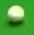

green white yellow
232139250.0 60690000.0 14262150.0


green yellow red
95961600.0 25489800.0 19706400.0


pink white red
26218080.0 9510480.0 8739360.0


green pink white
18121320.0 16065000.0 12980520.0


green blue white
124664400.0 22705200.0 5140800.0


green yellow brown
92389815.0 19890765.0 8551170.0


green brown yellow
131518800.0 24418800.0 9853200.0


green dark_green white
158722200.0 11352600.0 4284000.0
greseala - ground_truth: 15 me:  13 red
22 20
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 15}
{'white': 1, 'red': 13, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
False
28


green black yellow
103825800.0 21297600.0 3549600.0


green yellow red
100276200.0 25512750.0 25069050.0


green yellow red
93177000.0 24847200.0 23990400.0


green red yellow
97889400.0 24418800.0 19492200.0


green red yellow
95533200.0 23562000.0 22705200.0


green red yellow
80539200.0 26132400.0 24633000.0


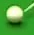

green white yellow
250346250.0 67972800.0 10924200.0


green red yellow
69615000.0 33201000.0 28274400.0


green yellow red
62332200.0 36628200.0 25704000.0


red yellow pink
14908320.0 11566800.0 11181240.0


green yellow red
101102400.0 22276800.0 21634200.0


green pink yellow
42569955.0 28441935.0 22679190.0


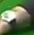

white brown green
89517750.0 39448500.0 33682950.0


green red yellow
109242000.0 18207000.0 17778600.0


green blue dark_green
127020600.0 21420000.0 8139600.0


green brown yellow
133232400.0 25275600.0 8782200.0


green yellow brown
92575710.0 18961290.0 7993485.0


green dark_green white
159579000.0 10924200.0 4498200.0


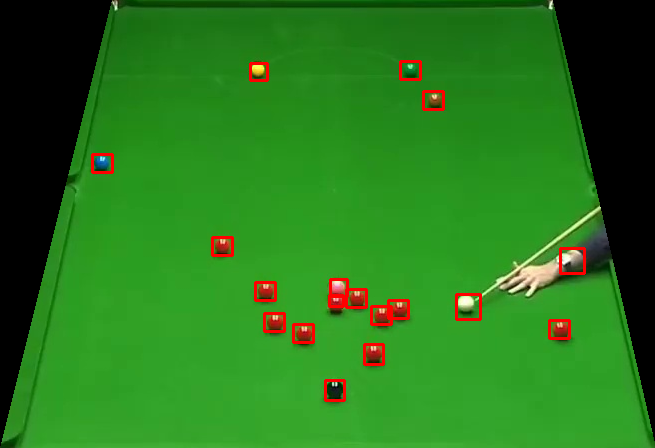

29


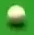

green white yellow
223946100.0 60993450.0 10317300.0


green black yellow
98945100.0 20853900.0 4658850.0


green red yellow
93605400.0 23990400.0 23562000.0


green red yellow
98103600.0 24418800.0 19706400.0


green red yellow
96604200.0 23776200.0 22276800.0


green red yellow
81824400.0 25275600.0 23776200.0


green red yellow
71328600.0 34057800.0 27846000.0


green yellow red
63617400.0 38341800.0 26989200.0


red yellow pink
12852000.0 11309760.0 11309760.0


green yellow red
100245600.0 22276800.0 22276800.0


green pink yellow
47217330.0 27884250.0 22307400.0


green yellow red
107956800.0 18207000.0 17564400.0


green blue dark_green
124664400.0 22491000.0 8568000.0


green brown yellow
132161400.0 23133600.0 8568000.0


green yellow white
93876975.0 18589500.0 7249905.0


green dark_green white
158936400.0 8996400.0 4498200.0


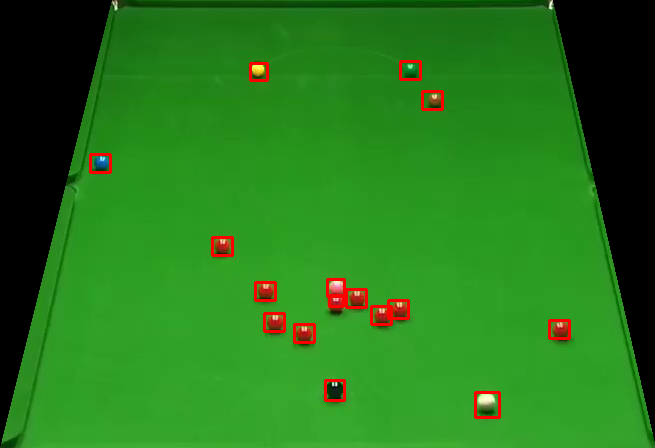

30


black green red
68972400.0 46053000.0 25061400.0


green red black
56571750.0 44591850.0 37714500.0


green red black
73899000.0 40483800.0 21205800.0


green red black
87179400.0 36199800.0 22919400.0


red black brown
43439760.0 8353800.0 2184840.0


red black green
70043400.0 37699200.0 31059000.0


red black brown
75184200.0 47124000.0 10067400.0


red green black
63617400.0 61475400.0 24418800.0


red brown black
35190000.0 3952500.0 3570000.0


red pink white
35985600.0 6683040.0 4369680.0


red brown green
35985600.0 6426000.0 5269320.0


red green black
68107950.0 51912900.0 20853900.0


red green brown
29945160.0 11052720.0 4241160.0


green red black
92289600.0 37270800.0 16860600.0


green red brown
23262120.0 19149480.0 5140800.0


green red black
91677600.0 36199800.0 16707600.0


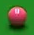

green pink brown
229711650.0 42179550.0 19117350.0


green blue dark_green
98532000.0 31487400.0 14565600.0


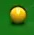

green yellow brown
258842850.0 38538150.0 26096700.0


green brown black
114597000.0 37913400.0 4498200.0


green dark_green blue
118452600.0 22276800.0 3427200.0


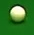

green white brown
248222100.0 43393350.0 8496600.0


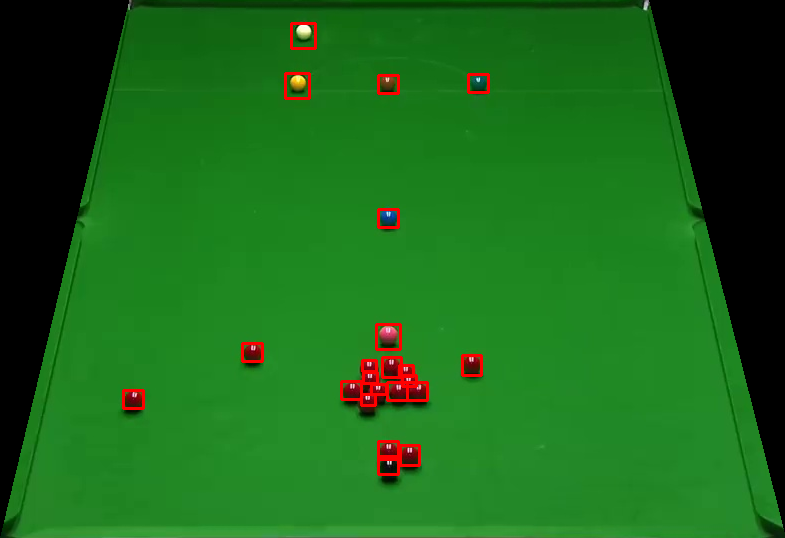

31


black green red
71542800.0 48195000.0 20777400.0


green red black
57681000.0 45922950.0 38380050.0


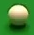

green white brown
216056400.0 63421050.0 19117350.0


green red black
75398400.0 40269600.0 22705200.0


red black pink
43054200.0 7839720.0 2441880.0


red black brown
74755800.0 44982000.0 8139600.0


red black green
72613800.0 36414000.0 31915800.0


red green black
67044600.0 62332200.0 20134800.0


red brown pink
36371160.0 4498200.0 3341520.0


red pink green
37270800.0 6040440.0 4626720.0


red brown green
37784880.0 7068600.0 4755240.0


red green black
65445750.0 50803650.0 18857250.0


red green yellow
28145880.0 11566800.0 3855600.0


green red black
93398850.0 37270800.0 20632050.0


green red brown
21675000.0 20017500.0 5482500.0


green red black
96504750.0 39045600.0 19079100.0


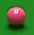

green pink brown
229408200.0 41572650.0 21544950.0


green blue dark_green
100031400.0 32130000.0 27203400.0


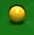

green yellow brown
257022150.0 40662300.0 22758750.0


green brown black
113311800.0 39627000.0 3641400.0


green dark_green blue
119952000.0 19063800.0 3641400.0


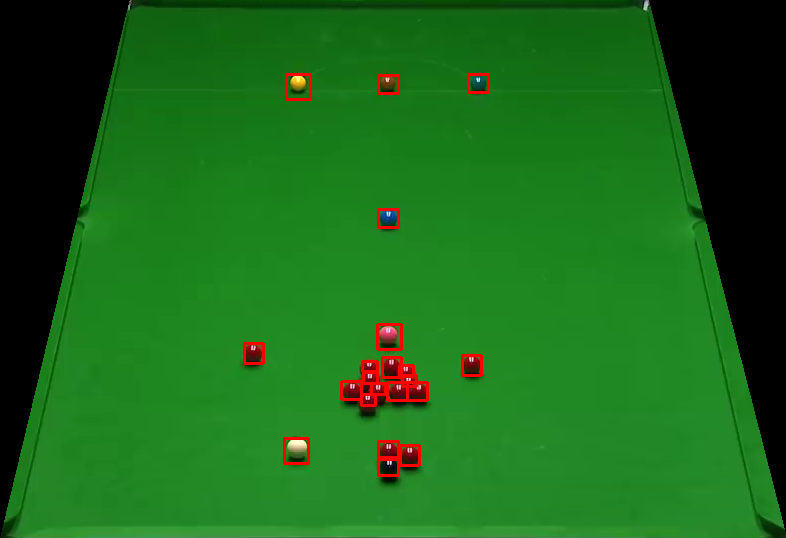

32


green red black
59233950.0 48141450.0 32390100.0


green red black
68773500.0 42817050.0 31502700.0


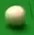

green white brown
213628800.0 64634850.0 14869050.0


red black brown
42154560.0 9639000.0 2570400.0


red black brown
74541600.0 46695600.0 8782200.0


red black green
71542800.0 37913400.0 31059000.0


red green black
68972400.0 57191400.0 23562000.0


red brown green
37013760.0 3727080.0 3727080.0


red pink white
35857080.0 7325640.0 4626720.0


red brown green
38427480.0 7454160.0 4755240.0


red green black
66998700.0 53687700.0 19522800.0


red green brown
29302560.0 11695320.0 4241160.0


green red black
93398850.0 35717850.0 20188350.0


green red brown
21292500.0 21037500.0 6247500.0


green red black
95839200.0 39933000.0 14420250.0


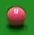

green pink brown
227284050.0 41876100.0 20027700.0


green blue dark_green
101745000.0 31059000.0 18635400.0


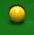

green yellow brown
256415250.0 37931250.0 31558800.0


green brown black
114382800.0 39841200.0 3213000.0


green dark_green blue
119952000.0 24204600.0 3855600.0


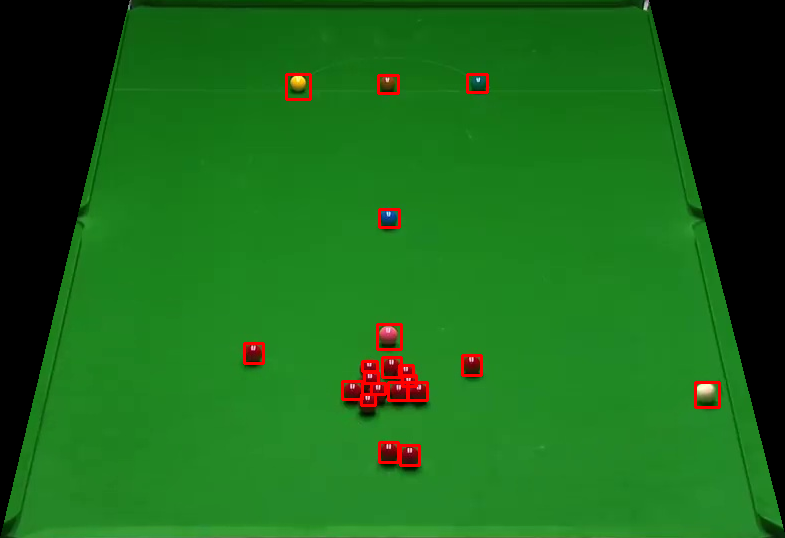

33


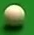

green white brown
188139000.0 63117600.0 28524300.0


green red black
86077800.0 39933000.0 32390100.0


green red black
82306350.0 36827100.0 30837150.0


black red green
32001480.0 16964640.0 3984120.0


red black green
57191400.0 48837600.0 39841200.0


red green brown
21037500.0 19252500.0 6120000.0


red green black
67473000.0 58905000.0 19920600.0


green red black
79200450.0 40598550.0 22406850.0


red green black
64045800.0 43268400.0 24847200.0


red brown green
32772600.0 7325640.0 6811560.0


green red brown
84609000.0 46481400.0 17136000.0


green red black
91845900.0 36383400.0 21297600.0


green red brown
22105440.0 18378360.0 5911920.0


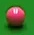

green pink brown
226677150.0 40358850.0 25186350.0


green blue dark_green
97675200.0 32130000.0 22919400.0


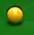

green yellow brown
256718700.0 38538150.0 27007050.0


green brown black
113526000.0 37485000.0 4926600.0


green dark_green blue
7968240.0 7839720.0 1670760.0


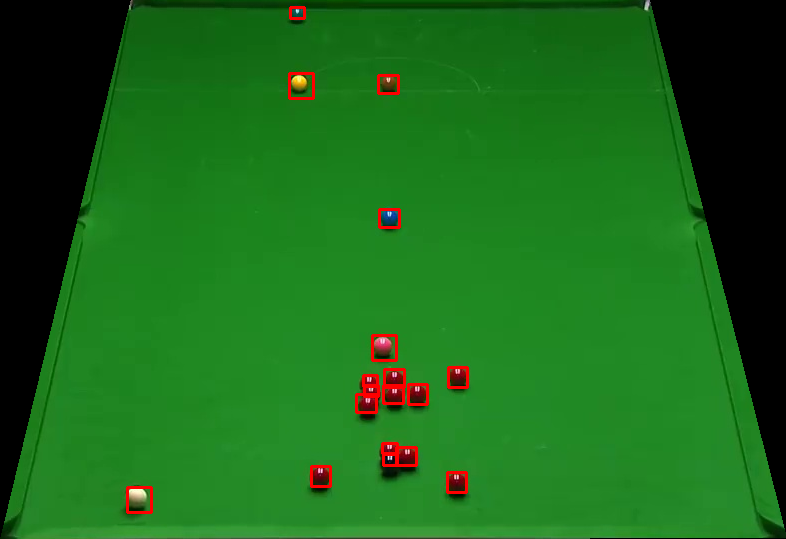

34


green red black
84081150.0 40598550.0 29949750.0


black red green
33532500.0 15555000.0 3825000.0


red black green
56334600.0 52907400.0 38770200.0


red green brown
21547500.0 18870000.0 5992500.0


green red black
90958500.0 37048950.0 23737950.0


green red black
91624050.0 38823750.0 20632050.0


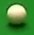

green white yellow
223946100.0 62207250.0 13048350.0


green red black
90736650.0 38380050.0 18413550.0


green blue dark_green
99603000.0 30416400.0 14779800.0


green red brown
110313000.0 26989200.0 17350200.0


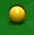

green yellow brown
256718700.0 38841600.0 27007050.0


green brown black
113954400.0 41983200.0 3213000.0


dark_green green white
9381960.0 8867880.0 1927800.0


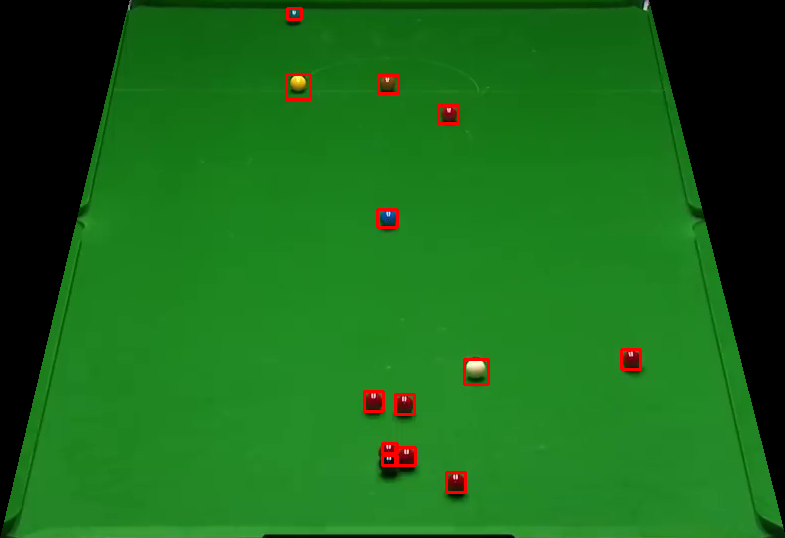

35


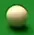

green white brown
200883900.0 60993450.0 25489800.0


red black green
54406800.0 49908600.0 40055400.0


black red green
32385000.0 16320000.0 4462500.0


red green brown
22185000.0 19507500.0 5865000.0


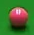

green pink brown
226373700.0 41269200.0 18207000.0


green blue dark_green
100245600.0 29559600.0 15208200.0


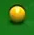

green yellow brown
257932500.0 38841600.0 25489800.0


green brown black
113311800.0 42625800.0 4498200.0


dark_green green white
9510480.0 9381960.0 1799280.0


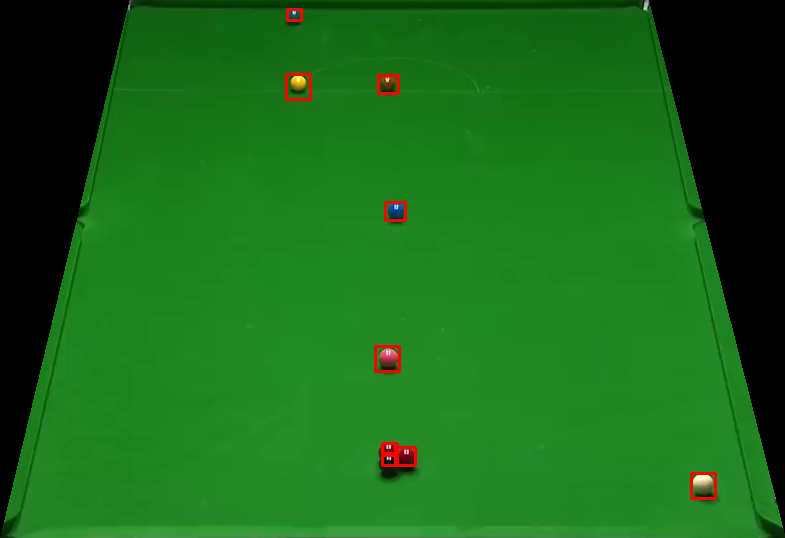

36


green black yellow
92320200.0 29345400.0 0.0


green black white
101163600.0 60121350.0 3993300.0


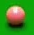

green pink white
240939300.0 35200200.0 32165700.0


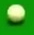

green white yellow
261270450.0 65848650.0 7282800.0


green blue dark_green
111812400.0 24847200.0 9639000.0


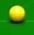

green yellow white
277960200.0 45820950.0 9103500.0


green brown yellow
125521200.0 23562000.0 10067400.0


green red brown
114168600.0 23562000.0 22705200.0


green dark_green brown
132375600.0 11138400.0 5569200.0


green red brown
121023000.0 23776200.0 17350200.0


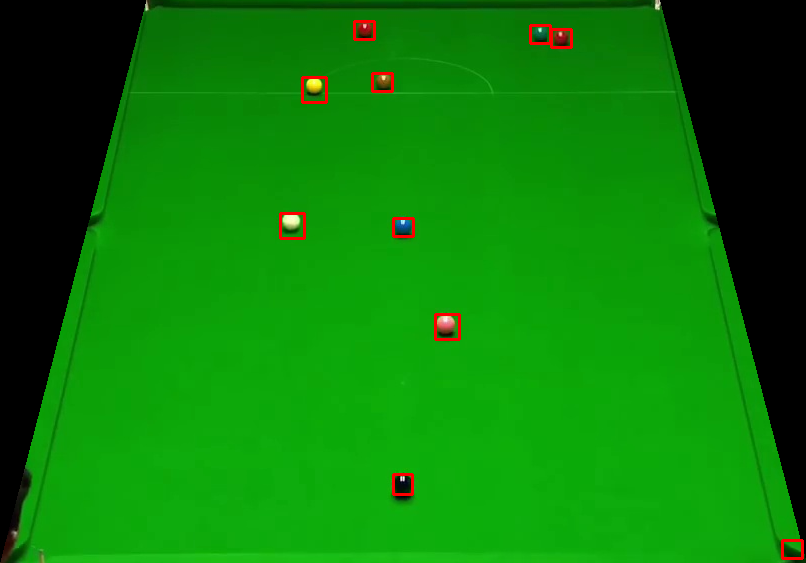

37


green black dark_green
89964000.0 25704000.0 214200.0


green red black
76041000.0 44553600.0 18635400.0


green black red
91180350.0 59233950.0 5546250.0


green red black
90392400.0 40698000.0 13923000.0


green red black
89321400.0 40055400.0 17136000.0


green red black
89107200.0 38770200.0 14137200.0


green red black
92106000.0 41554800.0 12852000.0


green red black
64260000.0 63403200.0 17564400.0


green red black
94676400.0 38556000.0 13708800.0


green red brown
86965200.0 52356600.0 14642100.0


green red black
96818400.0 36414000.0 12637800.0


green red black
75612600.0 43054200.0 21205800.0


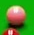

green pink white
203311500.0 43696800.0 41269200.0


green red black
100031400.0 36842400.0 10495800.0


green red brown
98746200.0 37913400.0 10710000.0


green red brown
102387600.0 31059000.0 10495800.0


green red brown
109027800.0 31487400.0 9424800.0


green blue dark_green
113526000.0 23776200.0 8782200.0


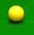

green yellow white
279174000.0 49765800.0 7586250.0


green brown yellow
126163800.0 22062600.0 11995200.0


green dark_green white
137516400.0 11781000.0 3641400.0


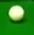

green white yellow
270070500.0 51889950.0 4248300.0


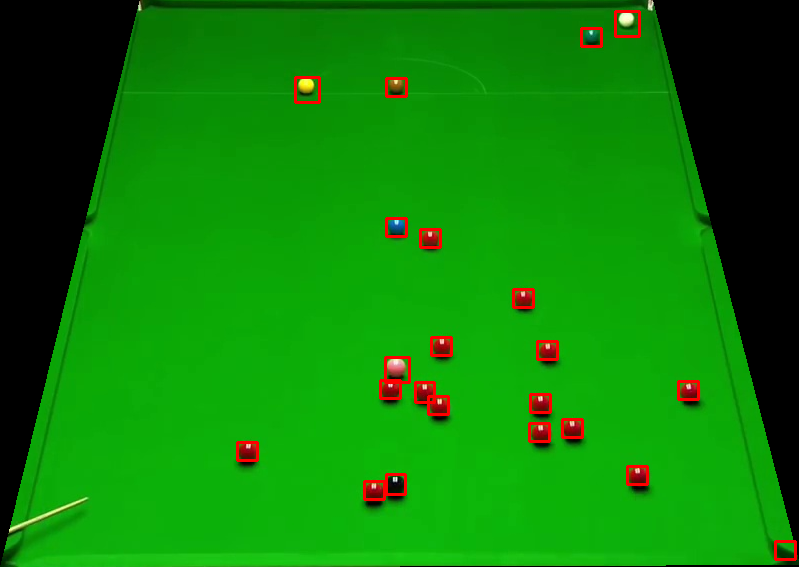

38


green black white
98279550.0 61452450.0 3549600.0


green blue black
88036200.0 26346600.0 23347800.0


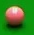

green pink white
236387550.0 33682950.0 28220850.0


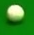

green white yellow
266429100.0 57655500.0 5158650.0


green dark_green white
126163800.0 19920600.0 3641400.0


green brown black
118024200.0 35771400.0 3641400.0


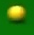

green yellow brown
255201450.0 49765800.0 13351800.0


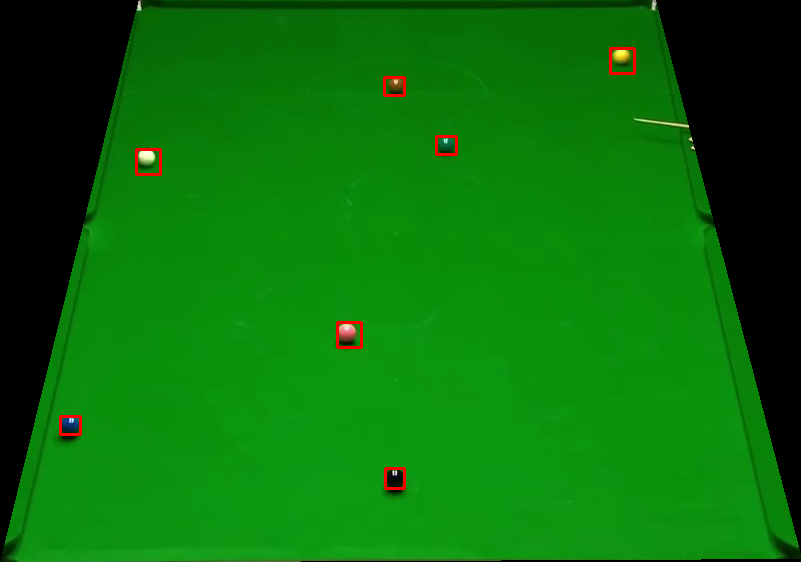

39


green black yellow
82038600.0 37270800.0 0.0


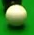

green white black
174483750.0 71917650.0 31558800.0


green black white
99817200.0 37913400.0 18421200.0


green blue black
87179400.0 26560800.0 23776200.0


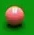

green pink white
237297900.0 36110550.0 27917400.0


green dark_green white
126163800.0 20563200.0 3855600.0


green brown white
118881000.0 35985600.0 3855600.0


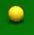

green yellow brown
269767050.0 43089900.0 12744900.0


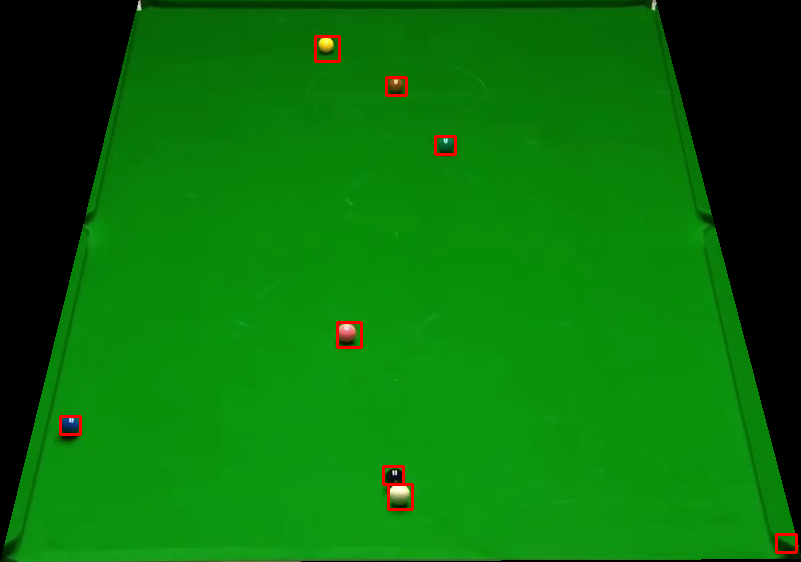

40


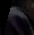

black yellow brown
323477700.0 0.0 0.0


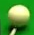

green white yellow
196939050.0 83448750.0 16993200.0


black yellow brown
61432560.0 0.0 0.0


green black brown
84823200.0 49266000.0 13280400.0


green black white
100276200.0 59677650.0 3771450.0


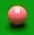

green pink white
230622000.0 37931250.0 28524300.0


green red brown
104101200.0 26989200.0 13923000.0


green blue dark_green
111384000.0 28274400.0 8782200.0


green red brown
26732160.0 17478720.0 9381960.0


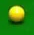

green yellow brown
272498100.0 48248550.0 7282800.0


green dark_green white
129162600.0 18635400.0 4069800.0


green red brown
91249200.0 26346600.0 13494600.0


green red brown
116096400.0 22491000.0 15208200.0


green red brown
111812400.0 23562000.0 14994000.0


green brown white
92534400.0 34486200.0 2998800.0


green red brown
77968800.0 22919400.0 10924200.0


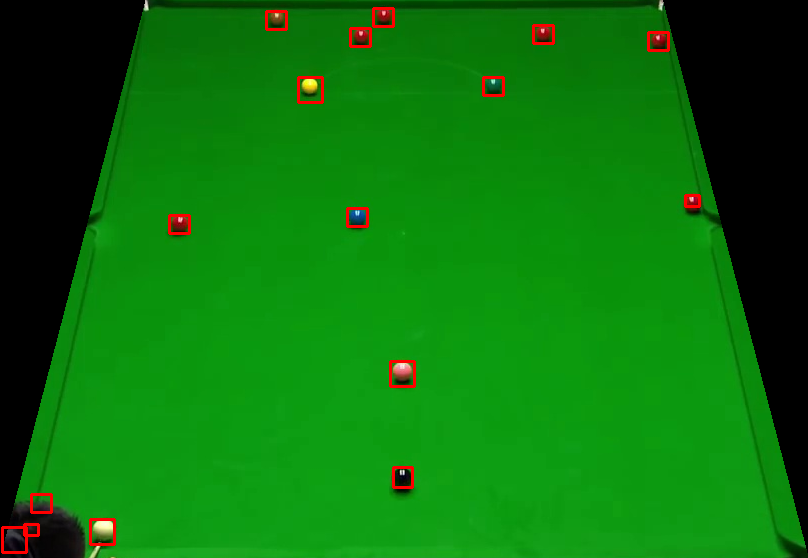

41


black yellow brown
63750000.0 0.0 0.0


black yellow brown
179928000.0 0.0 0.0


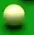

green white yellow
203008050.0 73434900.0 15779400.0


black green brown
102387600.0 8568000.0 3641400.0


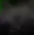

black brown yellow
200580450.0 2427600.0 0.0


green black white
100498050.0 61230600.0 3549600.0


green black brown
95961600.0 35128800.0 5783400.0


green black brown
80753400.0 70686000.0 2142000.0


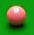

green pink white
231532350.0 38234700.0 30648450.0


green blue dark_green
111812400.0 28060200.0 8139600.0


green red brown
98317800.0 30202200.0 14137200.0


green red brown
108599400.0 28274400.0 14994000.0


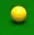

green yellow brown
274015350.0 49765800.0 7586250.0


green dark_green white
131090400.0 17992800.0 3641400.0


green red brown
88464600.0 24847200.0 11995200.0


green red brown
116310600.0 24633000.0 14351400.0


green red brown
113097600.0 23562000.0 15422400.0


green brown white
90392400.0 33629400.0 3213000.0


green red brown
77540400.0 22276800.0 9639000.0


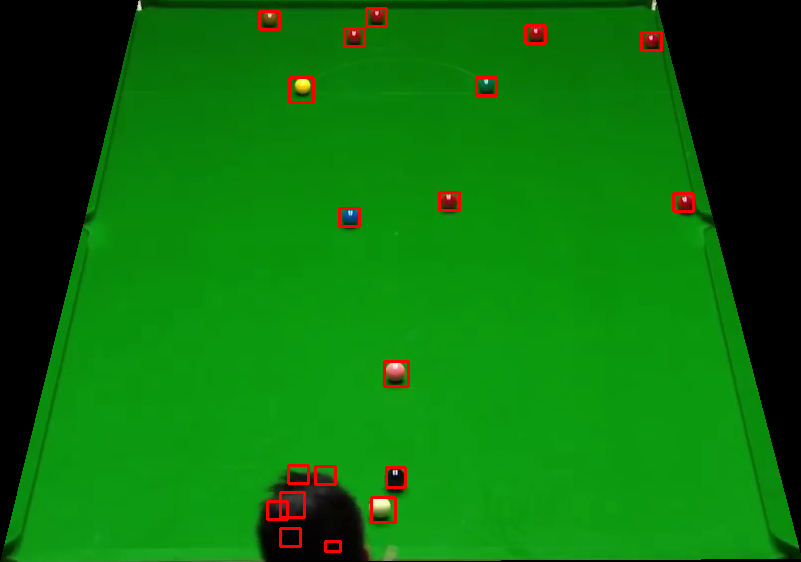

42


green black yellow
83109600.0 32986800.0 0.0


green red brown
110313000.0 31701600.0 11352600.0


green black white
94729950.0 63892800.0 3771450.0


green red black
87822000.0 39198600.0 18421200.0


green red black
91402200.0 41929650.0 19300950.0


green red black
89535600.0 38127600.0 19278000.0


green red black
88036200.0 38127600.0 17136000.0


green red black
94729950.0 41707800.0 17304300.0


red green black
79254000.0 35557200.0 23347800.0


red green black
61047000.0 55692000.0 24418800.0


red black pink
103458600.0 31701600.0 13280400.0


red pink green
29431080.0 9767520.0 7582680.0


red green pink
27117720.0 12852000.0 6811560.0


green red brown
91891800.0 37699200.0 15208200.0


red green pink
24547320.0 8867880.0 8353800.0


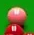

green pink red
192387300.0 50069250.0 37020900.0


green red brown
90392400.0 32772600.0 16279200.0


green blue dark_green
106885800.0 28060200.0 7068600.0


green dark_green white
129591000.0 17350200.0 3427200.0


green brown yellow
119523600.0 31273200.0 3855600.0


green yellow white
62832510.0 30858570.0 15243390.0


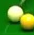

green white yellow
182980350.0 55834800.0 50069250.0


black green white
23133600.0 13751640.0 5140800.0


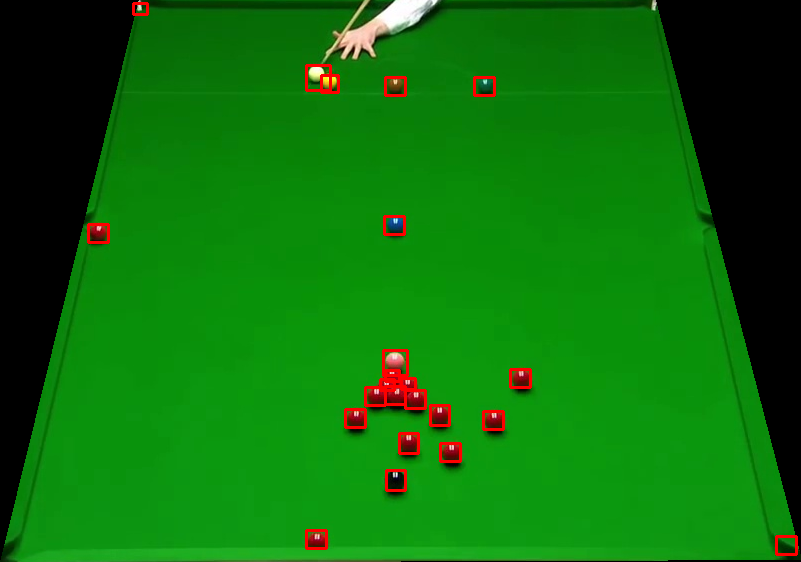

43


green black yellow
77968800.0 35771400.0 0.0


green red brown
112455000.0 31059000.0 13494600.0


green black white
96282900.0 61674300.0 3771450.0


green red black
85894200.0 42411600.0 17136000.0


green red black
90514800.0 41042250.0 19300950.0


green red black
88678800.0 38770200.0 16921800.0


green red black
87179400.0 40269600.0 16921800.0


green red black
88036200.0 41126400.0 16065000.0


red green black
79896600.0 35343000.0 23133600.0


red green black
61903800.0 55263600.0 22919400.0


red black pink
105600600.0 30630600.0 13923000.0


red pink green
31230360.0 10024560.0 7325640.0


red green pink
26475120.0 12466440.0 6940080.0


green red brown
92106000.0 35771400.0 14565600.0


red brown green
24675840.0 10024560.0 8739360.0


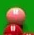

green pink red
191780400.0 48855450.0 37324350.0


green blue dark_green
107742600.0 24847200.0 10067400.0


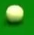

green white yellow
264304950.0 58565850.0 8800050.0


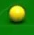

green yellow brown
272194650.0 48552000.0 8496600.0


green dark_green white
131090400.0 20563200.0 3641400.0


green brown white
119737800.0 32130000.0 3427200.0


black green white
23133600.0 13109040.0 5269320.0


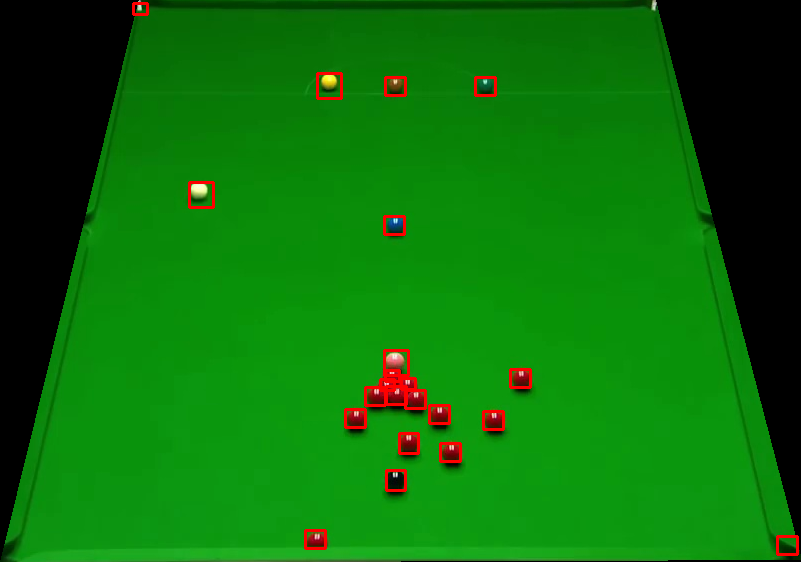

44


green red brown
114382800.0 28060200.0 10067400.0


green red black
91463400.0 34914600.0 20777400.0


black green white
32515560.0 18506880.0 2441880.0


green red black
99166950.0 31280850.0 23516100.0


green red black
71542800.0 45196200.0 25918200.0


green red black
97461000.0 30202200.0 16707600.0


green red black
104713200.0 33943050.0 15307650.0


green red black
99817200.0 30202200.0 13066200.0


green red brown
101385450.0 39489300.0 13532850.0


green red black
106931700.0 33055650.0 15307650.0


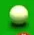

green white yellow
241242750.0 63724500.0 19117350.0


green red black
101530800.0 32558400.0 14137200.0


green red black
113365350.0 32390100.0 12645450.0


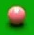

green white pink
249435900.0 31255350.0 30345000.0


green red brown
106457400.0 27631800.0 11138400.0


green red brown
106885800.0 29345400.0 11352600.0


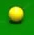

green yellow white
289187850.0 45214050.0 5158650.0


green brown yellow
129805200.0 22276800.0 7282800.0


green dark_green white
145227600.0 13494600.0 2998800.0


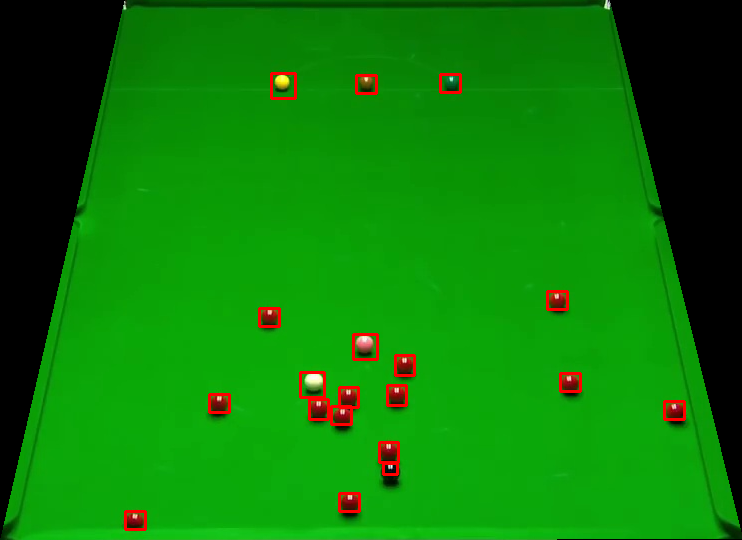

45


green red black
82467000.0 41554800.0 24418800.0


green red black
83323800.0 41769000.0 22062600.0


green black white
98057700.0 61674300.0 3549600.0


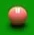

green pink white
238208250.0 33076050.0 25489800.0


green blue dark_green
109884600.0 21420000.0 10067400.0


green dark_green white
130233600.0 14779800.0 3855600.0


green brown black
121023000.0 31915800.0 4069800.0


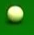

green white yellow
266125650.0 48552000.0 7586250.0


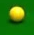

green yellow brown
267642900.0 43089900.0 12441450.0


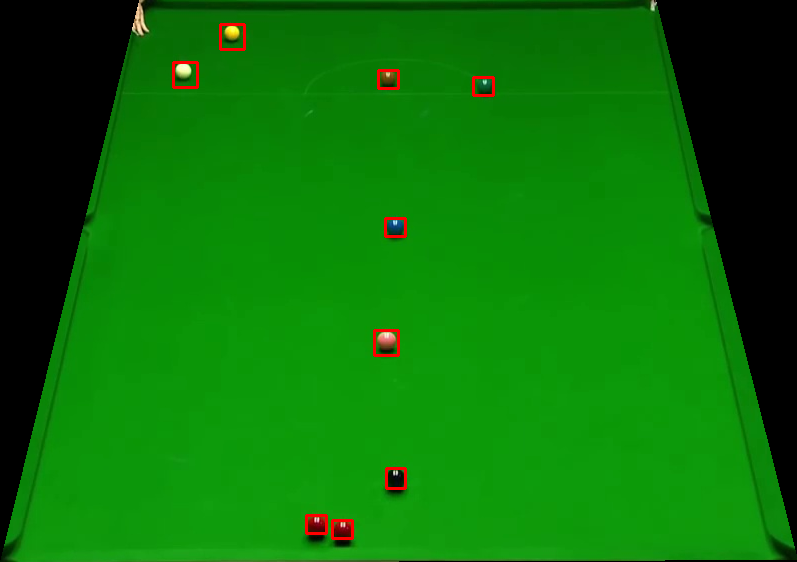

46


green black white
96726600.0 64780200.0 3549600.0


green blue dark_green
108813600.0 26132400.0 8139600.0


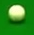

green white yellow
277656750.0 51283050.0 8800050.0


green brown black
116953200.0 34272000.0 4498200.0


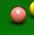

green pink brown
231532350.0 29434650.0 28827750.0


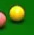

green yellow brown
221215050.0 41269200.0 29131200.0


green dark_green white
11695320.0 8739360.0 1927800.0


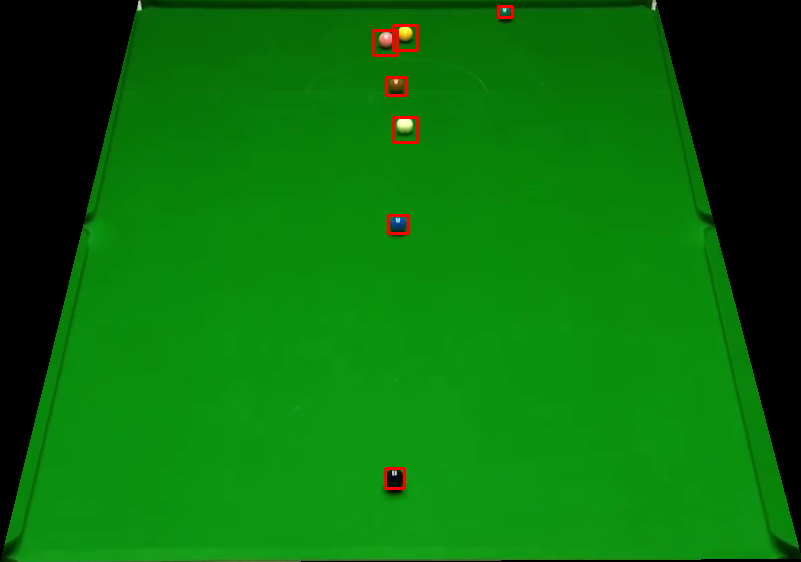

47


green red brown
105386400.0 31059000.0 12423600.0


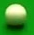

green white yellow
218787450.0 71614200.0 14869050.0


green red black
81396000.0 40483800.0 20563200.0


green black white
94508100.0 62783550.0 2884050.0


green red black
71542800.0 43054200.0 24633000.0


green red black
93620700.0 41929650.0 20853900.0


green red black
86299650.0 43260750.0 22185000.0


green red black
87822000.0 36199800.0 20991600.0


green red brown
64045800.0 62760600.0 14779800.0


red black green
36114120.0 7197120.0 5397840.0


green red brown
88678800.0 32344200.0 16279200.0


red green brown
28050000.0 13770000.0 5737500.0


red green brown
23390640.0 13109040.0 6554520.0


green red black
94676400.0 36842400.0 15636600.0


red green black
63403200.0 52907400.0 23562000.0


green red brown
92067750.0 46588500.0 17082450.0


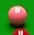

green pink white
206042550.0 40965750.0 31558800.0


green blue dark_green
107956800.0 25489800.0 8782200.0


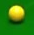

green yellow brown
269767050.0 48552000.0 9103500.0


green brown white
119309400.0 33629400.0 3427200.0


green dark_green white
129162600.0 15850800.0 3641400.0


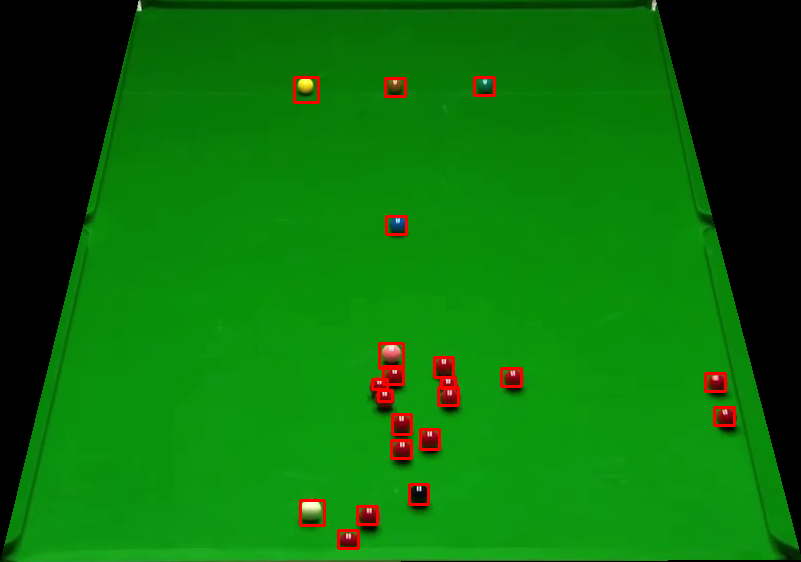

48


green red brown
107528400.0 34700400.0 15850800.0


green red brown
95533200.0 39198600.0 12423600.0


green red black
82895400.0 42197400.0 20777400.0


green red black
87393600.0 39198600.0 19920600.0


green red black
86536800.0 38984400.0 20134800.0


green black white
98057700.0 64114650.0 3993300.0


red green black
52264800.0 32986800.0 25489800.0


green red black
66402000.0 57191400.0 18849600.0


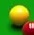

green yellow brown
187835550.0 71007300.0 27917400.0


red green brown
23205000.0 16447500.0 7522500.0


green red brown
86108400.0 38770200.0 16493400.0


red black green
31872960.0 8096760.0 7839720.0


red green black
75184200.0 26989200.0 16921800.0


green red black
84609000.0 46267200.0 15636600.0


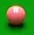

green pink white
235780650.0 37020900.0 30345000.0


green red black
63189000.0 60832800.0 16493400.0


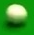

green white yellow
236691000.0 72221100.0 11227650.0


green blue dark_green
111598200.0 27417600.0 9210600.0


green dark_green white
131518800.0 18635400.0 3855600.0


green brown black
119309400.0 32344200.0 3427200.0


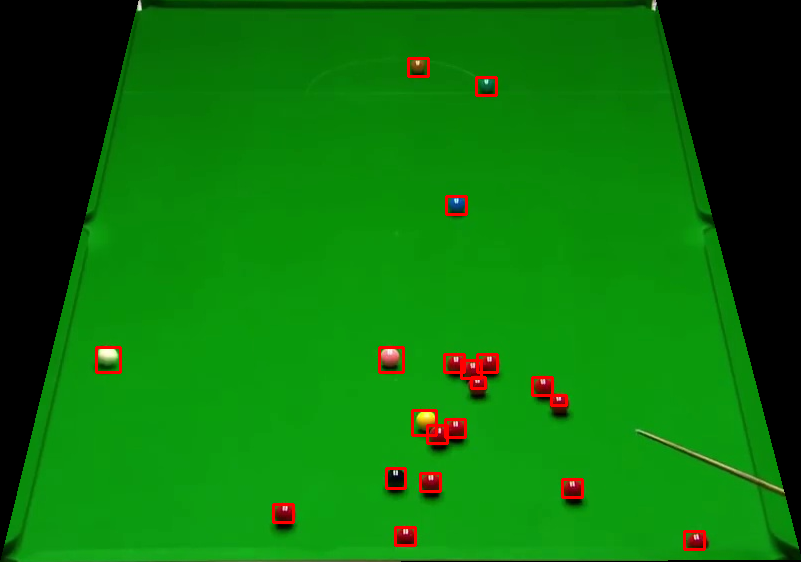

49


green black white
108928350.0 49694400.0 3771450.0


red black pink
97461000.0 23990400.0 11781000.0


red green black
67901400.0 46481400.0 23133600.0


red black pink
41254920.0 5654880.0 4755240.0


red black pink
42154560.0 6811560.0 4241160.0


red green white
67044600.0 58690800.0 11566800.0


red pink white
40612320.0 8610840.0 5526360.0


red pink white
40612320.0 8996400.0 7068600.0


red green pink
34700400.0 8482320.0 6940080.0


red pink white
40869360.0 8482320.0 6554520.0


red green white
25961040.0 11823840.0 8096760.0


red green pink
29707500.0 9690000.0 6757500.0


red green white
25961040.0 10795680.0 7711200.0


red green pink
28050000.0 11220000.0 6885000.0


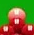

green red pink
156276750.0 76772850.0 44000250.0


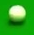

green white yellow
282208500.0 54621000.0 5462100.0


green blue dark_green
118024200.0 22705200.0 8353800.0


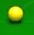

green yellow white
288277500.0 45214050.0 4855200.0


green dark_green white
149083200.0 14565600.0 3213000.0


green brown yellow
130233600.0 23347800.0 7711200.0
greseala - ground_truth: 14 me:  13 red
21 20
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 14}
{'white': 1, 'red': 13, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
False
50


green black brown
97889400.0 23347800.0 16493400.0


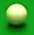

green white yellow
225766800.0 72828000.0 18510450.0


green black dark_green
102601800.0 49480200.0 11352600.0


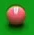

green pink white
237904800.0 39751950.0 18813900.0


green blue dark_green
99603000.0 32558400.0 11995200.0


green red brown
100031400.0 34914600.0 11566800.0


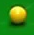

green yellow white
261270450.0 50069250.0 12138000.0


green dark_green white
128305800.0 22276800.0 4926600.0


green brown white
115239600.0 35771400.0 4284000.0


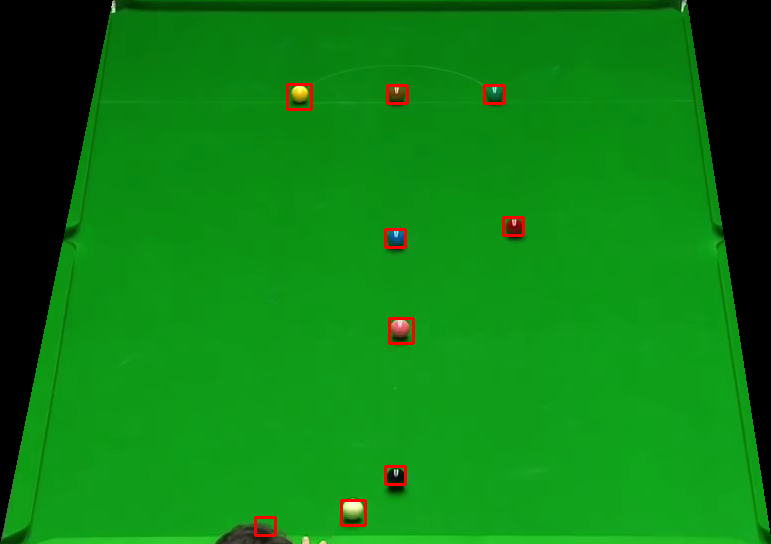

acc numbers = 88%
acc colors = 84%


In [0]:
#14
results = []
acc_colors = 0
acc_numbers = 0

for i in range(1, 51):
    print(i)
    imgColor = cv.imread(folder_in + 'Task1/'+ str(i) +'.jpg')
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
    
    bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner = get_corners(img.copy(), False)

    #points_template = np.float32([(2000, 2000), (0, 2000), (0, 0), (2000, 0)]) # the points of the 4 corners (table) in the template image
    #points_query = np.float32([bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]) # the points of the 4 corners (table) in the test image
    #homography = cv.getPerspectiveTransform(points_query, points_template)
    #height, width = 2000, 2000 # the shape with respect to the template image
    #aligned_image2 = cv.warpPerspective(imgColor, homography, (width, height), flags=cv.INTER_NEAREST)

    mask = np.zeros(imgColor.shape, dtype=np.uint8)
    
    corners = np.array([[bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]], dtype=np.int32)
    channel_count = imgColor.shape[2]  # i.e. 3 or 4 depending on your image
    ignore_mask_color = (255,)*channel_count
    cv.fillPoly(mask, corners, ignore_mask_color)
    # apply the mask
    masked_image = cv.bitwise_and(imgColor, mask)

    masked_image = masked_image[top_right_corner[1]:bottom_left_corner[1], bottom_left_corner[0]:bottom_right_corner[0]]

    ####################

    imgColor = masked_image
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)

    w, h = img.shape[::-1]

    thresholds = [0.7, 0.7, 0.7, 0.8, 0.8, 0.8, 0.7]
    locations = []

    for template_numer in range(1, 8):
        template = cv.imread(data_dir_drive + '/data/templates/ball' + str(template_numer) + '.jpg', 0)
        w_T, h_T = template.shape[::-1]

        threshold = thresholds[template_numer-1]
        loc = get_balls_template_matching(img, template, threshold)
        for pt in zip(*loc):
            locations.append((pt[0], pt[1], pt[0] + w_T, pt[1] + h_T))

    boxes = non_max_suppression_fast(np.array(locations), 0.3)

    copyImgColor = imgColor.copy()
    colors = []

    for box in boxes:
        if not false_pozitive(imgColor, box, 0.5):
            color = get_box_color(imgColor, box)
            colors.append(color)
            cv.rectangle(copyImgColor, (box[0], box[1]), (box[2], box[3]), (0,0,255), 2) 

    balls, num_balls = process_colors(colors)
    
    # load ground truth
    ground_truth = {}
    num_balls_truth  = 0
    with open(folder_in + 'Task1/ground-truth/' + str(i) + '_gt.txt') as f:
        num_balls_truth = int(f.readline())
        lines = f.readlines()
        for line in lines:
            info = line.replace('\n', '').split(' ')
            nr = int(info[0])
            color = info[1]

            ground_truth[color] = nr

    ok = True
    nr = 0
    for color, number in balls.items(): 
        nr += number
        if color == 'dark_green':
            if ground_truth['green'] != number:
                ok = False
        else:
            if ground_truth[color] != number:
                ok = False
                print("greseala - ground_truth:", ground_truth[color], "me: ", number, color)

    if ok:
        acc_colors += 1
    else:

        print(num_balls_truth, num_balls)     
        print(ground_truth)
        print(balls)   
        print(ok)

    if num_balls_truth == nr:
        acc_numbers += 1

        ####################

        cv2_imshow(copyImgColor)
    #cv.imwrite(data_dir_drive + '/data/aux/' + str(i) + '.jpg', masked_image)

print('acc numbers = ' + str(acc_numbers * 2) + '%')
print('acc colors = ' + str(acc_colors * 2) + '%')

In [0]:
#15
def task1(imgColor):

    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
    
    bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner = get_corners(img.copy(), False)

    #points_template = np.float32([(2000, 2000), (0, 2000), (0, 0), (2000, 0)]) # the points of the 4 corners (table) in the template image
    #points_query = np.float32([bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]) # the points of the 4 corners (table) in the test image
    #homography = cv.getPerspectiveTransform(points_query, points_template)
    #height, width = 2000, 2000 # the shape with respect to the template image
    #aligned_image2 = cv.warpPerspective(imgColor, homography, (width, height), flags=cv.INTER_NEAREST)

    mask = np.zeros(imgColor.shape, dtype=np.uint8)
    
    corners = np.array([[bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]], dtype=np.int32)
    channel_count = imgColor.shape[2]  # i.e. 3 or 4 depending on your image
    ignore_mask_color = (255,)*channel_count
    cv.fillPoly(mask, corners, ignore_mask_color)
    # apply the mask
    masked_image = cv.bitwise_and(imgColor, mask)

    masked_image = masked_image[top_right_corner[1]:bottom_left_corner[1], bottom_left_corner[0]:bottom_right_corner[0]]

    ####################

    imgColor = masked_image
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)

    w, h = img.shape[::-1]

    thresholds = [0.7, 0.7, 0.7, 0.8, 0.8, 0.8, 0.7]
    locations = []

    for template_numer in range(1, 8):
        template = cv.imread(data_dir_drive + '/data/templates/ball' + str(template_numer) + '.jpg', 0)
        w_T, h_T = template.shape[::-1]

        threshold = thresholds[template_numer-1]
        loc = get_balls_template_matching(img, template, threshold)
        for pt in zip(*loc):
            locations.append((pt[0], pt[1], pt[0] + w_T, pt[1] + h_T))

    boxes = non_max_suppression_fast(np.array(locations), 0.3)

    copyImgColor = imgColor.copy()
    colors = []

    for box in boxes:
        if not false_pozitive(imgColor, box, 0.5):
            color = get_box_color(imgColor, box, False)
            colors.append(color)
            #cv.rectangle(copyImgColor, (box[0], box[1]), (box[2], box[3]), (0,0,255), 2) 

    balls, num_balls = process_colors(colors)
    

    return balls, num_balls

In [0]:
#16
img = cv.imread(folder_in + 'Task1/1.jpg')
balls, num_balls = task1(img)
print(balls, num_balls)

{'white': 1, 'red': 3, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1} 10


# **Task 2**
You receive a test set of 25 videos containing a player making a shot. In each of the 25 videos the snooker table is seen from above. The task is to decide whether a ball was potted into a pocket and if so recognize the color of the potted ball and the pocket (one of the six pockets) where the ball was potted. By solving correctly this task for a video you will earn 0.04 points as follows: if the correct answer is NO (no ball was poted) you will receive 0.04 points if your output is NO, else you will receive 0.02 points if your output is YES, 0.01 points for specifying the correct pocket (1 - top left corner, 2 - top right corner, 3 - bottom left corner, 4 - bottom right corner, 5 - middle left corner, 6 - middle right corner) and 0.01 points for specifying the correct color of the potted ball. In each of the 25 videos there will be a maximum of one ball being potted. 

In [0]:
#1
def get_pockets(img, show_results = True):
    _, _, bottom_left_corner, _ = get_bottom_left(img, False)
    _, _, bottom_right_corner, _ = get_bottom_right(img, False)
    _, _, top_right_corner, _ = get_top_right(img, False)
    _, _, top_left_corner, _ = get_top_left(img, False)
    _, _, middle_right_corner, _ = get_middle_right(img, False)
    _, _, middle_left_corner, _ = get_middle_left(img, False)

    if bottom_left_corner is None or bottom_right_corner is None or top_right_corner is None or top_left_corner is None or middle_right_corner is None or middle_left_corner is None:

        if bottom_left_corner is None and bottom_right_corner is None:
            print("I can't calculate the top pockets")
        elif bottom_left_corner is None or bottom_right_corner is None:
            if top_right_corner is None or top_left_corner is None:
                print("I can't calculate the top pockets")
            else:
                middle = (top_right_corner[0] + top_left_corner[0]) // 2
                if bottom_left_corner is None:
                    bottom_left_corner = (bottom_right_corner[0] - 2 *(bottom_right_corner[0] - middle), bottom_right_corner[1])
                else:
                    bottom_right_corner = (bottom_left_corner[0] + 2 *(middle - bottom_left_corner[0]), bottom_left_corner[1])

        if top_right_corner is None and top_left_corner is None:
            print("I can't calculate the bottom pockets")
        elif top_right_corner is None or top_left_corner is None:
            if bottom_left_corner is None or bottom_right_corner is None:
                print("I can't calculate the top pockets")
            else:
                middle = (bottom_left_corner[0] + bottom_right_corner[0]) // 2
                if top_left_corner is None:
                    top_left_corner = (top_right_corner[0] - 2 *(top_right_corner[0] - middle), top_right_corner[1])
                else:
                    top_right_corner = (top_left_corner[0] + 2 *(middle - top_left_corner[0]), top_left_corner[1])

        if middle_right_corner is None and middle_left_corner is None:
            print("I can't calculate the bottom pockets")
        elif middle_right_corner is None or middle_left_corner is None:
            if bottom_left_corner is None or bottom_right_corner is None:
                print("I can't calculate the middle pockets")
            else:
                middle = (bottom_left_corner[0] + bottom_right_corner[0]) // 2
                if middle_left_corner is None:
                    middle_left_corner = (middle_right_corner[0] - 2 *(middle_right_corner[0] - middle), middle_right_corner[1])
                else:
                    middle_right_corner = (middle_left_corner[0] + 2 *(middle - middle_left_corner[0]), middle_left_corner[1])


    if show_results:
        img = cv.circle(img, bottom_left_corner, 5, 255, 2) 
        img = cv.circle(img, bottom_right_corner, 5, 255, 2) 
        img = cv.circle(img, top_right_corner, 5, 255, 2) 
        img = cv.circle(img, top_left_corner, 5, 255, 2) 
        img = cv.circle(img, middle_left_corner, 5, 255, 2) 
        img = cv.circle(img, middle_right_corner, 5, 255, 2) 

        cv2_imshow(cv.resize(img, (0, 0), fx=0.5, fy=0.5))

    return bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner, middle_left_corner, middle_right_corner


1


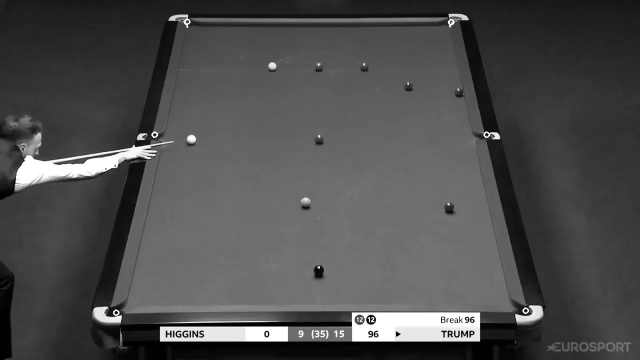

2


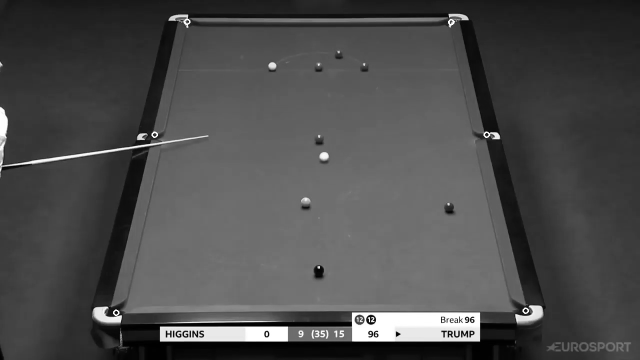

3


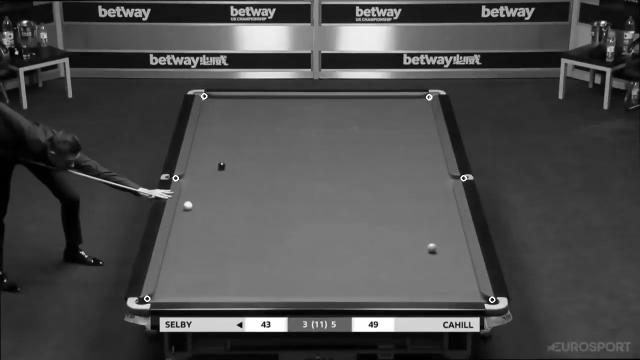

4


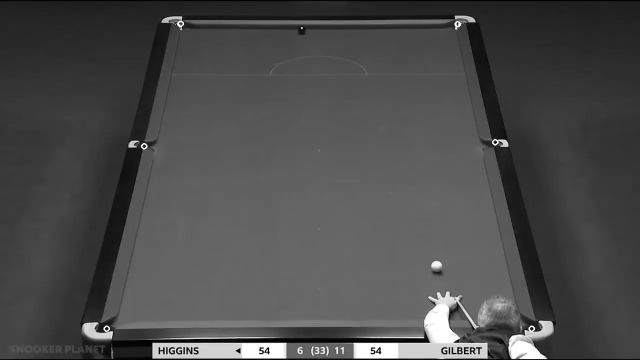

5


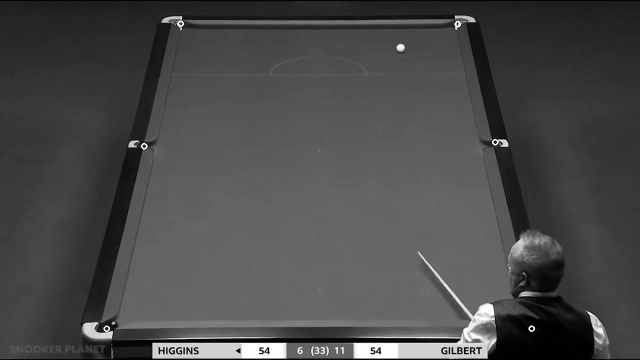

6


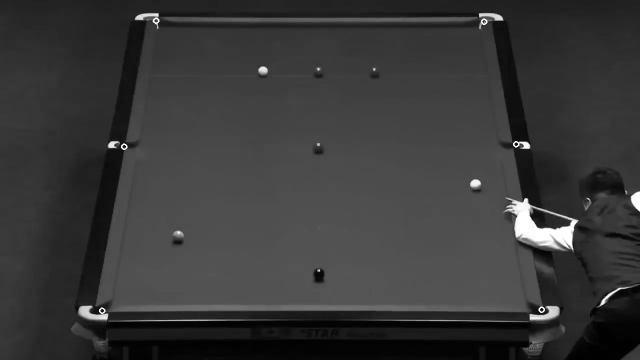

7


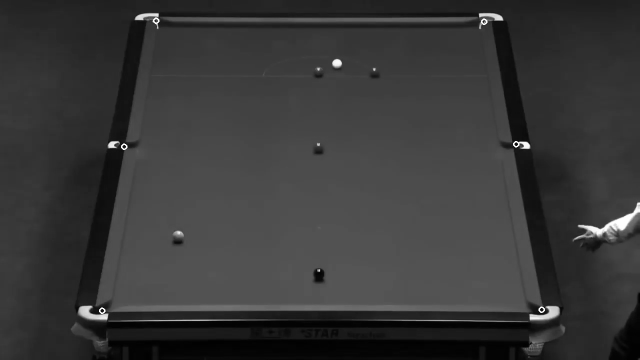

8


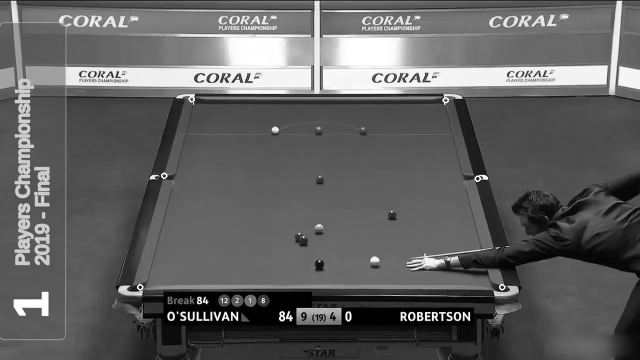

9


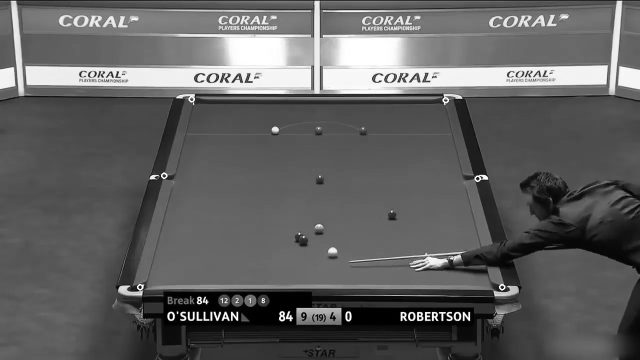

10


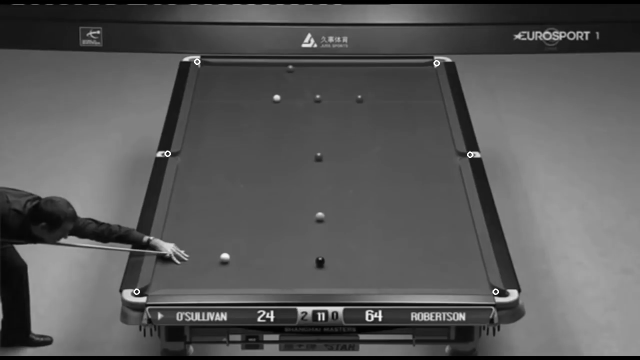

11


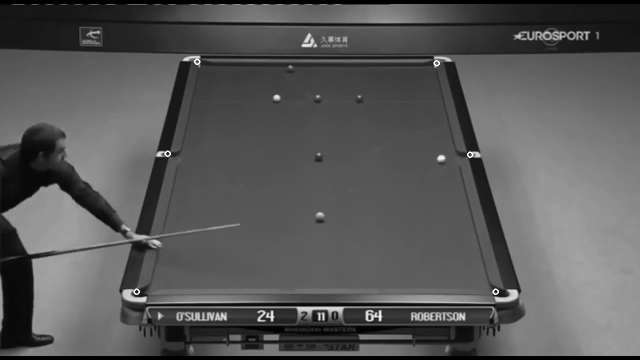

12


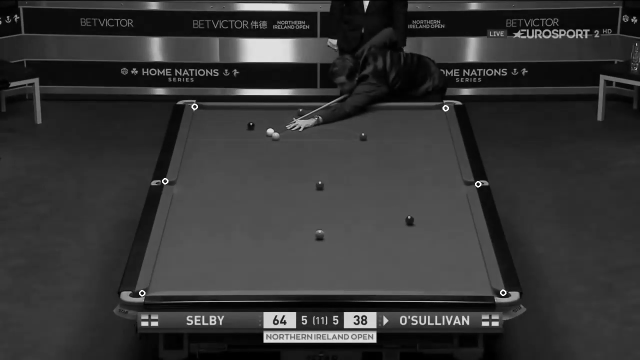

13


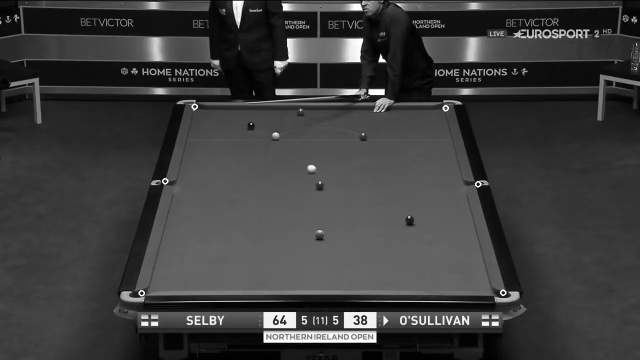

14


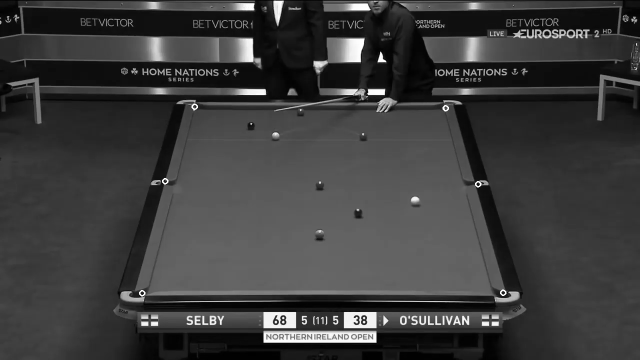

15


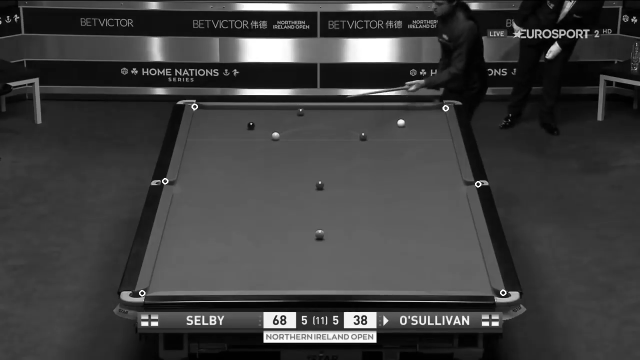

16


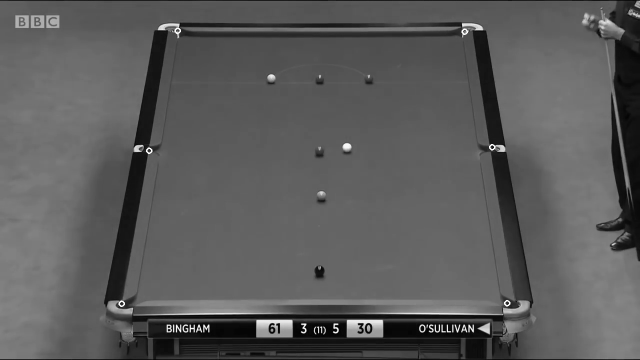

17


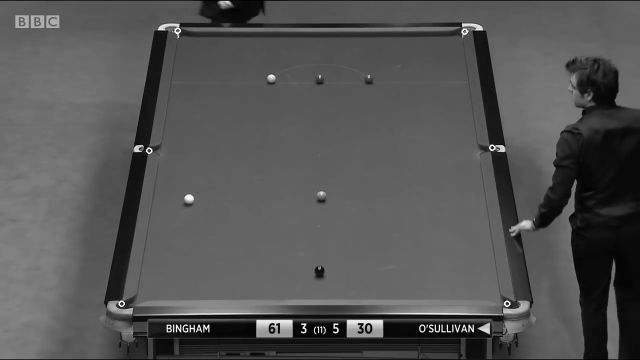

18


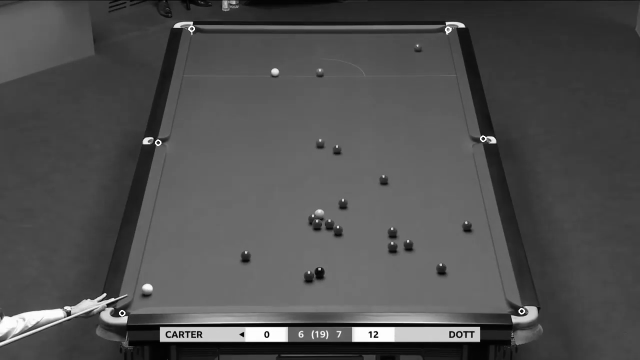

19


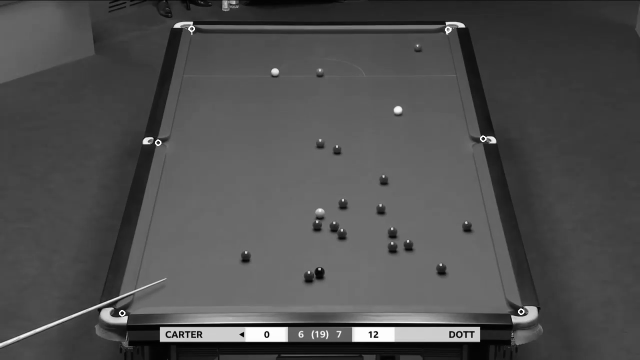

20


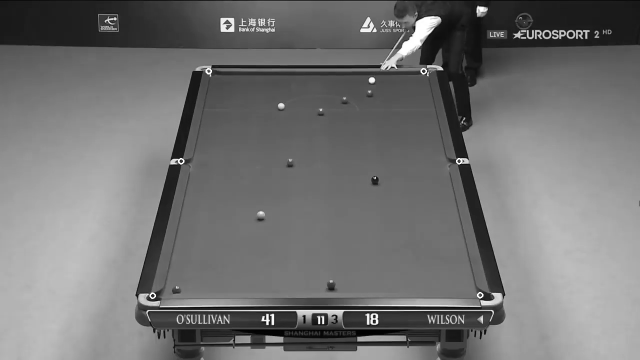

21


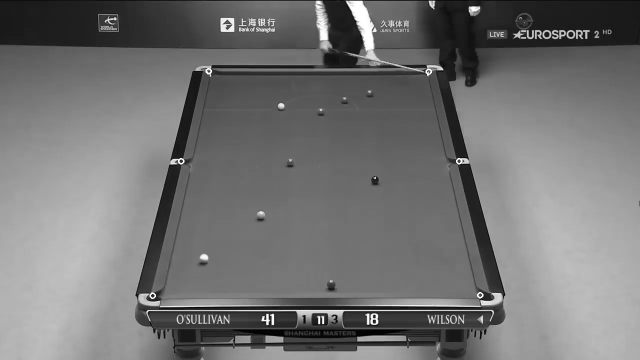

22


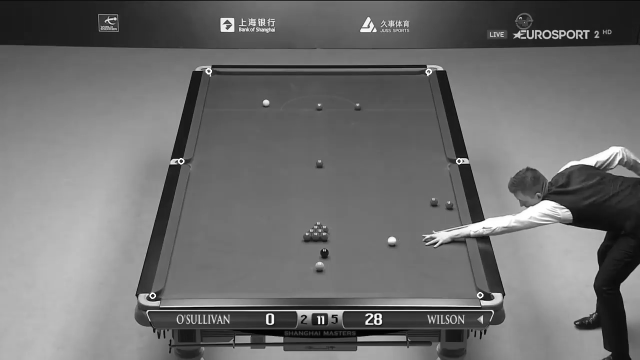

23


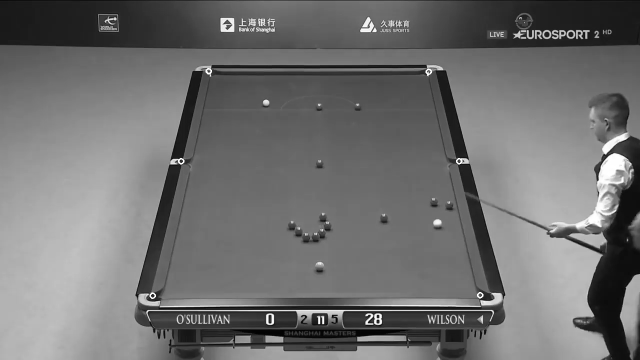

24


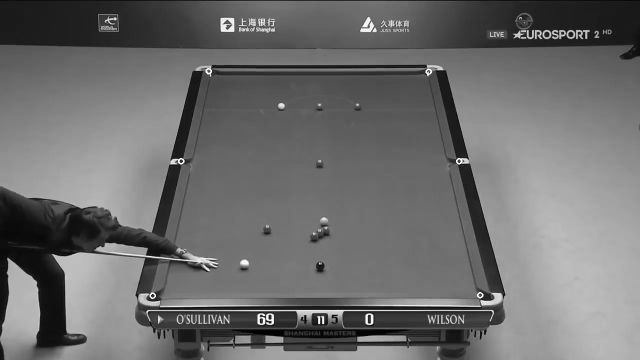

25


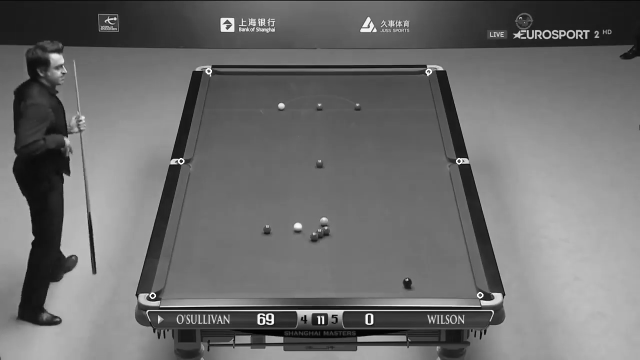

26


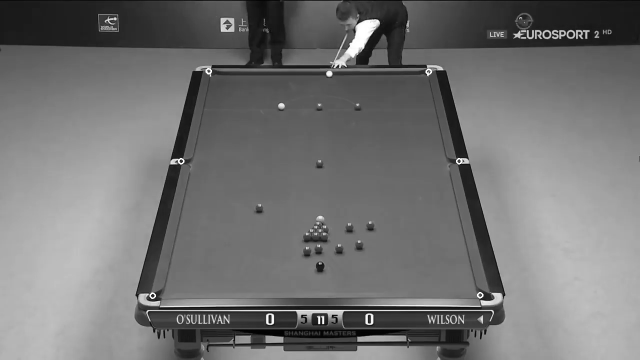

27


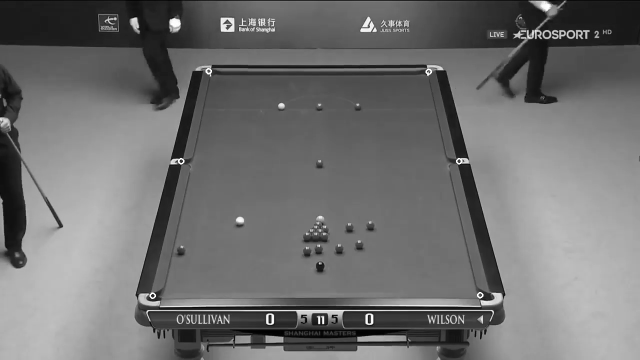

28


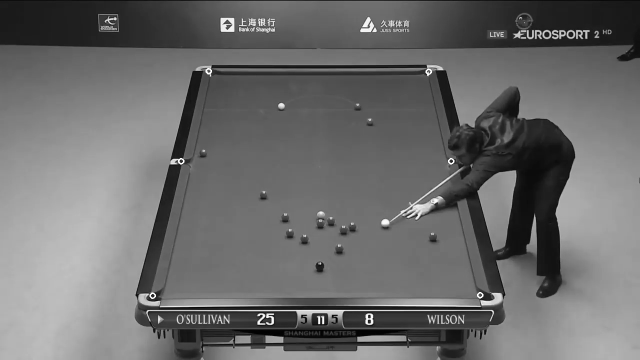

29


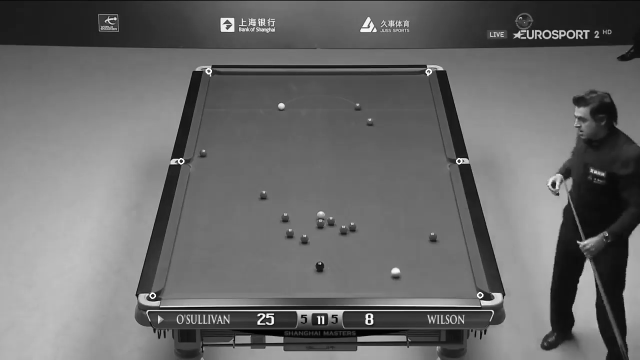

30


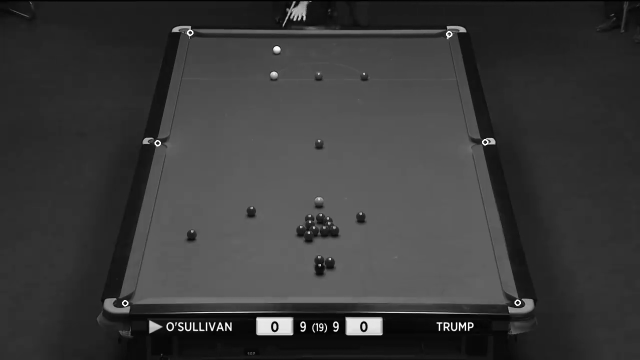

31


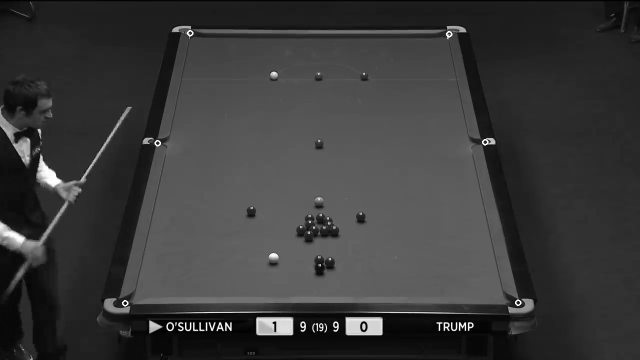

32


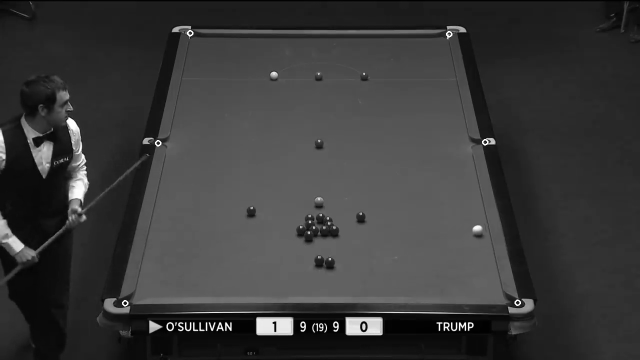

33


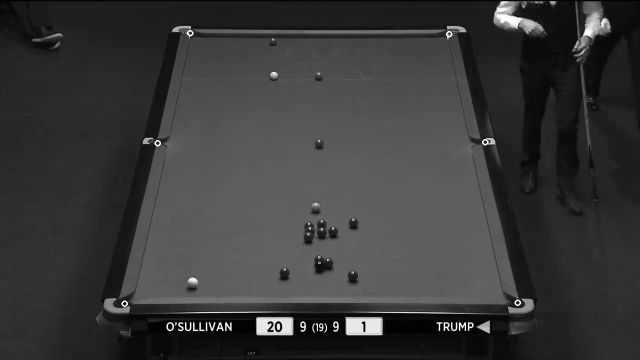

34


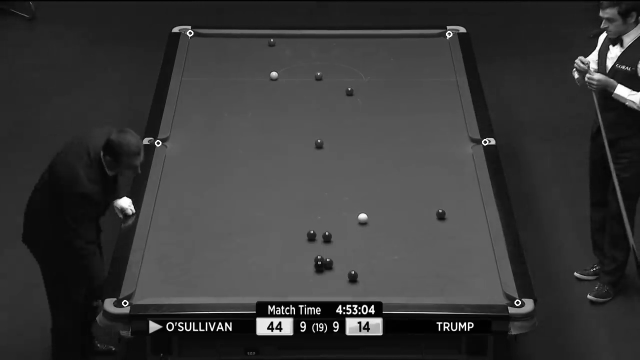

35


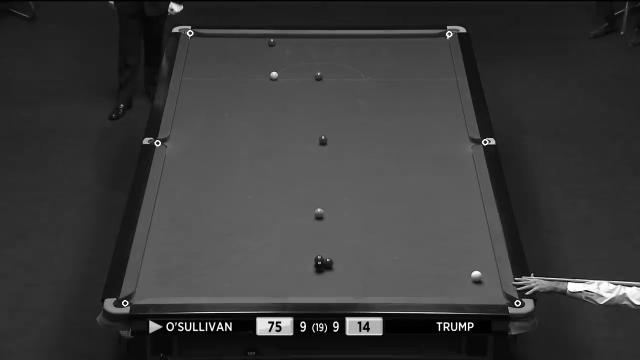

36


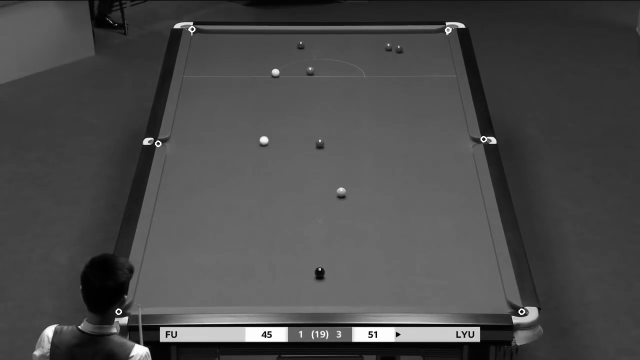

37


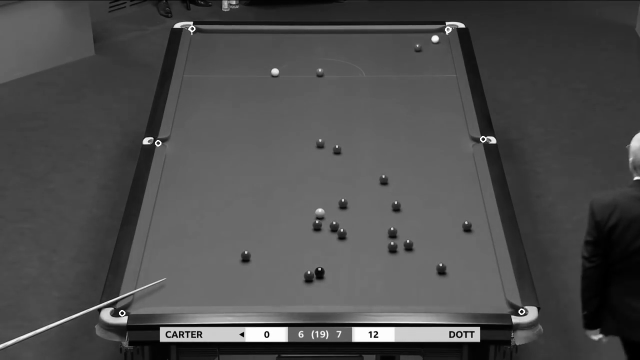

38


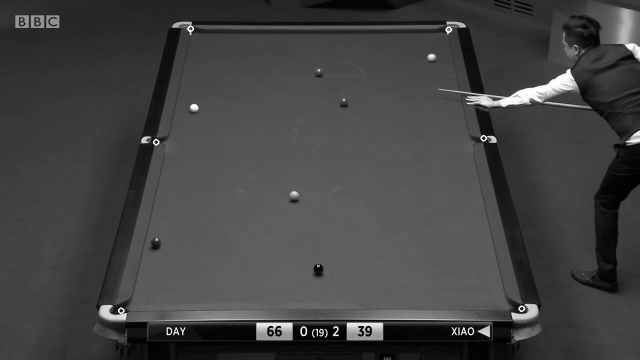

39


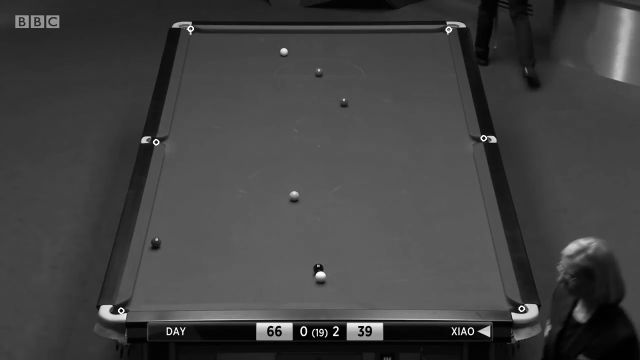

40


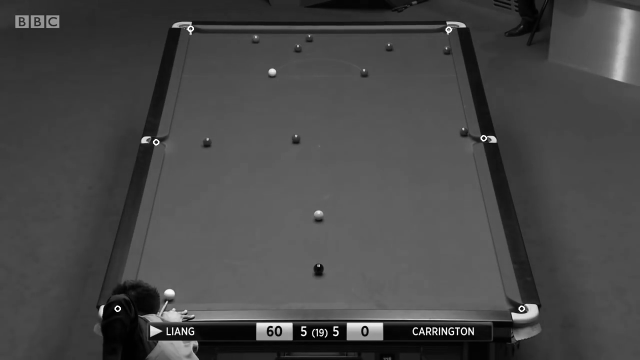

41


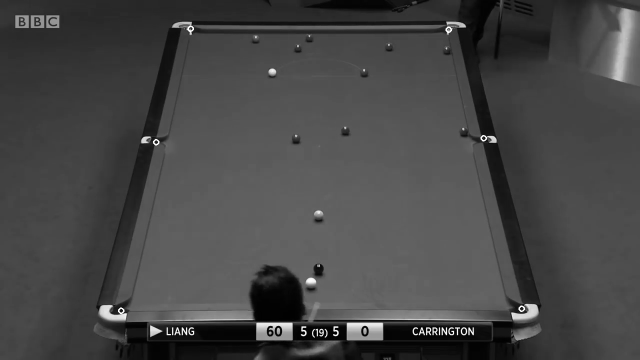

42


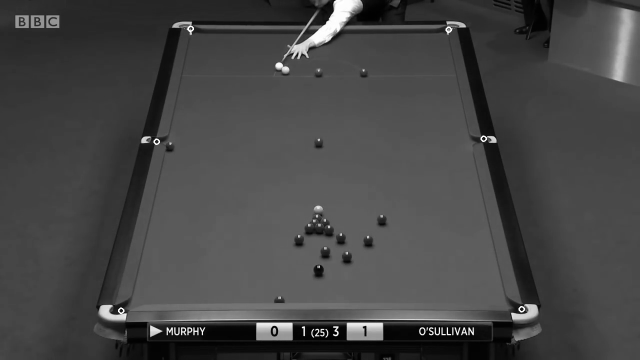

43


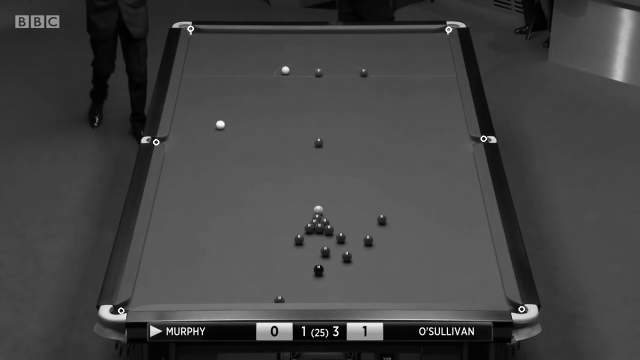

44


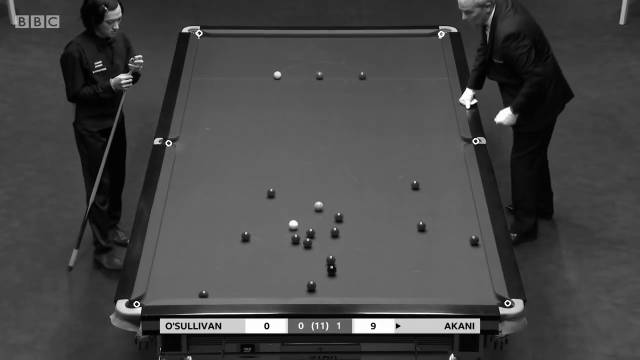

45


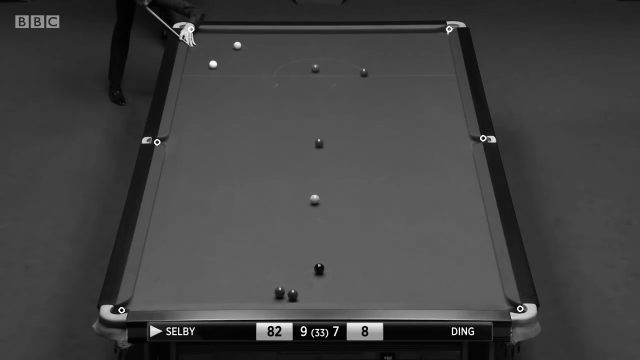

46


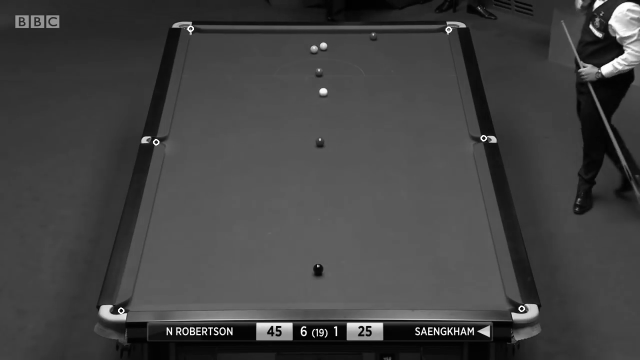

47


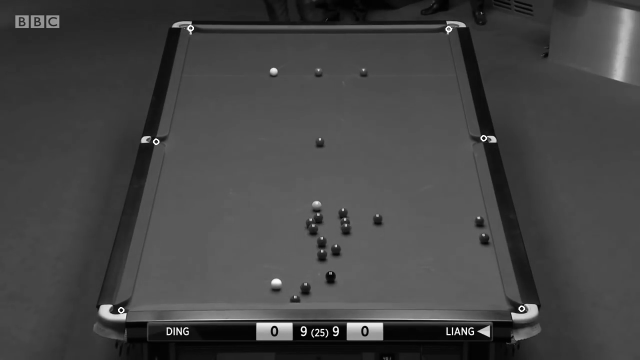

48


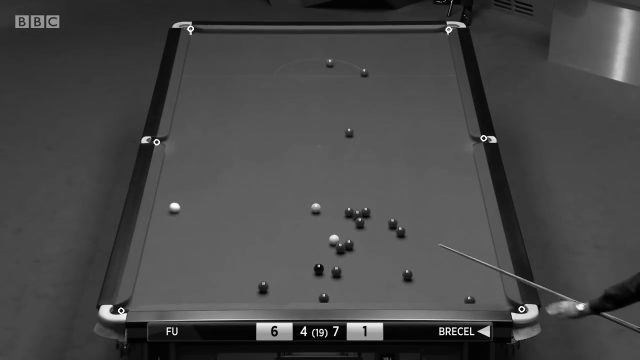

49


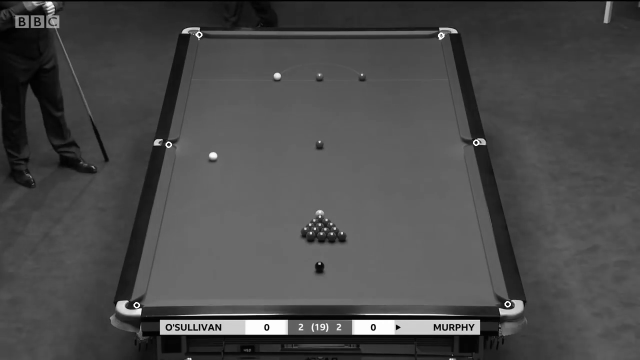

50


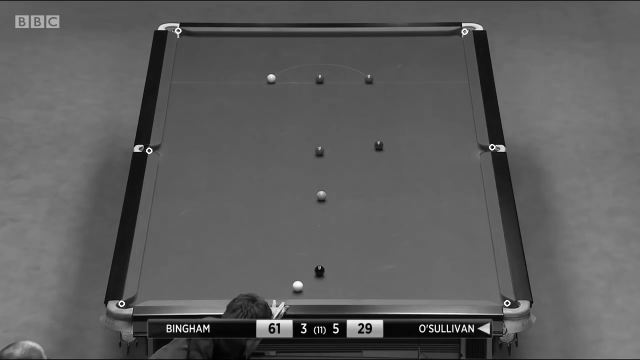

In [0]:
#2
for i in range(1, 51):
    print(i)
    imgColor = cv.imread(folder_in + 'Task1/'+ str(i) +'.jpg')
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
    
    _, _, _, _, _, _ = get_pockets(img.copy(), True)

In [0]:
#3
def get_areas_of_interet(frame):
    imgColor = frame.copy()
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
            
    bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner, middle_left_corner, middle_right_corner = get_pockets(img.copy(), False)
    if bottom_left_corner is None or bottom_right_corner is None or top_right_corner is None or top_left_corner is None or middle_right_corner is None or middle_left_corner is None:
        return None, None, None, None, None, None

    mask = np.zeros(imgColor.shape, dtype=np.uint8)
            
    corners = np.array([[bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]], dtype=np.int32)
    channel_count = imgColor.shape[2]  # i.e. 3 or 4 depending on your image
    ignore_mask_color = (255,)*channel_count
    cv.fillPoly(mask, corners, ignore_mask_color)
    # apply the mask
    masked_image = cv.bitwise_and(imgColor, mask)
    masked_image = masked_image[top_right_corner[1]:bottom_left_corner[1], bottom_left_corner[0]:bottom_right_corner[0]]
    padidngSize = 100
    masked_image = cv.copyMakeBorder(masked_image, padidngSize, padidngSize, padidngSize, padidngSize, cv.BORDER_CONSTANT)

    x_cut = bottom_left_corner[0] - padidngSize
    y_cut = top_right_corner[1] - padidngSize

    top_left_corner = (top_left_corner[0] - x_cut, top_left_corner[1] - y_cut) # 1
    top_right_corner = (top_right_corner[0] - x_cut, top_right_corner[1] - y_cut) # 2
    bottom_left_corner = (bottom_left_corner[0] - x_cut, bottom_left_corner[1] - y_cut) # 3
    bottom_right_corner = (bottom_right_corner[0] - x_cut, bottom_right_corner[1] - y_cut) # 4
    middle_left_corner = (middle_left_corner[0] - x_cut, middle_left_corner[1] - y_cut) # 5
    middle_right_corner = (middle_right_corner[0] - x_cut, middle_right_corner[1] - y_cut) # 6
    ###################

    interestRaze = 90

    area_of_interest_1 = masked_image[top_left_corner[1] - interestRaze : top_left_corner[1] + interestRaze, top_left_corner[0] - interestRaze : top_left_corner[0] + interestRaze]
    area_of_interest_2 = masked_image[top_right_corner[1] - interestRaze : top_right_corner[1] + interestRaze, top_right_corner[0] - interestRaze : top_right_corner[0] + interestRaze]
    area_of_interest_3 = masked_image[bottom_left_corner[1] - interestRaze : bottom_left_corner[1] + interestRaze, bottom_left_corner[0] - interestRaze : bottom_left_corner[0] + interestRaze]
    area_of_interest_4 = masked_image[bottom_right_corner[1] - interestRaze : bottom_right_corner[1] + interestRaze, bottom_right_corner[0] - interestRaze : bottom_right_corner[0] + interestRaze]
    area_of_interest_5 = masked_image[middle_left_corner[1] - interestRaze : middle_left_corner[1] + interestRaze, middle_left_corner[0] - interestRaze : middle_left_corner[0] + interestRaze]
    area_of_interest_6 = masked_image[middle_right_corner[1] - interestRaze : middle_right_corner[1] + interestRaze, middle_right_corner[0] - interestRaze : middle_right_corner[0] + interestRaze]

    return area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6

In [0]:
#4
from collections import defaultdict

cap = cv.VideoCapture(folder_in + 'Task2/23.mp4')  
current_frame = 0

ret, frame = cap.read() # Read the frame
area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_areas_of_interet(frame)
while area_of_interest_1 is None:
    current_frame = current_frame + 1
    ret, frame = cap.read() # Read the frame
    area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_areas_of_interet(frame)

area_of_interest_1_gray = cv.cvtColor(area_of_interest_1,cv.COLOR_BGR2GRAY)
old_area_of_interest_1_gray = area_of_interest_1_gray
area_of_interest_2_gray = cv.cvtColor(area_of_interest_2,cv.COLOR_BGR2GRAY)
old_area_of_interest_2_gray = area_of_interest_2_gray
area_of_interest_3_gray = cv.cvtColor(area_of_interest_3,cv.COLOR_BGR2GRAY)
old_area_of_interest_3_gray = area_of_interest_3_gray
area_of_interest_4_gray = cv.cvtColor(area_of_interest_4,cv.COLOR_BGR2GRAY)
old_area_of_interest_4_gray = area_of_interest_4_gray
area_of_interest_5_gray = cv.cvtColor(area_of_interest_5,cv.COLOR_BGR2GRAY)
old_area_of_interest_5_gray = area_of_interest_5_gray
area_of_interest_6_gray = cv.cvtColor(area_of_interest_6,cv.COLOR_BGR2GRAY)
old_area_of_interest_6_gray = area_of_interest_6_gray

interestCorners = defaultdict(list)

while(cap.isOpened()): 
    ret, frame = cap.read() # Read the frame
    if ret is True: 
        current_frame = current_frame + 1 

        if current_frame % 2:
            continue
        else:
            area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_areas_of_interet(frame)
            if area_of_interest_1 is None:
                continue
            area_of_interest_1_gray = cv.cvtColor(area_of_interest_1,cv.COLOR_BGR2GRAY)
            area_of_interest_2_gray = cv.cvtColor(area_of_interest_2,cv.COLOR_BGR2GRAY)
            area_of_interest_3_gray = cv.cvtColor(area_of_interest_3,cv.COLOR_BGR2GRAY)
            area_of_interest_4_gray = cv.cvtColor(area_of_interest_4,cv.COLOR_BGR2GRAY)
            area_of_interest_5_gray = cv.cvtColor(area_of_interest_5,cv.COLOR_BGR2GRAY)
            area_of_interest_6_gray = cv.cvtColor(area_of_interest_6,cv.COLOR_BGR2GRAY)
                    
            # compute frame diff            
            temp_1 = np.abs(np.float16(area_of_interest_1_gray) - np.float16(old_area_of_interest_1_gray))
            diff_1 = np.uint8(temp_1)
            temp_2 = np.abs(np.float16(area_of_interest_2_gray) - np.float16(old_area_of_interest_2_gray))
            diff_2 = np.uint8(temp_2)
            temp_3 = np.abs(np.float16(area_of_interest_3_gray) - np.float16(old_area_of_interest_3_gray))
            diff_3 = np.uint8(temp_3)
            temp_4 = np.abs(np.float16(area_of_interest_4_gray) - np.float16(old_area_of_interest_4_gray))
            diff_4 = np.uint8(temp_4)
            temp_5 = np.abs(np.float16(area_of_interest_5_gray) - np.float16(old_area_of_interest_5_gray))
            diff_5 = np.uint8(temp_5)
            temp_6 = np.abs(np.float16(area_of_interest_6_gray) - np.float16(old_area_of_interest_6_gray))
            diff_6 = np.uint8(temp_6)

            #print(current_frame)
            #cv2_imshow(np.concatenate((diff_1, diff_2, diff_3, diff_4, diff_5, diff_6), axis=1))

            diffs = [diff_1, diff_2, diff_3, diff_4, diff_5, diff_6]

            for i in range(len(diffs)):
                if np.sum(diffs[i]) // 255 > 50:
                    interestCorners[i+1].append((diffs[i], current_frame))

            old_area_of_interest_1_gray = area_of_interest_1_gray
            old_area_of_interest_2_gray = area_of_interest_2_gray
            old_area_of_interest_3_gray = area_of_interest_3_gray
            old_area_of_interest_4_gray = area_of_interest_4_gray
            old_area_of_interest_5_gray = area_of_interest_5_gray
            old_area_of_interest_6_gray = area_of_interest_6_gray

    else:
        break

# after playing the video, release the video capture    
cap.release()
# close all the frames
cv.destroyAllWindows()

1
210


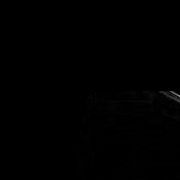

212


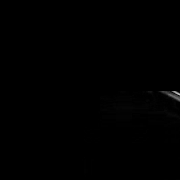

228


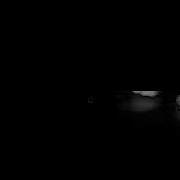

2
3
190


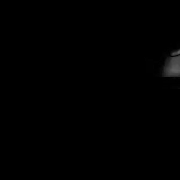

192


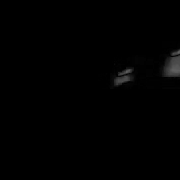

194


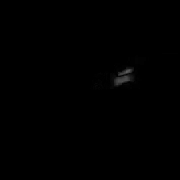

4
5
6
158


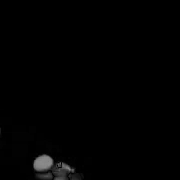

160


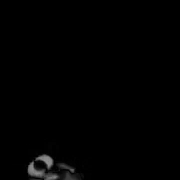

162


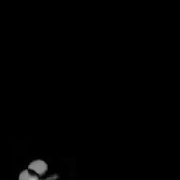

164


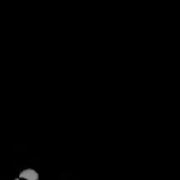

In [0]:
#5
for i in range(1, 7):
    all = np.zeros((100,0))
    sum = 0
    print(i)
    for j in interestCorners[i]:
        print(j[1])
        cv2_imshow(j[0])
    #sum = np.sum(all) // 255
    #if not np.array_equal(all, np.zeros((100,0))):
        #print(i)
        #cv2_imshow(all)
        #print(sum)

In [0]:
#6
def get_suspicious_pockets(path, suspicious_color):

    cap = cv.VideoCapture(path)  
    current_frame = 0

    ret, frame = cap.read() # Read the frame
    area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_areas_of_interet(frame)
    while area_of_interest_1 is None:
        current_frame = current_frame + 1
        ret, frame = cap.read() # Read the frame
        area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_areas_of_interet(frame)

    area_of_interest_1_gray = cv.cvtColor(area_of_interest_1,cv.COLOR_BGR2GRAY)
    old_area_of_interest_1_gray = area_of_interest_1_gray
    area_of_interest_2_gray = cv.cvtColor(area_of_interest_2,cv.COLOR_BGR2GRAY)
    old_area_of_interest_2_gray = area_of_interest_2_gray
    area_of_interest_3_gray = cv.cvtColor(area_of_interest_3,cv.COLOR_BGR2GRAY)
    old_area_of_interest_3_gray = area_of_interest_3_gray
    area_of_interest_4_gray = cv.cvtColor(area_of_interest_4,cv.COLOR_BGR2GRAY)
    old_area_of_interest_4_gray = area_of_interest_4_gray
    area_of_interest_5_gray = cv.cvtColor(area_of_interest_5,cv.COLOR_BGR2GRAY)
    old_area_of_interest_5_gray = area_of_interest_5_gray
    area_of_interest_6_gray = cv.cvtColor(area_of_interest_6,cv.COLOR_BGR2GRAY)
    old_area_of_interest_6_gray = area_of_interest_6_gray

    interestCorners = defaultdict(list)

    while(cap.isOpened()): 
        ret, frame = cap.read() # Read the frame
        if ret is True: 
            current_frame = current_frame + 1 

            if current_frame % 2:
                continue
            else:
                area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_areas_of_interet(frame.copy())
                if area_of_interest_1 is None:
                    continue
                area_of_interest_1_gray = cv.cvtColor(area_of_interest_1,cv.COLOR_BGR2GRAY)
                area_of_interest_2_gray = cv.cvtColor(area_of_interest_2,cv.COLOR_BGR2GRAY)
                area_of_interest_3_gray = cv.cvtColor(area_of_interest_3,cv.COLOR_BGR2GRAY)
                area_of_interest_4_gray = cv.cvtColor(area_of_interest_4,cv.COLOR_BGR2GRAY)
                area_of_interest_5_gray = cv.cvtColor(area_of_interest_5,cv.COLOR_BGR2GRAY)
                area_of_interest_6_gray = cv.cvtColor(area_of_interest_6,cv.COLOR_BGR2GRAY)
                        
                # compute frame diff            
                temp_1 = np.abs(np.float16(area_of_interest_1_gray) - np.float16(old_area_of_interest_1_gray))
                diff_1 = np.uint8(temp_1)
                temp_2 = np.abs(np.float16(area_of_interest_2_gray) - np.float16(old_area_of_interest_2_gray))
                diff_2 = np.uint8(temp_2)
                temp_3 = np.abs(np.float16(area_of_interest_3_gray) - np.float16(old_area_of_interest_3_gray))
                diff_3 = np.uint8(temp_3)
                temp_4 = np.abs(np.float16(area_of_interest_4_gray) - np.float16(old_area_of_interest_4_gray))
                diff_4 = np.uint8(temp_4)
                temp_5 = np.abs(np.float16(area_of_interest_5_gray) - np.float16(old_area_of_interest_5_gray))
                diff_5 = np.uint8(temp_5)
                temp_6 = np.abs(np.float16(area_of_interest_6_gray) - np.float16(old_area_of_interest_6_gray))
                diff_6 = np.uint8(temp_6)

                #print(current_frame)
                #cv2_imshow(np.concatenate((diff_1, diff_2, diff_3, diff_4, diff_5, diff_6), axis=1))

                if np.sum(diff_1) // 255 > 50:
                    interestCorners[1].append((area_of_interest_1, current_frame))
                if np.sum(diff_2) // 255 > 50:
                    interestCorners[2].append((area_of_interest_2, current_frame))
                if np.sum(diff_3) // 255 > 50:
                    interestCorners[3].append((area_of_interest_3, current_frame))
                if np.sum(diff_4) // 255 > 50:
                    interestCorners[4].append((area_of_interest_4, current_frame))
                if np.sum(diff_5) // 255 > 50:
                    interestCorners[5].append((area_of_interest_5, current_frame))
                if np.sum(diff_6) // 255 > 50:
                    interestCorners[6].append((area_of_interest_6, current_frame))

                old_area_of_interest_1_gray = area_of_interest_1_gray
                old_area_of_interest_2_gray = area_of_interest_2_gray
                old_area_of_interest_3_gray = area_of_interest_3_gray
                old_area_of_interest_4_gray = area_of_interest_4_gray
                old_area_of_interest_5_gray = area_of_interest_5_gray
                old_area_of_interest_6_gray = area_of_interest_6_gray

        else:
            break

    # after playing the video, release the video capture    
    cap.release()
    # close all the frames
    cv.destroyAllWindows()

    low_white = (80, 140, 65)
    high_white = (255, 255, 255)
 
    low_blue = (91, 0, 0)
    high_blue = (180, 135, 55)

    low_dark_green = (37, 60, 0)
    high_dark_green = (60, 255, 30)

    low_yellow = (0, 107, 68)
    high_yellow = (60, 255, 255)

    low_red = (0, 0, 50)
    high_red = (30, 50, 255)

    low_pink = (45, 0, 166)
    high_pink = (255, 162, 255)

    low_brown = (0, 52, 37)
    high_brown = (45, 105, 166)

    low_black = (0, 0, 0)
    high_black = (45, 38, 55)


    if suspicious_color == "white":
        low_color = low_white
        high_color = high_white
    if suspicious_color == "red":
        low_color = low_red
        high_color = high_red
    if suspicious_color == "blue":
        low_color = low_blue
        high_color = high_blue
    if suspicious_color == "pink":
        low_color = low_pink
        high_color = high_pink
    if suspicious_color == "green":
        low_color = low_dark_green
        high_color = high_dark_green
    if suspicious_color == "brown":
        low_color = low_brown
        high_color = high_brown
    if suspicious_color == "yellow":
        low_color = low_yellow
        high_color = high_yellow
    if suspicious_color == "black":
        low_color = low_black
        high_color = high_black

    corners_scores = np.zeros(7)

    for i in range(1, 7):
        sum = 0
        for j in interestCorners[i]:
            score = np.sum(cv.inRange(j[0], low_color, high_color))
            sum += score
        if len(interestCorners[i]) > 0:
            sum = sum / len(interestCorners[i])
        corners_scores[i] = sum
    
    return np.argmax(corners_scores)

In [0]:
#7
def get_numbers_and_colors(imgColor, show_results = True):
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
    
    bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner = get_corners(img.copy(), False)

    #points_template = np.float32([(2000, 2000), (0, 2000), (0, 0), (2000, 0)]) # the points of the 4 corners (table) in the template image
    #points_query = np.float32([bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]) # the points of the 4 corners (table) in the test image
    #homography = cv.getPerspectiveTransform(points_query, points_template)
    #height, width = 2000, 2000 # the shape with respect to the template image
    #aligned_image2 = cv.warpPerspective(imgColor, homography, (width, height), flags=cv.INTER_NEAREST)

    mask = np.zeros(imgColor.shape, dtype=np.uint8)
    
    corners = np.array([[bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner]], dtype=np.int32)
    channel_count = imgColor.shape[2]  # i.e. 3 or 4 depending on your image
    ignore_mask_color = (255,)*channel_count
    cv.fillPoly(mask, corners, ignore_mask_color)
    # apply the mask
    masked_image = cv.bitwise_and(imgColor, mask)

    masked_image = masked_image[top_right_corner[1]:bottom_left_corner[1], bottom_left_corner[0]:bottom_right_corner[0]]

    ####################

    imgColor = masked_image
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)

    w, h = img.shape[::-1]

    thresholds = [0.7, 0.7, 0.7, 0.8, 0.8, 0.8, 0.7]
    locations = []

    for template_numer in range(1, 8):
        template = cv.imread(data_dir_drive + '/data/templates/ball' + str(template_numer) + '.jpg', 0)
        w_T, h_T = template.shape[::-1]

        threshold = thresholds[template_numer-1]
        loc = get_balls_template_matching(img, template, threshold)
        for pt in zip(*loc):
            locations.append((pt[0], pt[1], pt[0] + w_T, pt[1] + h_T))

    boxes = non_max_suppression_fast(np.array(locations), 0.3)

    copyImgColor = imgColor.copy()
    colors = []

    for box in boxes:
        if not false_pozitive(imgColor, box, 0.5):
            color = get_box_color(imgColor, box, show_results)
            colors.append(color)
            if show_results:
                cv.rectangle(copyImgColor, (box[0], box[1]), (box[2], box[3]), (0,0,255), 2) 

    balls, num_balls = process_colors(colors)
    balls["white"] = 1

    if show_results:
        cv2_imshow(copyImgColor)
    
    return num_balls, balls

In [0]:
#8
def cmp_dict(d1, d2):
    if d1["white"] > d2["white"]:
        return "white"
    if d1["red"] > d2["red"]:
        return "red"
    if d1["blue"] > d2["blue"]:
        return "blue"
    if d1["dark_green"] > d2["dark_green"]:
        return "green"
    if d1["brown"] > d2["brown"]:
        return "brown"
    if d1["yellow"] > d2["yellow"]:
        return "yellow"
    if d1["black"] > d2["black"]:
        return "black"
    return True

1


green black white
99610650.0 66555000.0 5102550.0


green red black
95533200.0 39841200.0 14137200.0


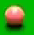

green pink white
232442700.0 38234700.0 36110550.0


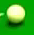

green white yellow
254898000.0 65545200.0 13351800.0


green blue black
111384000.0 20349000.0 6211800.0


green red brown
111598200.0 30202200.0 10495800.0


green red brown
114168600.0 29131200.0 12423600.0


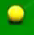

green yellow white
272498100.0 50372700.0 9406950.0


green brown yellow
123165000.0 23776200.0 8568000.0


green dark_green white
146084400.0 15636600.0 4498200.0


black green white
22876560.0 22105440.0 4241160.0


green black white
23205000.0 20400000.0 6120000.0


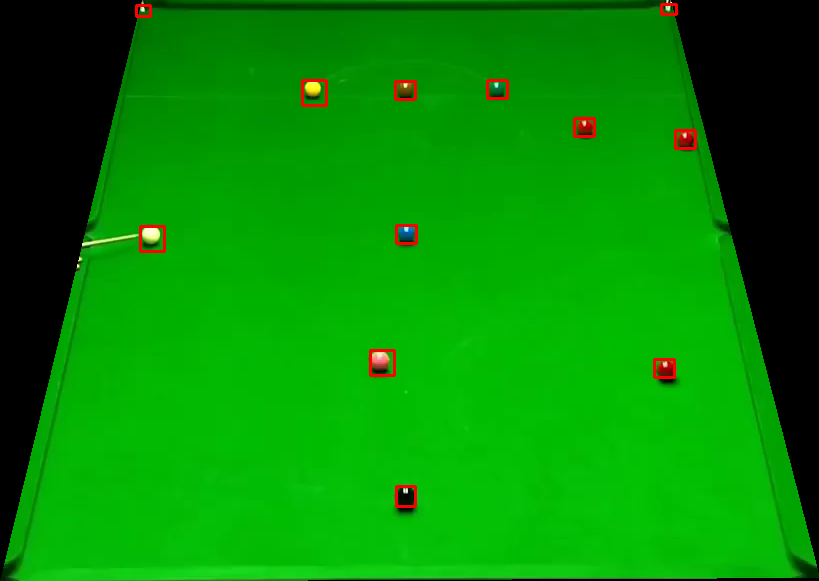

green black white
98057700.0 64336500.0 5324400.0


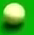

green white yellow
213021900.0 78290100.0 25186350.0


green red black
94462200.0 38984400.0 16493400.0


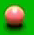

green pink white
232139250.0 39751950.0 34593300.0


green blue dark_green
110098800.0 20134800.0 7497000.0


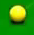

green yellow white
272801550.0 50069250.0 10924200.0


green brown yellow
123379200.0 24633000.0 8353800.0


green dark_green white
143299800.0 15208200.0 4069800.0


green red brown
108171000.0 25918200.0 22276800.0


black green white
23005080.0 22619520.0 3984120.0


green black white
24033240.0 19278000.0 6168960.0


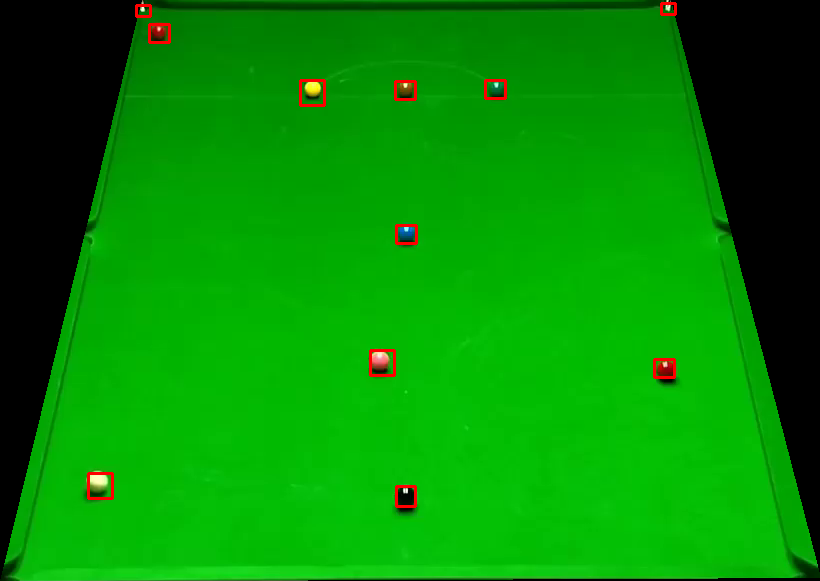

{'white': 1, 'red': 3, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 2, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
YES YES True
1 2 False
red red True
2


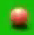

green pink yellow
230622000.0 30951900.0 29131200.0


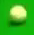

green white yellow
279477450.0 48248550.0 14565600.0


green black white
100755090.0 8737065.0 2602530.0


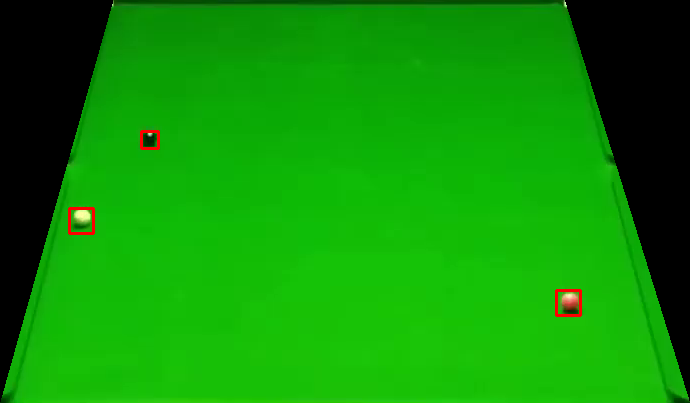

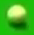

green white yellow
252773850.0 50676150.0 27917400.0


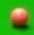

green yellow pink
222732300.0 42179550.0 28827750.0


green black white
99825615.0 12269070.0 2602530.0


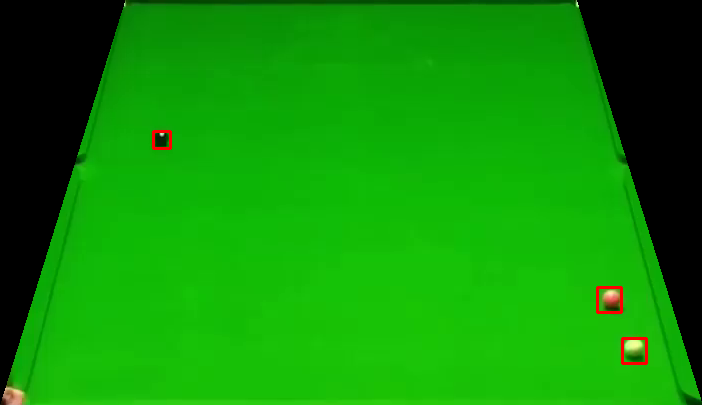

{'white': 1, 'red': 0, 'blue': 0, 'pink': 1, 'dark_green': 0, 'brown': 0, 'yellow': 0, 'black': 1}
{'white': 1, 'red': 0, 'blue': 0, 'pink': 1, 'dark_green': 0, 'brown': 0, 'yellow': 0, 'black': 1}
NO NO True
0 0 True
  True
3


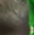

black green brown
23062200.0 18510450.0 14565600.0


black brown yellow
36842400.0 4069800.0 0.0


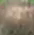

white pink black
131090400.0 38234700.0 0.0


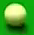

green white yellow
203311500.0 78897000.0 26400150.0


green black white
47217330.0 28070145.0 2230740.0


green black white
20782500.0 18870000.0 7012500.0


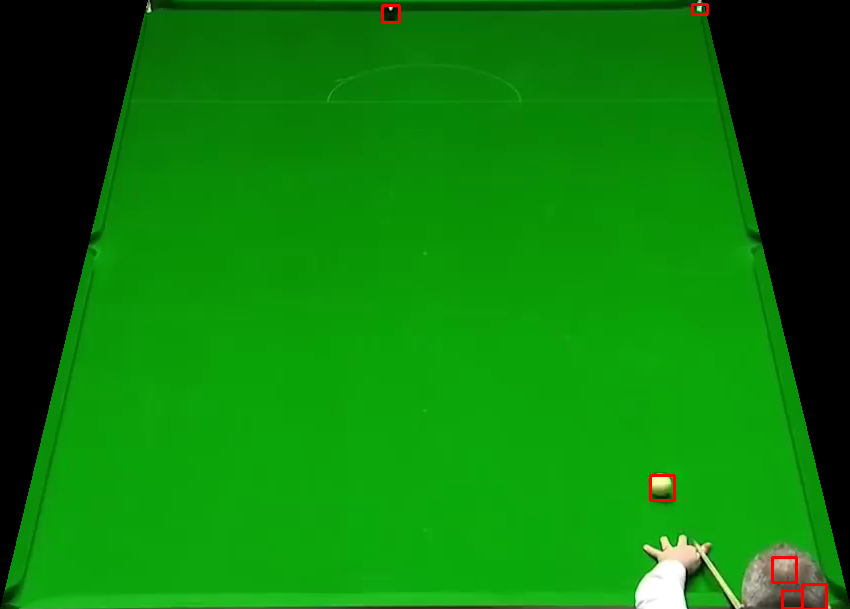

green black yellow
85037400.0 22276800.0 0.0


black yellow brown
178000200.0 0.0 0.0


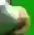

white green brown
96800550.0 83145300.0 51283050.0


white brown black
100245600.0 4069800.0 0.0


white green black
104287095.0 9666540.0 0.0


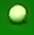

green white yellow
268553250.0 60083100.0 3337950.0


green black white
21848400.0 18635400.0 7068600.0


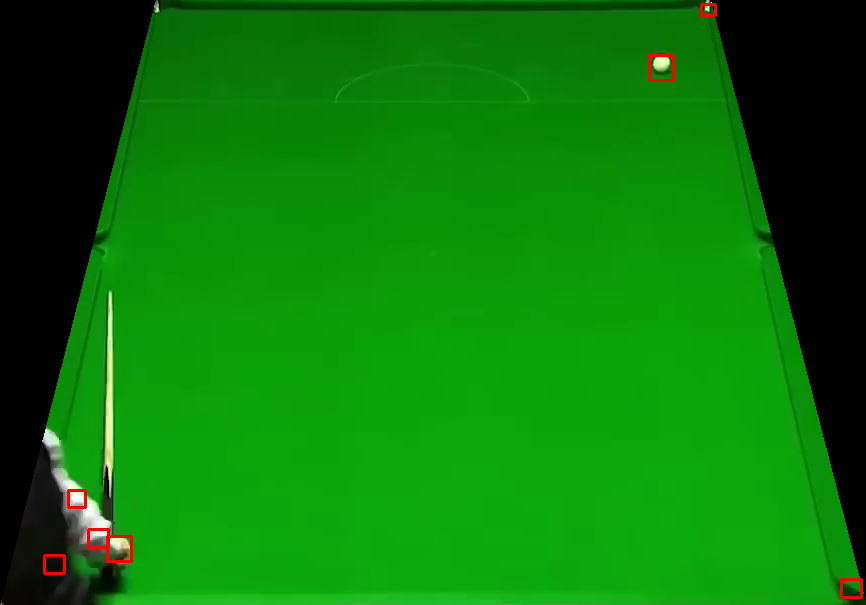

{'white': 1, 'red': 0, 'blue': 0, 'pink': 0, 'dark_green': 0, 'brown': 0, 'yellow': 0, 'black': 1}
{'white': 1, 'red': 0, 'blue': 0, 'pink': 0, 'dark_green': 0, 'brown': 0, 'yellow': 0, 'black': 1}
NO YES False
0 3 False
 black False
4


green black yellow
66402000.0 59761800.0 0.0


green black white
83538000.0 65759400.0 3427200.0


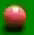

green pink black
169021650.0 51889950.0 32165700.0


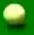

green white yellow
207256350.0 77986650.0 21241500.0


green blue dark_green
82467000.0 27846000.0 10495800.0


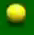

green yellow brown
135642150.0 59172750.0 20027700.0


green dark_green white
46695600.0 6426000.0 4712400.0


green brown red
46267200.0 38556000.0 8782200.0


white black green
5482500.0 3825000.0 2550000.0


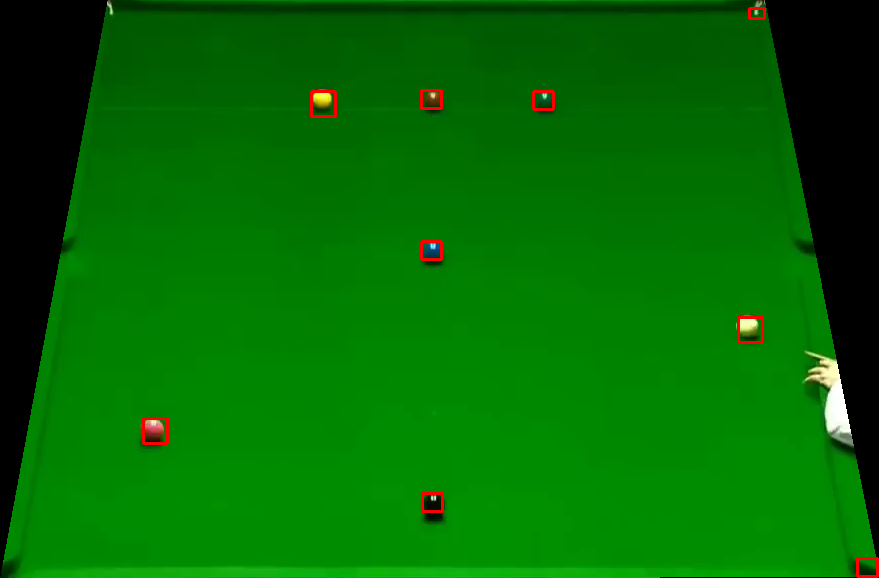

green black white
85680000.0 64474200.0 3855600.0


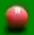

green pink red
173876850.0 49158900.0 30345000.0


green blue dark_green
80967600.0 30630600.0 8353800.0


green dark_green white
44982000.0 8782200.0 4712400.0


green brown red
52479000.0 34914600.0 10495800.0


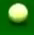

green white yellow
132000750.0 72524550.0 11227650.0


white black green
5865000.0 3825000.0 1912500.0


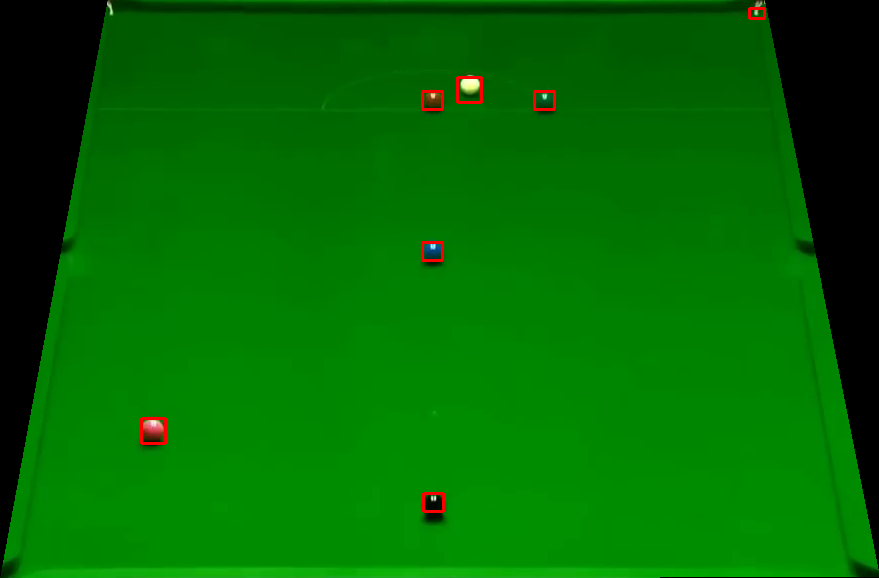

{'white': 1, 'red': 0, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 0, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 0, 'black': 1}
YES YES True
1 6 False
yellow yellow True
5


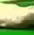

white green brown
171145800.0 55531350.0 44910600.0


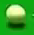

green white yellow
247615200.0 56745150.0 19724250.0


green black dark_green
109372050.0 38601900.0 9983250.0


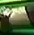

white black brown
82538400.0 61903800.0 34896750.0


red green pink
27412500.0 15300000.0 4207500.0


green red brown
27888840.0 15293880.0 5269320.0


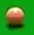

green brown white
250346250.0 31255350.0 28827750.0


green red brown
110955600.0 29559600.0 12423600.0


green blue dark_green
117167400.0 24633000.0 13494600.0


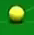

green yellow white
285546450.0 23365650.0 20331150.0


green brown yellow
133875000.0 19706400.0 3427200.0


green dark_green white
155295000.0 23347800.0 2570400.0


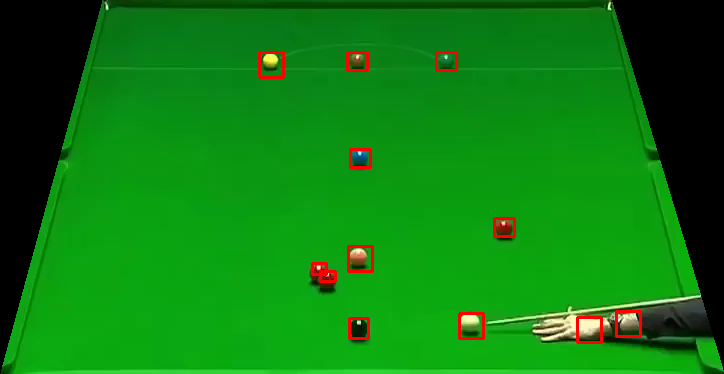

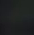

black yellow brown
324388050.0 0.0 0.0


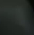

black yellow brown
110759250.0 0.0 0.0


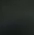

black yellow brown
114704100.0 0.0 0.0


black yellow brown
122094000.0 0.0 0.0


black yellow brown
96175800.0 0.0 0.0


red green brown
23519160.0 15036840.0 6554520.0


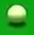

green white yellow
264304950.0 58565850.0 12441450.0


green red brown
27760320.0 14137200.0 5397840.0


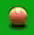

green brown white
251863500.0 27007050.0 26400150.0


black green dark_green
83752200.0 9639000.0 2356200.0


black yellow brown
59976000.0 0.0 0.0


green red black
107528400.0 30416400.0 11138400.0


green dark_green black
85465800.0 856800.0 0.0


green red black
47552400.0 1927800.0 1071000.0


green blue dark_green
116310600.0 23776200.0 19706400.0


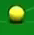

green yellow white
281905050.0 27007050.0 16386300.0


green brown yellow
131947200.0 21205800.0 4712400.0


green dark_green white
152938800.0 31273200.0 2998800.0


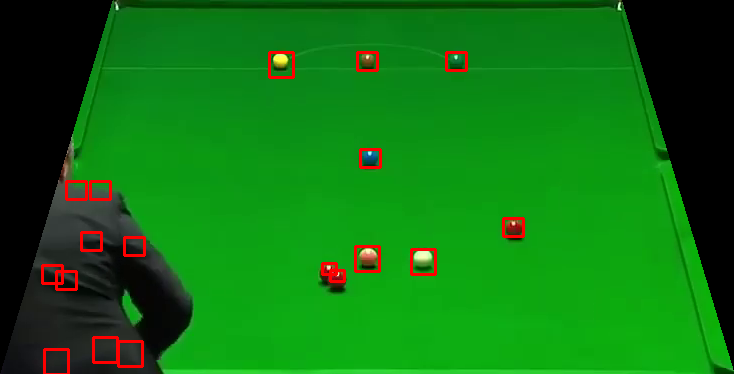

{'white': 1, 'red': 4, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 5, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO YES False
0 3 False
 black False
6


green black brown
109150200.0 32390100.0 2218500.0


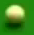

green white yellow
226373700.0 51283050.0 23062200.0


white black brown
45410400.0 43054200.0 22276800.0


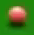

green pink white
236084100.0 31558800.0 21241500.0


green blue dark_green
113311800.0 19063800.0 15850800.0


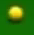

green yellow brown
246401400.0 43696800.0 28524300.0


green brown yellow
115453800.0 39412800.0 3641400.0


brown red pink
14265720.0 10667160.0 4241160.0


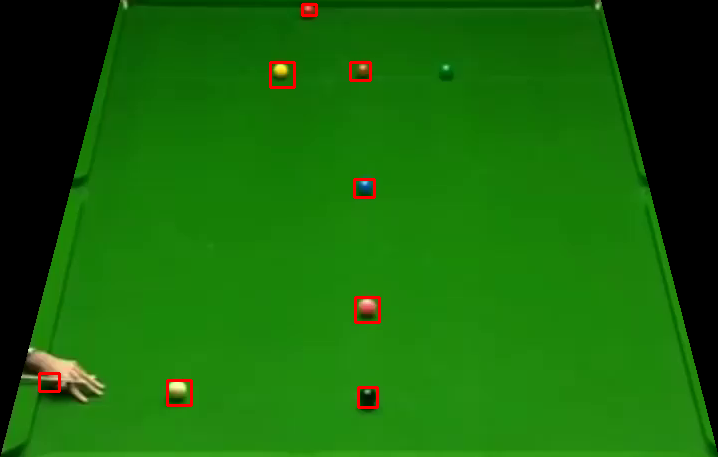

black yellow brown
179928000.0 0.0 0.0


black yellow brown
179928000.0 0.0 0.0


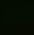

black yellow brown
361105500.0 0.0 0.0


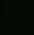

black yellow brown
361105500.0 0.0 0.0


black yellow brown
179928000.0 0.0 0.0


black yellow brown
179928000.0 0.0 0.0


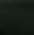

black yellow brown
343808850.0 0.0 0.0


black green brown
99817200.0 5569200.0 1499400.0


black yellow brown
95747400.0 0.0 0.0


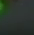

brown green black
29131200.0 3034500.0 0.0


green brown black
90606600.0 37913400.0 0.0


green brown black
77968800.0 48195000.0 0.0


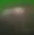

brown green white
52800300.0 35807100.0 6372450.0


green brown black
66402000.0 66187800.0 0.0


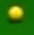

green yellow brown
238208250.0 42483000.0 27007050.0


green brown yellow
117810000.0 37485000.0 3641400.0


green white brown
25653510.0 24724035.0 6878115.0


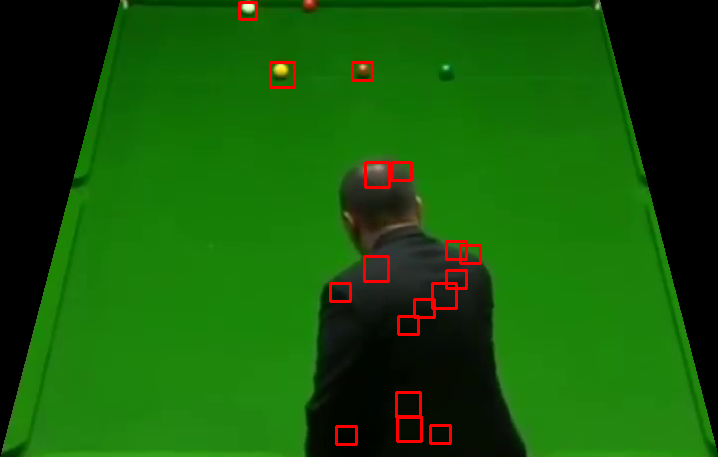

{'white': 1, 'red': 1, 'blue': 1, 'pink': 1, 'dark_green': 0, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 5, 'blue': 0, 'pink': 0, 'dark_green': 0, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
0 4 False
blue black False
7


green red black
89964000.0 43482600.0 14779800.0


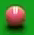

green pink white
215449500.0 44303700.0 20027700.0


green red black
95104800.0 41340600.0 12423600.0


green red black
98103600.0 38770200.0 10924200.0


green blue dark_green
100031400.0 32558400.0 24847200.0


green dark_green white
116953200.0 25704000.0 5355000.0


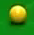

green yellow brown
261877350.0 53710650.0 12138000.0


green brown white
112455000.0 38127600.0 4498200.0


green black dark_green
78075900.0 28070145.0 2974320.0


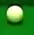

green white yellow
203614950.0 54924450.0 4855200.0


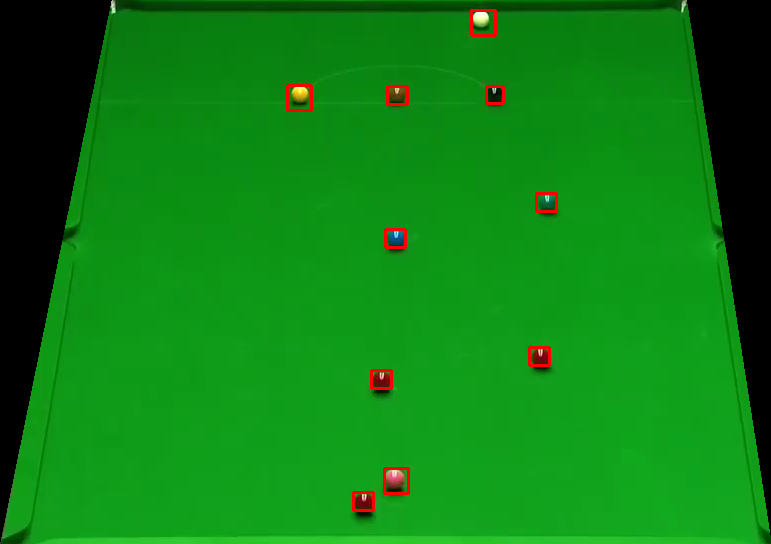

green red black
88036200.0 43054200.0 16707600.0


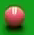

green pink white
215752950.0 44910600.0 19117350.0


green red black
99817200.0 38127600.0 10495800.0


green blue dark_green
98103600.0 32986800.0 21848400.0


green dark_green white
116953200.0 26132400.0 4926600.0


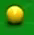

green yellow brown
260663550.0 53103750.0 12441450.0


green black dark_green
78261795.0 28627830.0 3532005.0


green brown white
113526000.0 36842400.0 4498200.0


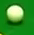

green white yellow
267036000.0 57655500.0 4551750.0


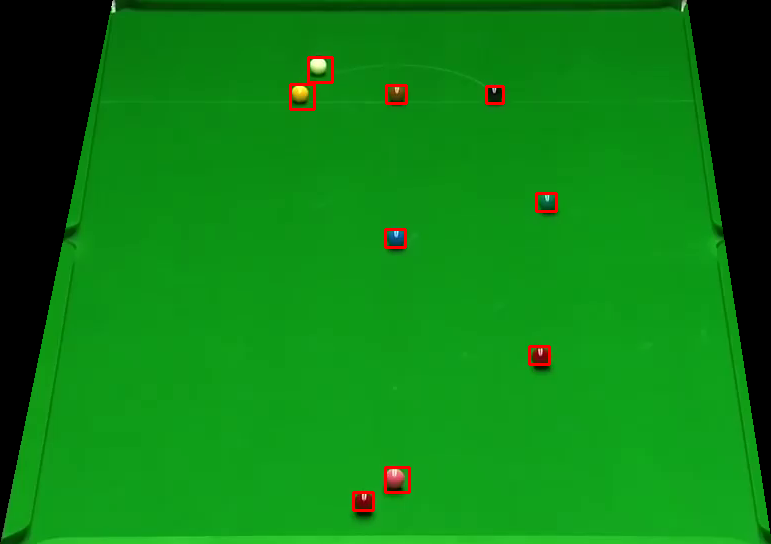

{'white': 1, 'red': 3, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 2, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
3 3 True
red red True
8


green pink red
97461000.0 18421200.0 11352600.0


green red black
114696450.0 29284200.0 14198400.0


green blue dark_green
115025400.0 19706400.0 8568000.0


green dark_green white
97966665.0 19147185.0 3160215.0


green yellow white
57999240.0 23236875.0 20820240.0


green white yellow
63390195.0 29185515.0 17474130.0


green black dark_green
87370650.0 22865085.0 2602530.0


brown white black
21205800.0 4755240.0 2313360.0


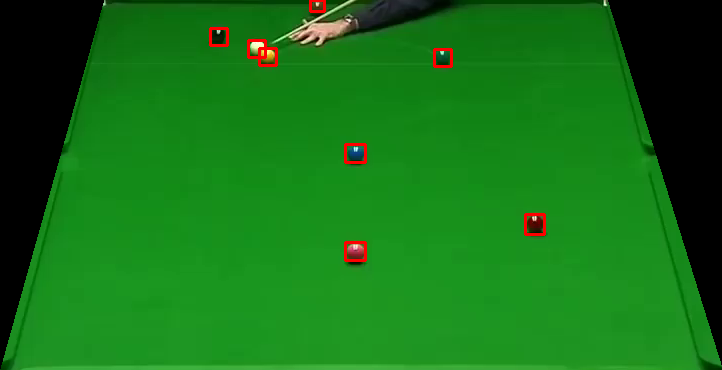

green pink brown
98746200.0 19063800.0 11995200.0


green blue dark_green
113097600.0 18849600.0 8568000.0


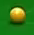

green yellow brown
274925700.0 31558800.0 23365650.0


green dark_green white
96851295.0 19704870.0 3160215.0


green black white
86627070.0 21006135.0 2044845.0


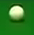

green white brown
258539400.0 43393350.0 4551750.0


brown green red
19792080.0 7454160.0 3084480.0


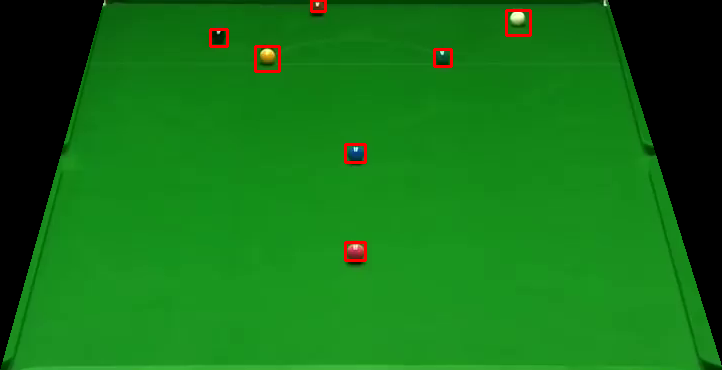

{'white': 1, 'red': 1, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 0, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
YES YES True
5 5 True
red red True
9


green black yellow
90606600.0 26989200.0 0.0


green black white
91463400.0 56334600.0 4069800.0


green red black
74113200.0 46053000.0 21848400.0


green red black
77968800.0 44553600.0 18849600.0


green red black
80753400.0 44767800.0 16921800.0


green red black
80110800.0 43268400.0 21420000.0


red green black
30073680.0 11181240.0 7968240.0


green red black
65973600.0 42411600.0 25704000.0


green red black
76683600.0 42411600.0 17136000.0


red green pink
36114120.0 9510480.0 6040440.0


red green pink
21591360.0 20049120.0 7068600.0


green red black
86965200.0 38984400.0 18207000.0


green red black
82038600.0 39841200.0 16065000.0


green red black
82895400.0 40698000.0 17992800.0


green red black
82038600.0 41769000.0 16279200.0


green red brown
85465800.0 38984400.0 15850800.0


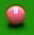

green pink brown
225159900.0 42483000.0 24882900.0


green blue dark_green
98746200.0 28917000.0 8353800.0


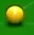

green yellow brown
244884150.0 57958950.0 15779400.0


green brown black
108385200.0 37270800.0 6211800.0


green dark_green white
123379200.0 16707600.0 5783400.0


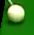

green white black
196939050.0 63117600.0 25793250.0


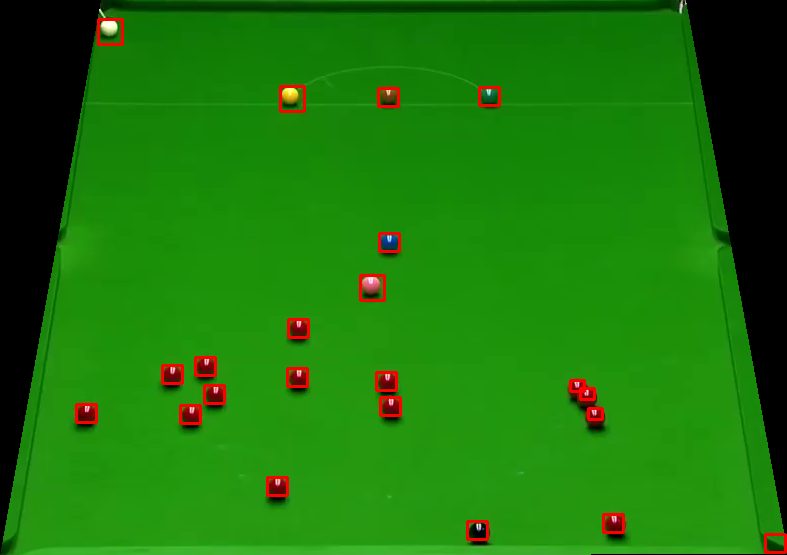

green black white
93391200.0 54835200.0 4069800.0


green red black
75398400.0 47552400.0 17992800.0


green red black
76041000.0 44553600.0 17564400.0


green red black
80325000.0 42411600.0 18635400.0


green red black
75612600.0 44982000.0 20349000.0


red green black
31101840.0 10538640.0 7454160.0


green red black
78825600.0 40698000.0 16921800.0


green red black
76255200.0 41554800.0 16279200.0


red green pink
37102500.0 7012500.0 5100000.0


red green pink
22057500.0 17212500.0 6630000.0


green red brown
76897800.0 41554800.0 16279200.0


green red black
82252800.0 40055400.0 18207000.0


green red black
82038600.0 42411600.0 15422400.0


green red brown
82038600.0 37699200.0 15422400.0


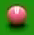

green pink brown
217877100.0 42179550.0 23365650.0


green blue dark_green
95319000.0 30630600.0 9424800.0


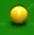

green yellow brown
253684200.0 54014100.0 15475950.0


green brown black
106671600.0 36414000.0 6426000.0


green dark_green white
122950800.0 18849600.0 5569200.0


white green brown
44800695.0 39223845.0 3532005.0


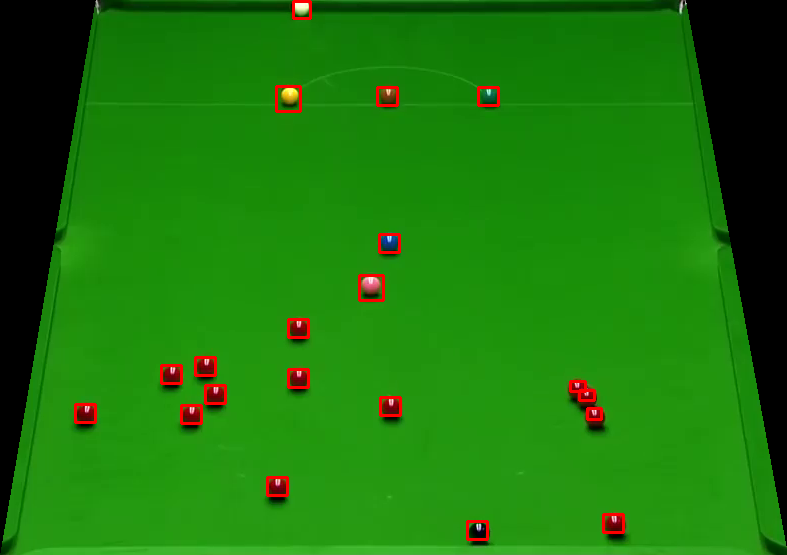

{'white': 1, 'red': 14, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 13, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
4 4 True
red red True
10


green black brown
88464600.0 19706400.0 1071000.0


green red black
83859300.0 41707800.0 27509400.0


red black green
55692000.0 50979600.0 41340600.0


black red green
32515560.0 16964640.0 4626720.0


green red brown
21462840.0 19920600.0 5397840.0


green red black
89964000.0 36842400.0 22491000.0


green red black
94064400.0 39045600.0 22406850.0


green red black
95617350.0 37936350.0 21297600.0


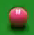

green pink brown
225463350.0 43393350.0 16689750.0


green red black
96504750.0 36605250.0 19079100.0


green red black
96061050.0 35052300.0 21075750.0


green blue dark_green
99603000.0 26989200.0 8568000.0


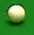

green white yellow
254898000.0 53407200.0 10317300.0


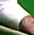

white green pink
171145800.0 38841600.0 26703600.0


green red brown
112240800.0 27631800.0 17778600.0


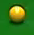

green yellow brown
259146300.0 39448500.0 25186350.0


green brown black
118666800.0 37913400.0 3855600.0


dark_green green blue
9124920.0 8225280.0 1670760.0


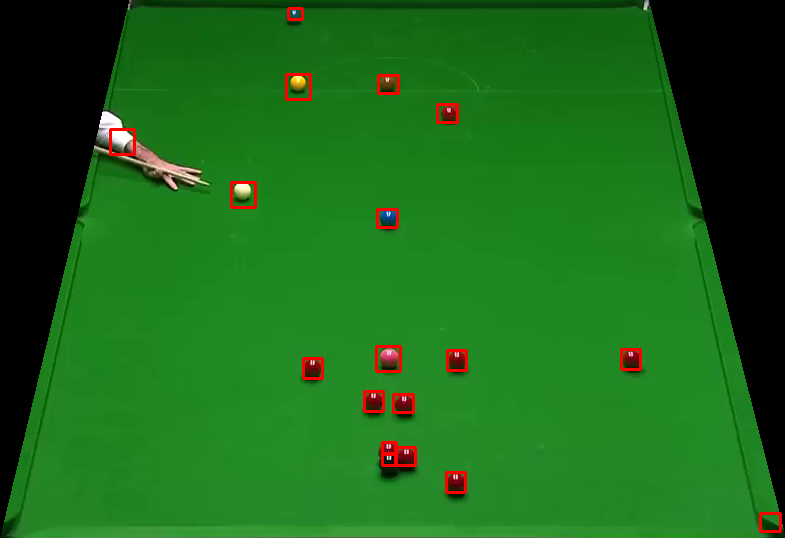

green black brown
84180600.0 17136000.0 1071000.0


green red black
87630750.0 40598550.0 27065700.0


red black green
54192600.0 50122800.0 37913400.0


black red green
32772600.0 15679440.0 3984120.0


green red brown
20527500.0 20017500.0 5865000.0


green red black
92511450.0 38158200.0 25069050.0


green red black
94064400.0 40820400.0 24181650.0


green red black
91624050.0 37492650.0 22406850.0


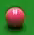

green pink brown
222428850.0 44607150.0 16689750.0


green red black
92067750.0 42817050.0 16416900.0


green red black
93398850.0 40376700.0 21963150.0


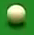

green white brown
237297900.0 60993450.0 11834550.0


green red brown
109670400.0 24633000.0 16493400.0


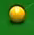

green yellow brown
261270450.0 37627800.0 24276000.0


green brown black
117595800.0 35985600.0 4712400.0


dark_green green white
8867880.0 8482320.0 1670760.0


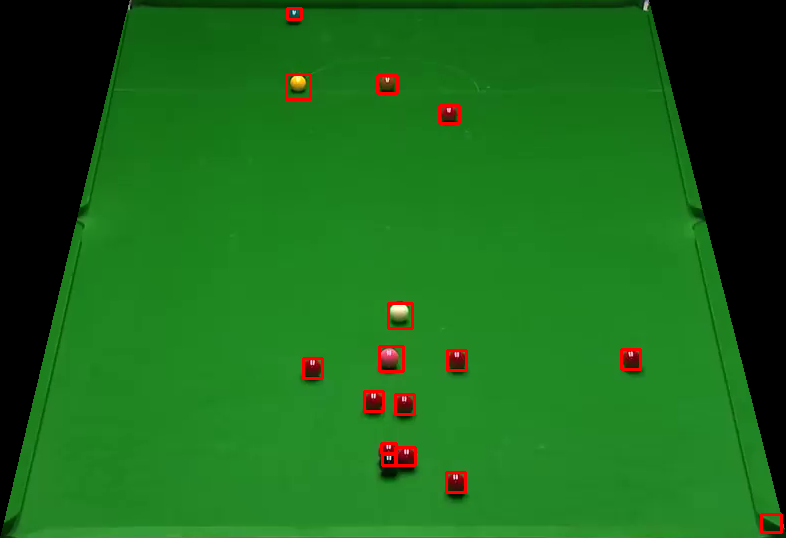

{'white': 1, 'red': 9, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 9, 'blue': 0, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
6 6 True
blue blue True
11


green yellow red
71114400.0 31915800.0 25275600.0


green red yellow
93177000.0 29506050.0 23737950.0


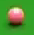

green pink yellow
237601350.0 32469150.0 30648450.0


green black white
141762150.0 7099200.0 3549600.0


green red yellow
119095200.0 16921800.0 15208200.0


green brown yellow
135588600.0 23562000.0 7925400.0


green yellow brown
94992345.0 19890765.0 7064010.0


green blue dark_green
136445400.0 19492200.0 9424800.0


green dark_green white
159364800.0 10281600.0 4926600.0


green white brown
84396330.0 24166350.0 10410120.0


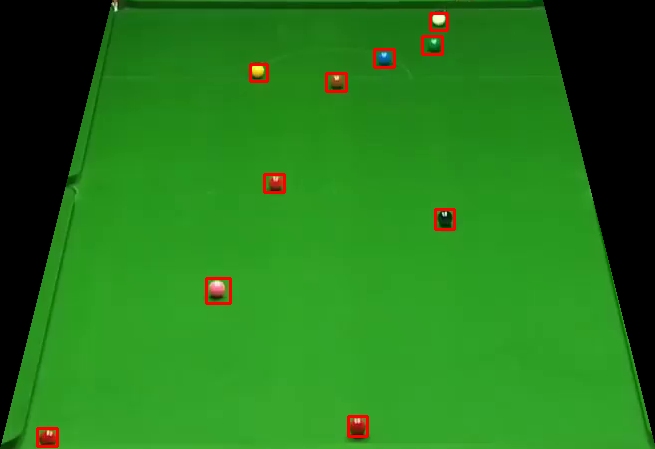

green red yellow
92067750.0 27065700.0 24181650.0


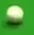

green white yellow
241546200.0 60690000.0 11834550.0


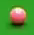

green pink yellow
238208250.0 31862250.0 29131200.0


green black white
142427700.0 8652150.0 3771450.0


green red brown
119952000.0 16707600.0 13280400.0


green brown yellow
133875000.0 22276800.0 8353800.0


green yellow brown
93505185.0 21935610.0 8179380.0


green blue dark_green
135588600.0 16921800.0 7282800.0


green dark_green white
160007400.0 9424800.0 4284000.0


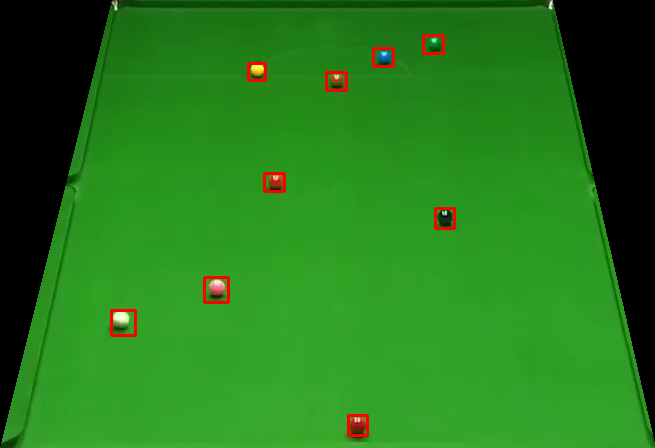

{'white': 1, 'red': 3, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 2, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
3 3 True
red red True
12


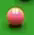

green yellow pink
174483750.0 36110550.0 35200200.0


green black yellow
89627400.0 25512750.0 5989950.0


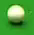

green white yellow
253987650.0 60083100.0 16082850.0


red pink white
74327400.0 33201000.0 12209400.0


red green pink
60832800.0 30630600.0 24204600.0


green red pink
65759400.0 42840000.0 14137200.0


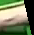

white black brown
138676650.0 75559050.0 25793250.0


pink red green
16579080.0 15807960.0 9896040.0


red green yellow
15550920.0 12337920.0 11052720.0


green yellow red
19792080.0 12080880.0 10667160.0


green red yellow
106885800.0 19492200.0 17564400.0


green red yellow
102816000.0 17136000.0 16065000.0


green blue white
125521200.0 21420000.0 4926600.0


green dark_green white
157651200.0 9853200.0 4498200.0


green brown yellow
134089200.0 25704000.0 7497000.0


green yellow brown
94248765.0 19518975.0 6692220.0


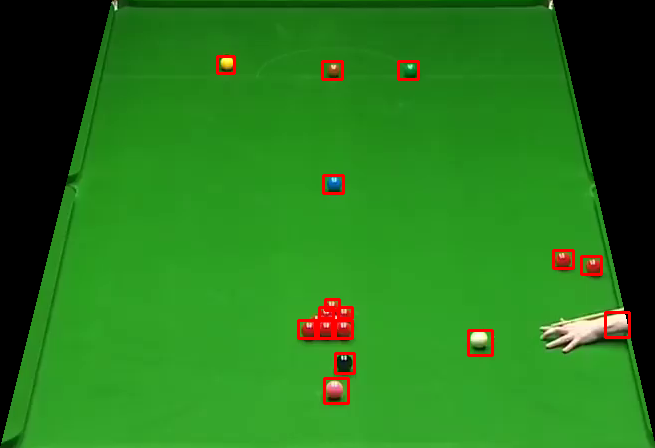

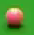

green yellow pink
182070000.0 35807100.0 32165700.0


green red brown
53550000.0 43054200.0 24847200.0


red green brown
49051800.0 39841200.0 21848400.0


green red yellow
49480200.0 42197400.0 25275600.0


red yellow green
21719880.0 9639000.0 8996400.0


green red yellow
82467000.0 28060200.0 23990400.0


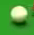

green white yellow
231532350.0 58565850.0 24579450.0


red yellow green
18378360.0 11309760.0 11309760.0


green yellow red
83966400.0 26775000.0 24633000.0


green yellow red
83752200.0 26989200.0 18849600.0


green red yellow
108813600.0 18849600.0 14994000.0


green red yellow
107100000.0 16707600.0 15636600.0


green blue dark_green
125521200.0 20777400.0 4712400.0


green brown yellow
135802800.0 25275600.0 4498200.0


green dark_green white
159150600.0 10281600.0 4926600.0


green yellow brown
92018025.0 21563820.0 7807590.0


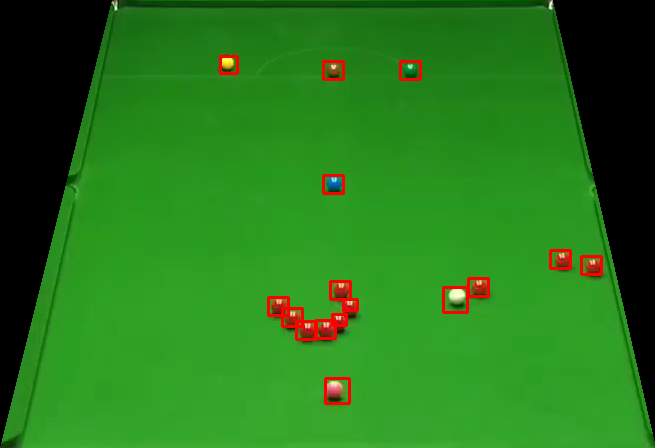

{'white': 1, 'red': 8, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 10, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 0}
YES YES True
3 3 True
black black True
13


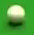

green white yellow
233353050.0 61600350.0 19724250.0


green black white
103825800.0 22185000.0 3549600.0


white brown black
84823200.0 17992800.0 14137200.0


green red yellow
68758200.0 35557200.0 18421200.0


red pink green
18635400.0 9381960.0 8482320.0


green red yellow
101102400.0 20991600.0 19920600.0


red green yellow
15807960.0 8996400.0 8867880.0


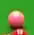

green pink yellow
197545950.0 47641650.0 39145050.0


green blue dark_green
125949600.0 22705200.0 5569200.0


green yellow brown
92761605.0 19704870.0 7249905.0


green dark_green white
159793200.0 13280400.0 4926600.0


green brown yellow
133660800.0 24847200.0 6640200.0


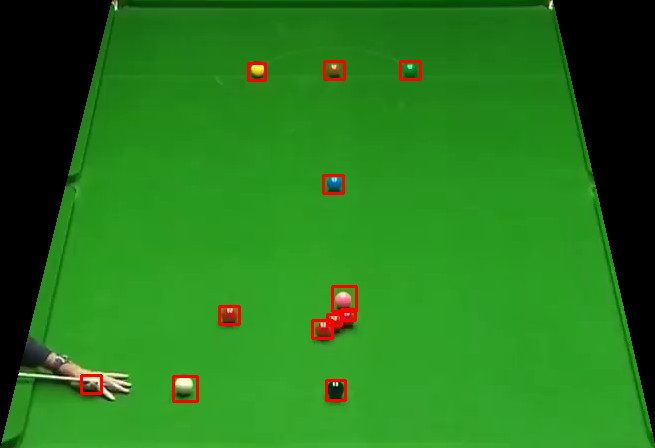

green black white
90736650.0 20188350.0 3771450.0


green red yellow
68972400.0 36199800.0 17564400.0


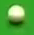

green white yellow
206346000.0 60083100.0 30648450.0


red pink green
19535040.0 10924200.0 8739360.0


green red yellow
102601800.0 23133600.0 19492200.0


red pink green
14908320.0 10795680.0 10153080.0


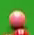

green pink yellow
200883900.0 48552000.0 40358850.0


green blue white
125307000.0 23347800.0 4926600.0


green yellow brown
91646235.0 20076660.0 7064010.0


green dark_green white
157865400.0 11995200.0 4926600.0


green brown yellow
132161400.0 24418800.0 7497000.0


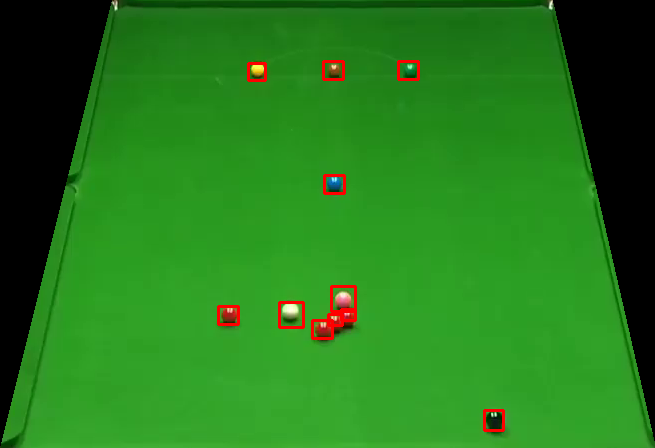

{'white': 1, 'red': 4, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 4, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
14


green black white
100276200.0 23294250.0 4215150.0


green yellow red
82306350.0 35717850.0 26178300.0


green red yellow
98279550.0 26178300.0 24181650.0


green yellow red
46695600.0 37270800.0 25275600.0


green red yellow
97889400.0 23133600.0 22491000.0


green red yellow
58476600.0 44767800.0 18635400.0


red pink black
74755800.0 34057800.0 13708800.0


red pink green
68329800.0 23562000.0 23562000.0


green red yellow
105378750.0 24181650.0 23294250.0


red pink white
18506880.0 17992800.0 8867880.0


red pink yellow
19535040.0 11566800.0 8610840.0


green red yellow
101745000.0 25489800.0 21205800.0


pink red green
21719880.0 12980520.0 8739360.0


green pink white
20820240.0 14265720.0 12594960.0


green red yellow
104743800.0 20991600.0 17778600.0


green blue white
125949600.0 20134800.0 5140800.0


green yellow brown
90159075.0 21749715.0 6506325.0


green brown yellow
132375600.0 23133600.0 7282800.0


green dark_green white
160007400.0 11138400.0 4498200.0


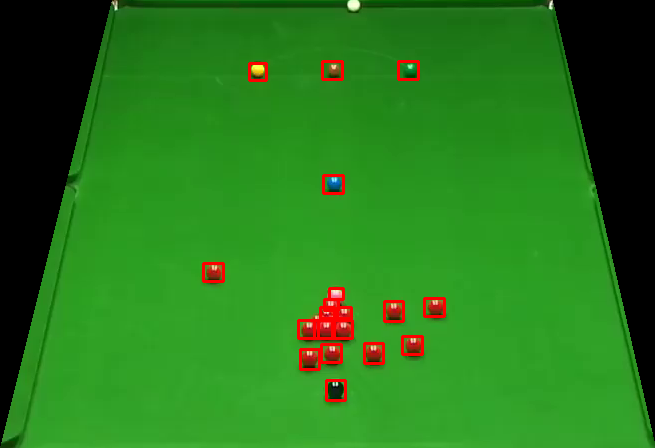

green black yellow
84746700.0 28396800.0 4437000.0


green yellow red
78091200.0 31280850.0 24625350.0


green red yellow
80110800.0 27631800.0 23776200.0


green yellow red
54575100.0 31280850.0 25734600.0


green yellow red
98501400.0 27509400.0 26400150.0


green red yellow
93391200.0 24847200.0 18421200.0


red pink white
76897800.0 35557200.0 11352600.0


green red pink
58690800.0 45196200.0 16065000.0


red green pink
67473000.0 25704000.0 23990400.0


green red yellow
107375400.0 23516100.0 21519450.0


red pink yellow
17478720.0 12980520.0 9510480.0


pink red white
20563200.0 15550920.0 7968240.0


green yellow red
98960400.0 21848400.0 19920600.0


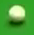

green white yellow
226070250.0 58869300.0 16082850.0


pink red white
25832520.0 10281600.0 7968240.0


green pink white
19278000.0 16065000.0 12466440.0


green blue white
126806400.0 23990400.0 5140800.0


green yellow brown
90716760.0 21563820.0 7435800.0


green brown yellow
130662000.0 23776200.0 9639000.0


green dark_green white
158293800.0 13066200.0 4498200.0


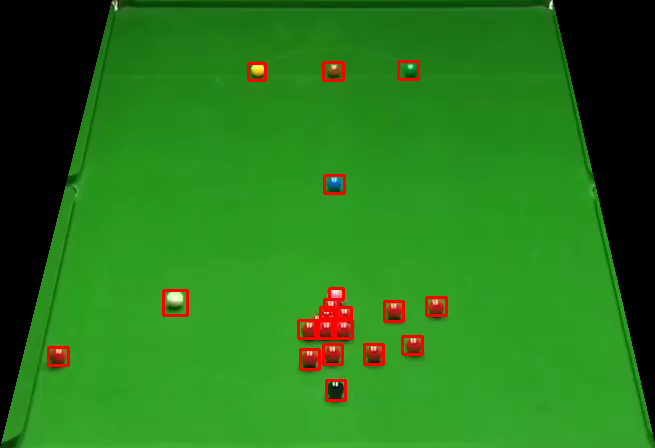

{'white': 1, 'red': 13, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 13, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
15


green black white
103825800.0 15751350.0 3549600.0


green red yellow
91249200.0 25275600.0 20991600.0


green yellow red
92320200.0 24418800.0 23990400.0


green red yellow
100031400.0 24847200.0 17992800.0


green yellow red
97032600.0 23133600.0 19492200.0


green red brown
88678800.0 22705200.0 22491000.0


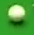

green white yellow
244580700.0 58565850.0 16993200.0


green red yellow
79039800.0 34057800.0 24633000.0


green yellow red
60832800.0 33629400.0 27417600.0


red yellow pink
14008680.0 12466440.0 10924200.0


green yellow red
101530800.0 22705200.0 18207000.0


green pink yellow
53723655.0 27884250.0 19890765.0


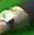

white brown green
79503900.0 40662300.0 30951900.0


green red brown
111598200.0 18207000.0 15208200.0


green blue dark_green
125735400.0 20991600.0 8568000.0


green brown yellow
131733000.0 22919400.0 10924200.0


green yellow brown
92203920.0 18961290.0 7064010.0


green dark_green white
161292600.0 9210600.0 4926600.0


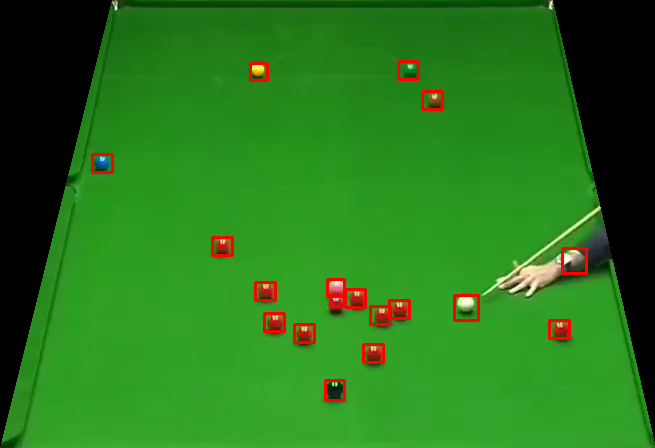

green black white
100054350.0 24403500.0 5324400.0


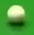

green white yellow
215146050.0 62207250.0 16082850.0


green red yellow
93605400.0 23347800.0 22062600.0


green red yellow
99817200.0 23562000.0 17992800.0


green red yellow
96818400.0 23990400.0 20134800.0


green red yellow
90606600.0 23133600.0 22491000.0


green red yellow
74113200.0 32772600.0 24847200.0


green yellow red
68972400.0 32558400.0 25918200.0


red green pink
14265720.0 12852000.0 11566800.0


green red yellow
102387600.0 21848400.0 20349000.0


green pink yellow
51678810.0 28627830.0 24166350.0


green red yellow
108813600.0 16921800.0 15636600.0


green blue dark_green
127234800.0 19063800.0 4926600.0


green brown yellow
133660800.0 21848400.0 8568000.0


green yellow brown
92947500.0 18403605.0 6878115.0


green dark_green white
159364800.0 8782200.0 4712400.0


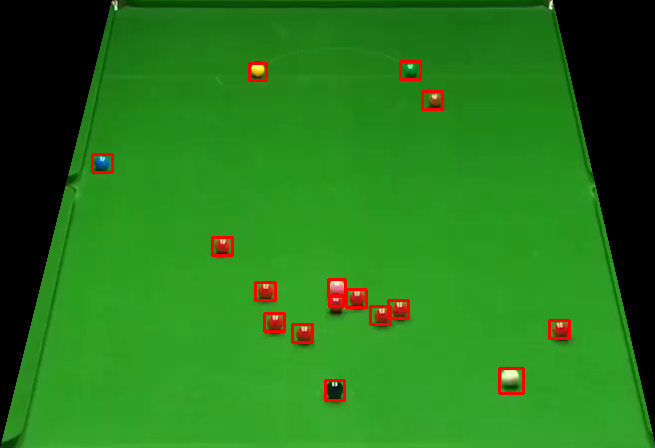

{'white': 1, 'red': 10, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 9, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
3 3 True
red red True
16


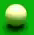

green white yellow
224249550.0 72828000.0 13958700.0


green black white
100719900.0 65889450.0 3993300.0


green red black
86751000.0 35343000.0 16493400.0


red black pink
88893000.0 23133600.0 14994000.0


red pink white
40545000.0 7777500.0 4845000.0


red pink white
45496080.0 6168960.0 2955960.0


green red pink
71328600.0 64474200.0 8996400.0


red green pink
32258520.0 13751640.0 4369680.0


red pink white
36371160.0 10667160.0 6683040.0


red green pink
26475120.0 10024560.0 8610840.0


red green pink
31237500.0 9945000.0 7522500.0


green red black
77326200.0 41554800.0 28060200.0


green red black
95533200.0 33415200.0 11566800.0


red green pink
48409200.0 47552400.0 32558400.0


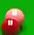

green red white
198759750.0 52496850.0 40055400.0


green red black
95104800.0 39412800.0 11138400.0


green red black
100888200.0 35557200.0 10281600.0


green blue dark_green
113311800.0 21634200.0 10067400.0


green red brown
117167400.0 26989200.0 12423600.0


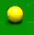

green yellow brown
278870550.0 53407200.0 4248300.0


green dark_green white
139015800.0 16707600.0 3213000.0


green brown yellow
127234800.0 26989200.0 8568000.0


green black white
25061400.0 18506880.0 6554520.0


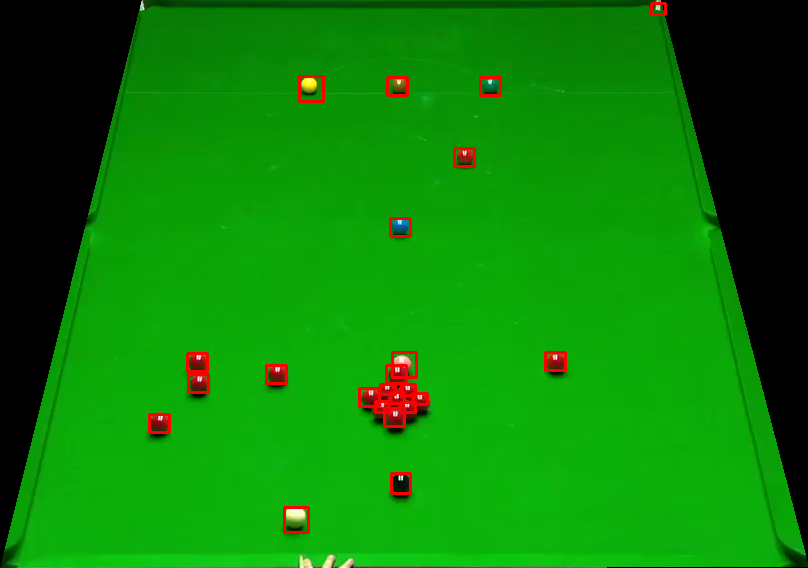

green red black
80753400.0 41126400.0 21205800.0


green black white
102938400.0 60565050.0 3771450.0


red black pink
92106000.0 25704000.0 16921800.0


red pink white
40740840.0 8610840.0 4498200.0


red pink white
45239040.0 7454160.0 2698920.0


red green pink
80325000.0 45410400.0 13923000.0


red green pink
67901400.0 64688400.0 10495800.0


red pink white
37867500.0 11347500.0 5865000.0


red green pink
27760320.0 10667160.0 8739360.0


red green pink
31620000.0 9690000.0 7395000.0


green red black
74970000.0 40269600.0 28917000.0


red green pink
49694400.0 46909800.0 31059000.0


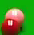

green red white
200580450.0 53710650.0 38538150.0


green red black
94462200.0 40698000.0 11352600.0


green red black
99388800.0 36628200.0 11138400.0


green blue dark_green
114597000.0 19492200.0 8568000.0


green red brown
115882200.0 25489800.0 8996400.0


green red brown
117381600.0 28488600.0 12637800.0


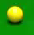

green yellow white
276746400.0 53710650.0 5158650.0


green brown yellow
126163800.0 27417600.0 9853200.0


green dark_green white
141586200.0 15636600.0 3641400.0


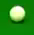

green white yellow
289794750.0 51889950.0 3641400.0


green black white
27374760.0 17864280.0 6297480.0


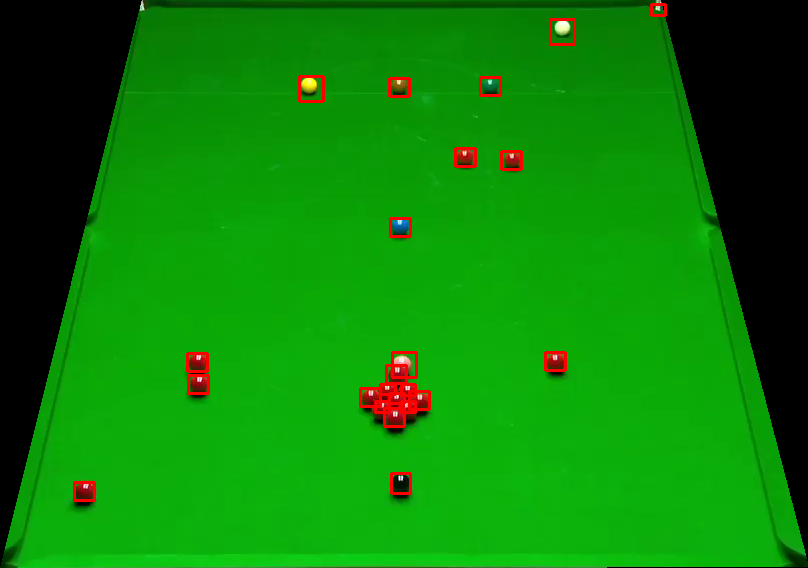

{'white': 1, 'red': 15, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 16, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
17


green black white
102938400.0 64336500.0 4437000.0


red green black
67258800.0 54192600.0 16707600.0


red green pink
83966400.0 40269600.0 14565600.0


green red pink
66830400.0 49480200.0 15636600.0


green red black
61261200.0 60618600.0 16493400.0


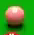

green white pink
216663300.0 39145050.0 37324350.0


green red black
97675200.0 34914600.0 11995200.0


green red pink
23077500.0 16830000.0 6247500.0


green red black
94676400.0 34057800.0 10281600.0


green red black
103030200.0 33843600.0 8996400.0


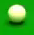

green white yellow
266429100.0 61903800.0 10620750.0


green blue dark_green
113526000.0 21848400.0 8782200.0


white green black
93819600.0 12637800.0 12423600.0


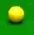

green yellow white
276746400.0 56745150.0 5158650.0


green brown yellow
127449000.0 25918200.0 10495800.0


green dark_green white
143299800.0 19492200.0 3427200.0


green black white
27503280.0 17864280.0 6811560.0


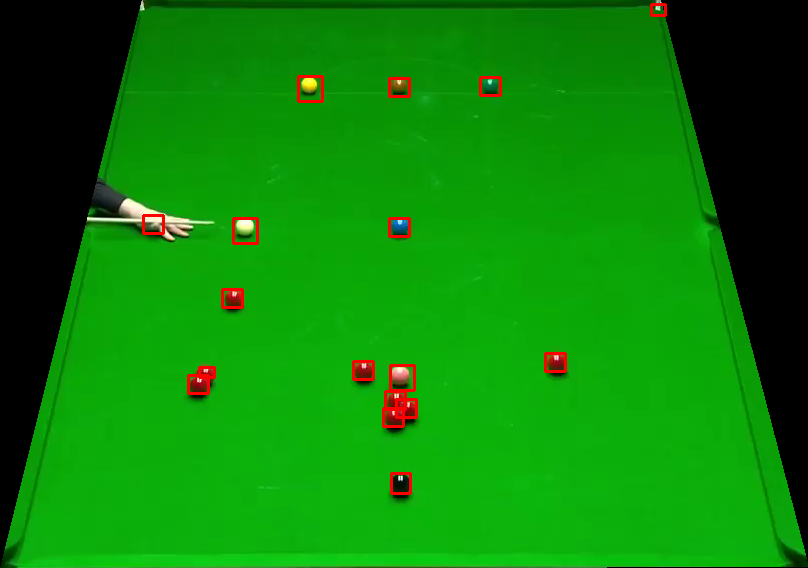

green black dark_green
98960400.0 19706400.0 856800.0


green black white
102494700.0 63670950.0 4437000.0


red green black
68758200.0 53550000.0 19063800.0


red green pink
82681200.0 38127600.0 12637800.0


green red pink
65545200.0 49480200.0 14137200.0


red green black
64045800.0 64045800.0 16279200.0


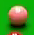

green pink white
214235700.0 40055400.0 36717450.0


green red black
95533200.0 36842400.0 12209400.0


green red pink
23776200.0 19149480.0 6040440.0


green red black
97461000.0 36628200.0 11352600.0


green red black
103887000.0 32558400.0 9424800.0


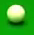

green white yellow
267946350.0 61600350.0 7586250.0


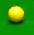

green yellow white
278567100.0 56138250.0 4248300.0


green brown yellow
129162600.0 23133600.0 9639000.0


green dark_green white
142014600.0 14565600.0 3641400.0


green black white
24932880.0 18506880.0 7068600.0


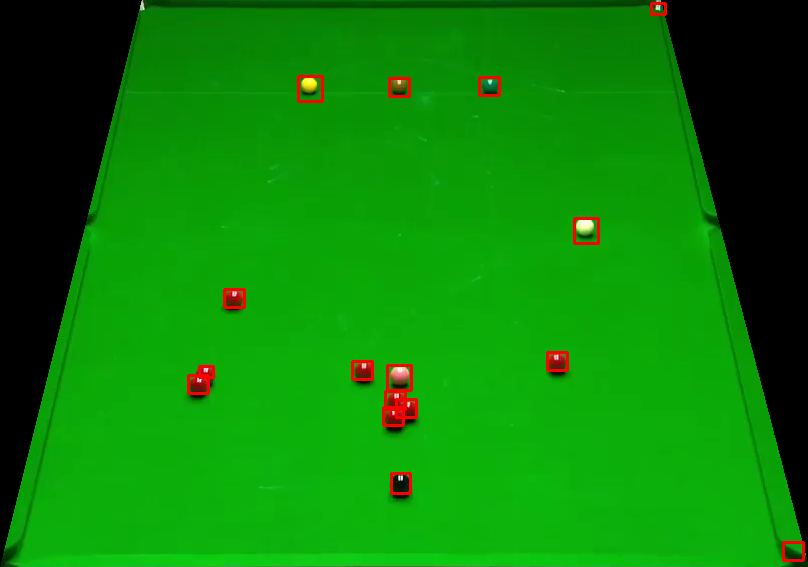

{'white': 1, 'red': 8, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 8, 'blue': 0, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
6 6 True
blue blue True
18


green black yellow
78397200.0 47980800.0 0.0


green red brown
103672800.0 38984400.0 15422400.0


green red brown
96390000.0 39198600.0 14565600.0


green black white
96061050.0 69439050.0 3549600.0


green red black
84394800.0 43911000.0 24847200.0


green red black
60404400.0 53121600.0 31273200.0


green red black
80110800.0 47766600.0 14994000.0


green red black
73256400.0 47338200.0 25061400.0


green red black
93177000.0 41126400.0 18421200.0


green red black
78183000.0 44339400.0 22491000.0


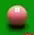

green pink white
206346000.0 33986400.0 33076050.0


green blue dark_green
94890600.0 34272000.0 8996400.0


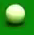

green white yellow
248222100.0 69186600.0 8496600.0


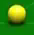

green yellow brown
247311750.0 57352050.0 12441450.0


green brown yellow
106671600.0 36414000.0 7068600.0


green dark_green black
119309400.0 24847200.0 4284000.0


green black white
18506880.0 15422400.0 7582680.0


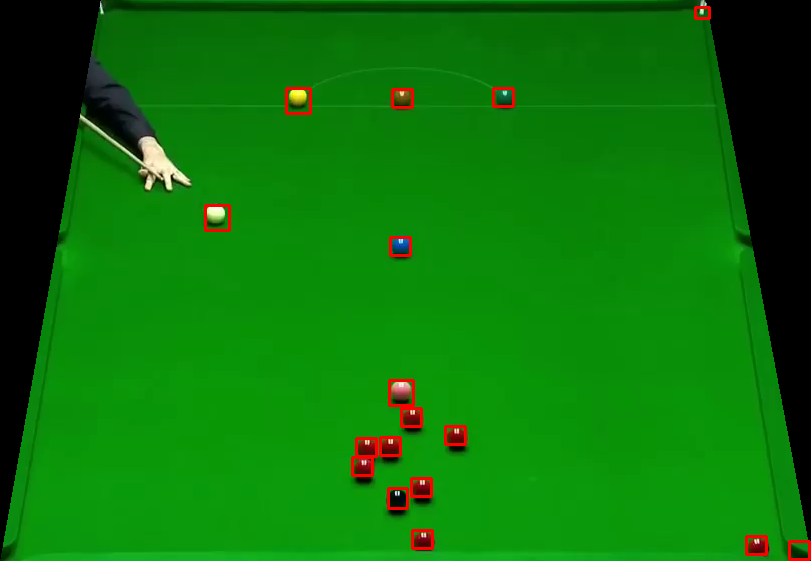

green black yellow
86108400.0 43696800.0 0.0


green red brown
96604200.0 38341800.0 13494600.0


green black white
94729950.0 69660900.0 3549600.0


green red black
82252800.0 40055400.0 25918200.0


green red black
61475400.0 55477800.0 34272000.0


green red black
86965200.0 49480200.0 16707600.0


green red black
70043400.0 48837600.0 23776200.0


green red black
93842550.0 43260750.0 24181650.0


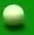

green white yellow
219697800.0 75559050.0 14869050.0


green red black
79896600.0 39198600.0 22491000.0


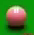

green pink white
209987400.0 37627800.0 33682950.0


green blue dark_green
94462200.0 30416400.0 9210600.0


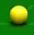

green yellow brown
250042800.0 56138250.0 14262150.0


green brown yellow
106885800.0 36628200.0 8568000.0


green dark_green white
118452600.0 21848400.0 3641400.0


green black white
17607240.0 15550920.0 7197120.0


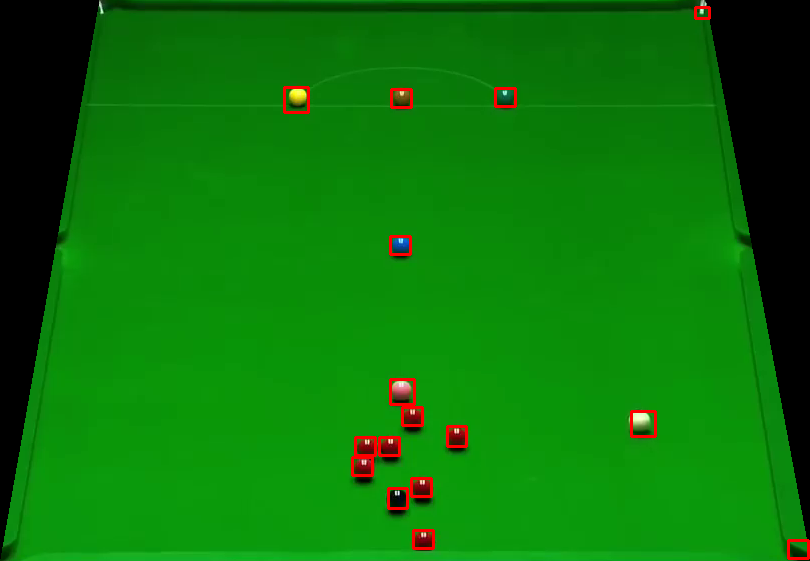

{'white': 1, 'red': 8, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 7, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
4 4 True
red red True
19


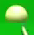

green white yellow
244884150.0 82841850.0 20331150.0


green black white
100719900.0 64336500.0 4880700.0


red green black
60404400.0 55049400.0 19063800.0


red green pink
77326200.0 37913400.0 14779800.0


green red pink
80753400.0 44982000.0 14565600.0


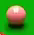

green pink white
230015100.0 34896750.0 34896750.0


green red black
93819600.0 36199800.0 14351400.0


green red black
97461000.0 37270800.0 13066200.0


green red black
100245600.0 35985600.0 11138400.0


green red black
103672800.0 36199800.0 9210600.0


green blue dark_green
113526000.0 18635400.0 7068600.0


green red brown
119309400.0 27203400.0 11995200.0


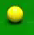

green yellow brown
279477450.0 53710650.0 3944850.0


green dark_green white
138801600.0 13923000.0 3641400.0


green brown yellow
127877400.0 24847200.0 8996400.0


green black white
24804360.0 18506880.0 6683040.0


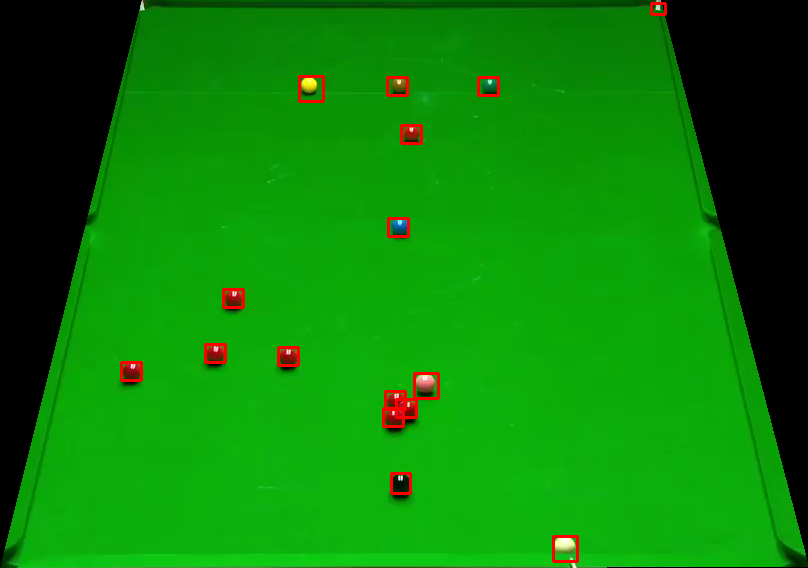

green black dark_green
92320200.0 25704000.0 2998800.0


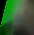

green black dark_green
73738350.0 44303700.0 6979350.0


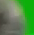

green white yellow
103476450.0 64331400.0 2427600.0


white black yellow
7497000.0 0.0 0.0


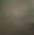

black yellow brown
0.0 0.0 0.0


green black white
100941750.0 65223900.0 4215150.0


red green black
68115600.0 53764200.0 16065000.0


red green white
83752200.0 38770200.0 12423600.0


green red white
78397200.0 50337000.0 11995200.0


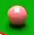

green pink white
228194400.0 37931250.0 33986400.0


green red black
97246800.0 39412800.0 13494600.0


green red black
97461000.0 37056600.0 12852000.0


green red black
99174600.0 35771400.0 13066200.0


green red brown
100674000.0 35128800.0 9424800.0


green red black
101530800.0 33843600.0 10281600.0


green blue dark_green
111384000.0 21205800.0 5997600.0


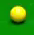

green yellow white
278263650.0 53710650.0 6372450.0


green dark_green white
140515200.0 14994000.0 3641400.0


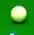

green white dark_green
281601600.0 53103750.0 4248300.0


green brown yellow
130019400.0 24204600.0 8996400.0


green black white
23904720.0 18506880.0 6554520.0


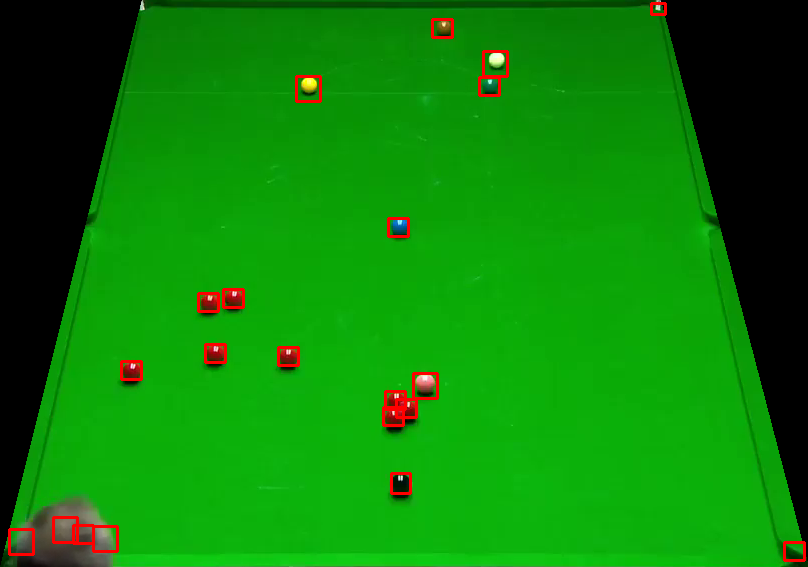

{'white': 1, 'red': 8, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 8, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
20


green black dark_green
83109600.0 45410400.0 214200.0


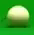

green white dark_green
255504900.0 69490050.0 23365650.0


green black white
96282900.0 71435700.0 3327750.0


green red black
86322600.0 42411600.0 19063800.0


red black brown
27157500.0 9180000.0 5355000.0


red green black
76683600.0 36628200.0 24204600.0


red green black
65331000.0 57619800.0 21205800.0


red black green
78825600.0 32344200.0 16493400.0


green red black
88464600.0 40269600.0 20991600.0


red black pink
109242000.0 23562000.0 12423600.0


red black pink
34571880.0 8225280.0 3984120.0


red green pink
33672240.0 6168960.0 5911920.0


red green pink
27795000.0 9690000.0 7012500.0


red green brown
71757000.0 52050600.0 15422400.0


green red black
76041000.0 56763000.0 19492200.0


red green pink
31615920.0 8996400.0 7197120.0


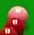

green red pink
170842350.0 55531350.0 47945100.0


green red brown
98103600.0 39198600.0 13708800.0


green blue dark_green
93605400.0 33415200.0 11566800.0


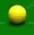

green yellow brown
250649700.0 56138250.0 13048350.0


green brown black
106029000.0 35557200.0 6640200.0


green dark_green white
117595800.0 21848400.0 3641400.0


green black white
15807960.0 15550920.0 7197120.0


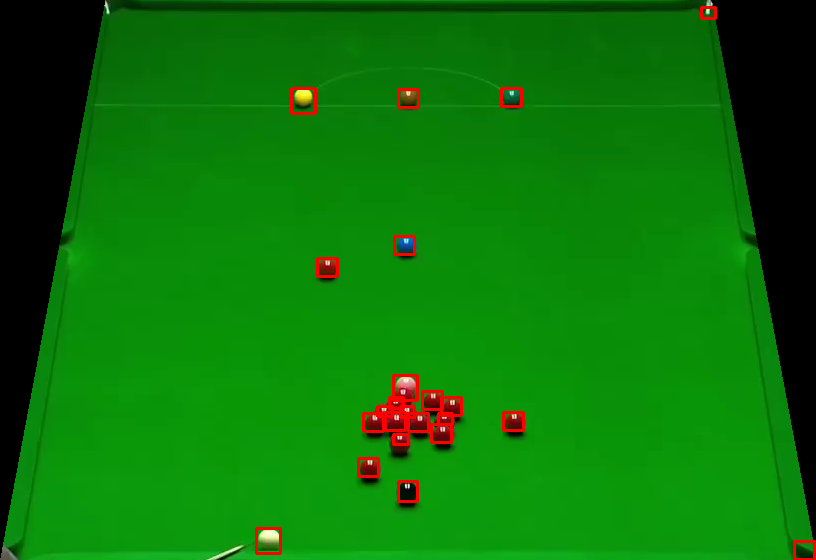

green black dark_green
80325000.0 46053000.0 1071000.0


green black white
97835850.0 66998700.0 3549600.0


green red black
85251600.0 42840000.0 17992800.0


red black brown
30330720.0 11052720.0 4241160.0


red green black
72828000.0 38556000.0 21205800.0


red green black
67258800.0 51408000.0 23562000.0


red black pink
103030200.0 27417600.0 13280400.0


red black green
77968800.0 34057800.0 18635400.0


red black brown
35728560.0 6940080.0 3084480.0


red pink green
31744440.0 7454160.0 7197120.0


red green pink
27117720.0 9896040.0 8225280.0


red green brown
71114400.0 52050600.0 17778600.0


green red brown
76255200.0 58262400.0 15850800.0


red green pink
29174040.0 11309760.0 8096760.0


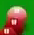

green red pink
176911350.0 57048600.0 47945100.0


green red brown
92748600.0 36628200.0 17992800.0


green red brown
89321400.0 36414000.0 19492200.0


green blue dark_green
92106000.0 32986800.0 11138400.0


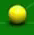

green yellow brown
246401400.0 57352050.0 12138000.0


green brown yellow
103244400.0 35343000.0 7925400.0


green dark_green white
119737800.0 21634200.0 4712400.0


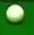

green white brown
201490800.0 67669350.0 10924200.0


green black white
16193520.0 15422400.0 7197120.0


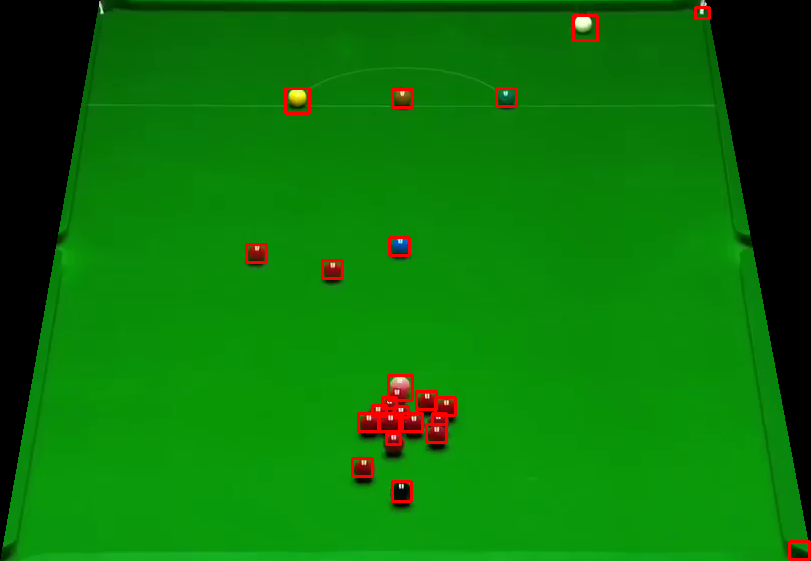

{'white': 1, 'red': 14, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 14, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
21


green black dark_green
82681200.0 45410400.0 428400.0


green red brown
96818400.0 41769000.0 13066200.0


green black white
93842550.0 69439050.0 3105900.0


green red black
82038600.0 42625800.0 25704000.0


green red black
60190200.0 55049400.0 29131200.0


green red black
88250400.0 48409200.0 13494600.0


green red black
71114400.0 45838800.0 24204600.0


green red black
91035000.0 44553600.0 17564400.0


green red black
91249200.0 40912200.0 22705200.0


green red black
60190200.0 57619800.0 31487400.0


red green black
54621000.0 47980800.0 38984400.0


red green brown
58476600.0 55906200.0 19920600.0


green red black
68544000.0 47338200.0 26989200.0


green red black
91035000.0 41983200.0 17136000.0


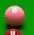

green pink white
195421800.0 39145050.0 37324350.0


green red brown
90392400.0 43054200.0 16065000.0


green red brown
94248000.0 35771400.0 16279200.0


green red brown
93391200.0 39627000.0 16707600.0


green blue black
93819600.0 35128800.0 9639000.0


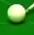

green white yellow
235780650.0 74952150.0 3641400.0


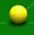

green yellow brown
249132450.0 56441700.0 11834550.0


green brown yellow
104958000.0 35557200.0 8139600.0


green dark_green white
115882200.0 16493400.0 3213000.0


black green white
15550920.0 9381960.0 7068600.0


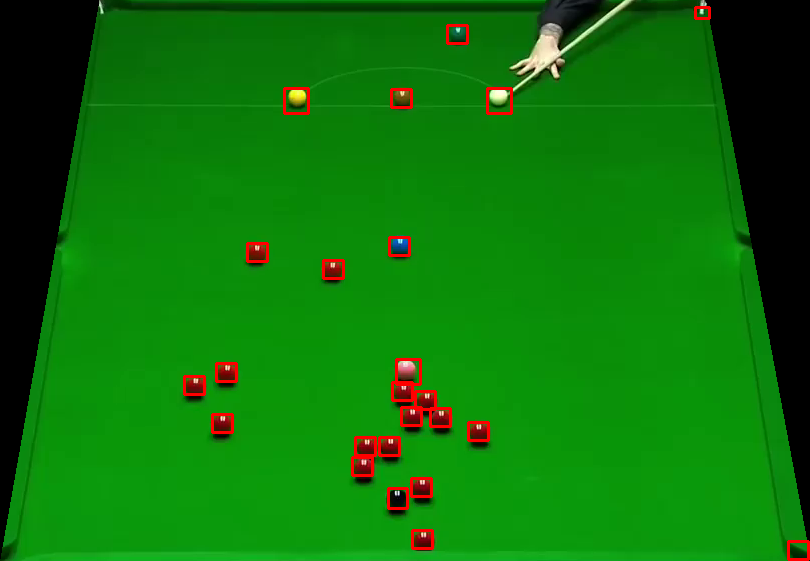

green black yellow
86322600.0 42625800.0 0.0


green red brown
98317800.0 41340600.0 12423600.0


green black white
96061050.0 68329800.0 3105900.0


green red black
83323800.0 44125200.0 25489800.0


green red black
60618600.0 55906200.0 31059000.0


green red black
70257600.0 50337000.0 23133600.0


green red black
86965200.0 50337000.0 14779800.0


green red black
91677600.0 43054200.0 18207000.0


green red black
88893000.0 42197400.0 19920600.0


green red black
60190200.0 54406800.0 30630600.0


red green black
52693200.0 47124000.0 41340600.0


green red brown
62118000.0 53121600.0 22062600.0


green red black
69186600.0 47124000.0 26560800.0


green red black
90392400.0 41983200.0 20991600.0


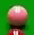

green pink white
197545950.0 39751950.0 36717450.0


green red black
91463400.0 42197400.0 15422400.0


green red brown
93605400.0 37270800.0 15422400.0


green blue black
92962800.0 34486200.0 9639000.0


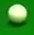

green white yellow
252470400.0 72221100.0 6069000.0


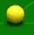

green yellow brown
251863500.0 56441700.0 10924200.0


green brown black
104743800.0 38984400.0 6640200.0


green dark_green black
113740200.0 17992800.0 4712400.0


black green white
15550920.0 15036840.0 7068600.0


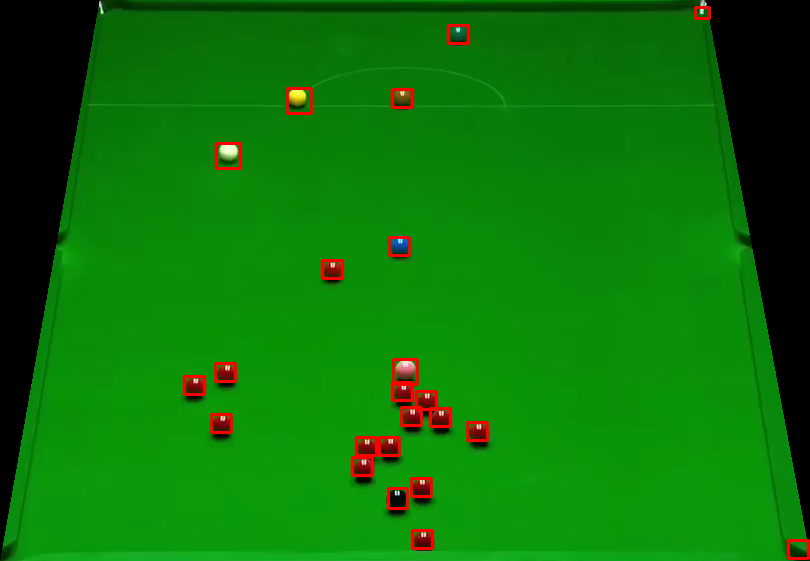

{'white': 1, 'red': 15, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 14, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
3 3 True
red red True
22


green black yellow
84180600.0 42625800.0 0.0


green red brown
28402920.0 18378360.0 7068600.0


green red brown
29688120.0 18635400.0 6940080.0


green red black
96604200.0 38127600.0 16065000.0


green black white
92289600.0 73432350.0 3549600.0


green red black
89107200.0 38341800.0 20134800.0


green red black
88036200.0 42625800.0 18635400.0


green red black
91891800.0 41554800.0 19492200.0


green red black
82971900.0 40376700.0 24847200.0


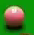

green pink white
210594300.0 36110550.0 30345000.0


green blue dark_green
93391200.0 31915800.0 7925400.0


green dark_green black
112669200.0 22062600.0 4926600.0


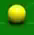

green yellow brown
252166950.0 60386550.0 11834550.0


green brown yellow
105172200.0 37270800.0 7925400.0


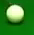

green white yellow
227890950.0 62814150.0 5462100.0


green black white
16193520.0 15550920.0 7068600.0


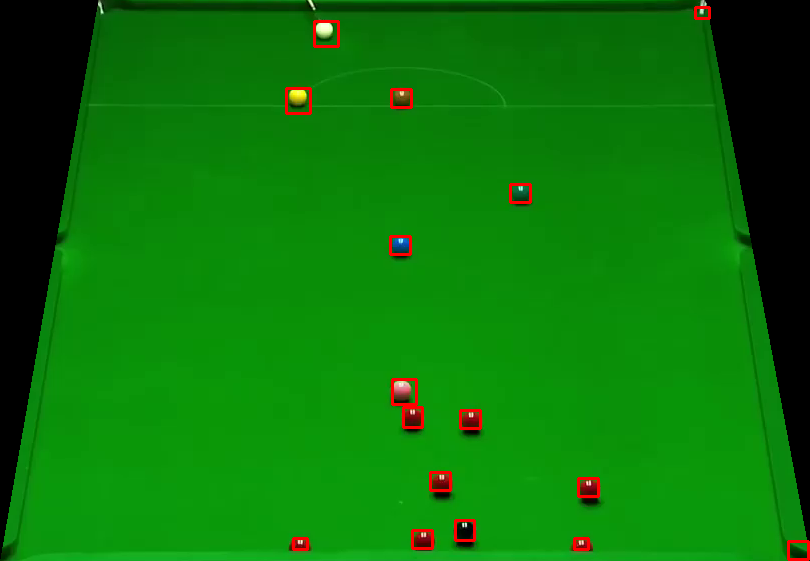

green black dark_green
84394800.0 45196200.0 428400.0


green red brown
29431080.0 17607240.0 6940080.0


green red brown
27246240.0 19278000.0 6168960.0


red black green
19792080.0 12466440.0 8867880.0


green red black
89107200.0 42197400.0 22491000.0


green black white
94729950.0 52578450.0 6877350.0


green red black
87179400.0 40483800.0 20563200.0


green red black
91891800.0 40698000.0 19063800.0


green red black
80110800.0 41983200.0 19063800.0


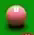

green pink white
207256350.0 35503650.0 30648450.0


green blue dark_green
94676400.0 30630600.0 9424800.0


green dark_green black
111812400.0 23347800.0 7068600.0


green brown yellow
104315400.0 34272000.0 8996400.0


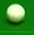

green white yellow
255504900.0 69490050.0 3944850.0


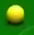

green yellow white
250953150.0 50372700.0 13351800.0


green black white
17735760.0 15550920.0 7454160.0


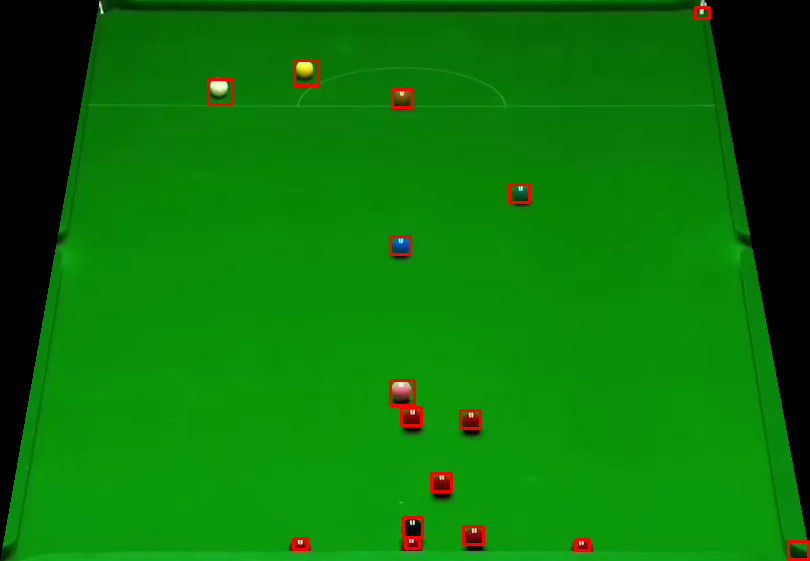

{'white': 1, 'red': 7, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 7, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
23


green black white
99832500.0 64114650.0 4437000.0


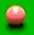

green pink white
231835800.0 41572650.0 35503650.0


green red black
97889400.0 37056600.0 12423600.0


green blue dark_green
109027800.0 18207000.0 11352600.0


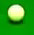

green white yellow
276139500.0 57048600.0 7889700.0


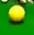

green yellow white
240028950.0 47945100.0 19724250.0


green dark_green brown
102816000.0 13923000.0 12852000.0


green brown yellow
109670400.0 20563200.0 8782200.0


black yellow brown
136445400.0 0.0 0.0


black green white
23005080.0 13880160.0 3984120.0


green black white
23904720.0 19278000.0 6040440.0


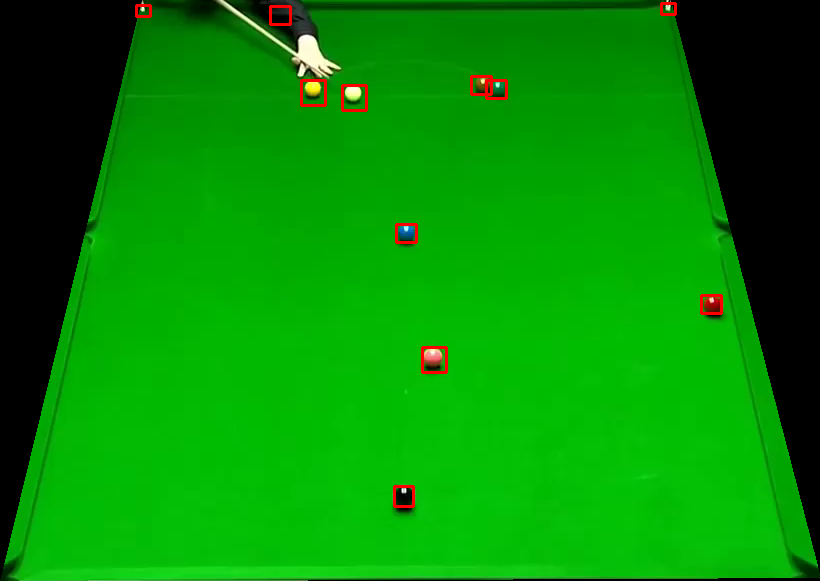

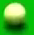

green white yellow
211504650.0 80414250.0 22151850.0


green black white
99166950.0 65667600.0 4437000.0


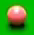

green pink white
231835800.0 39145050.0 32772600.0


green blue dark_green
109884600.0 15208200.0 11138400.0


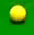

green yellow white
271284300.0 50979600.0 5462100.0


green dark_green brown
106671600.0 12852000.0 12637800.0


green brown yellow
108171000.0 22062600.0 8996400.0


black green white
22748040.0 19792080.0 4241160.0


green black white
24418800.0 19535040.0 6297480.0


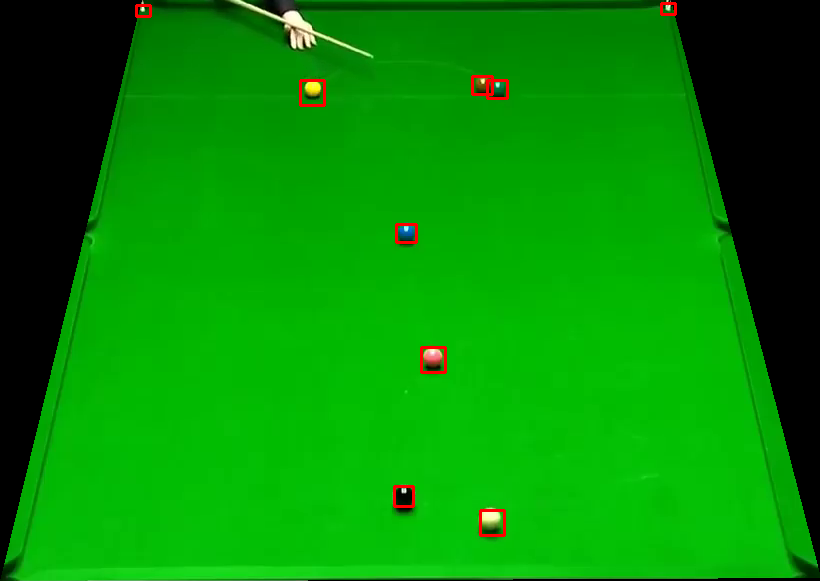

{'white': 1, 'red': 1, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 0, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
YES YES True
3 3 True
red red True
24


green red black
83415600.0 43038900.0 30393450.0


green red black
89405550.0 34386750.0 31059000.0


black red green
71971200.0 37270800.0 35128800.0


red black green
54406800.0 50979600.0 40698000.0


red green brown
20948760.0 18892440.0 5397840.0


red green black
62974800.0 59333400.0 20777400.0


green red black
86299650.0 39267450.0 25069050.0


green red black
82750050.0 40598550.0 20853900.0


green red black
77326200.0 35557200.0 22705200.0


green red brown
24735000.0 17850000.0 5482500.0


green red black
90071100.0 36605250.0 22406850.0


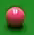

green pink brown
226980600.0 44910600.0 15779400.0


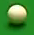

green white yellow
237601350.0 60083100.0 14262150.0


green blue dark_green
101959200.0 30202200.0 15208200.0


black brown red
7711200.0 771120.0 385560.0


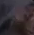

black yellow brown
117738600.0 0.0 0.0


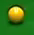

green yellow brown
257022150.0 40055400.0 27007050.0


green brown black
116953200.0 35128800.0 4069800.0


dark_green green blue
9896040.0 3341520.0 2184840.0


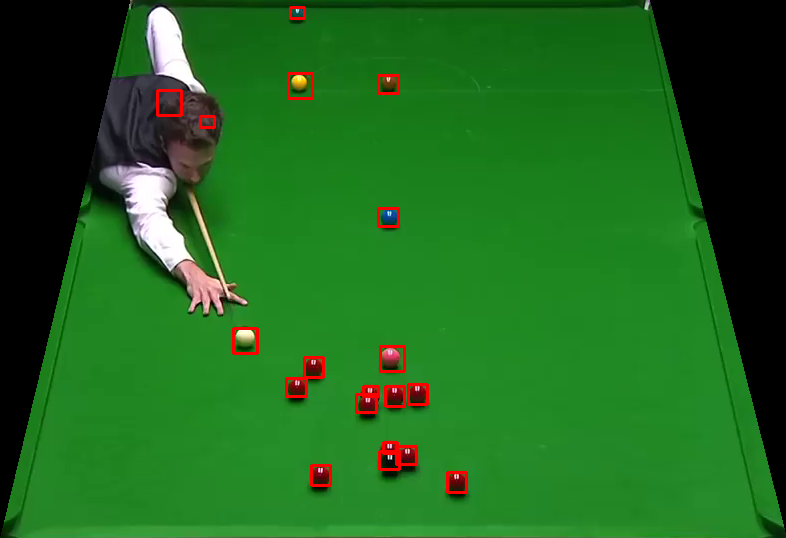

green red black
85634100.0 39267450.0 27731250.0


black red green
31230360.0 16579080.0 3727080.0


red black green
53764200.0 48837600.0 44125200.0


red green brown
20434680.0 19792080.0 6168960.0


red green black
64902600.0 58048200.0 18207000.0


green red black
86299650.0 38158200.0 23737950.0


green red black
82084500.0 38823750.0 24847200.0


green red brown
25318440.0 19406520.0 6168960.0


green red black
73042200.0 34057800.0 26560800.0


green red brown
86077800.0 41042250.0 18413550.0


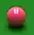

green pink brown
225159900.0 43393350.0 15779400.0


green red black
91180350.0 35939700.0 15529500.0


green blue dark_green
98746200.0 30416400.0 7711200.0


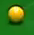

green yellow brown
260360100.0 40358850.0 20027700.0


green brown black
115882200.0 38341800.0 4926600.0


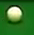

green white brown
202097700.0 43393350.0 20027700.0


dark_green green white
10667160.0 6297480.0 1670760.0


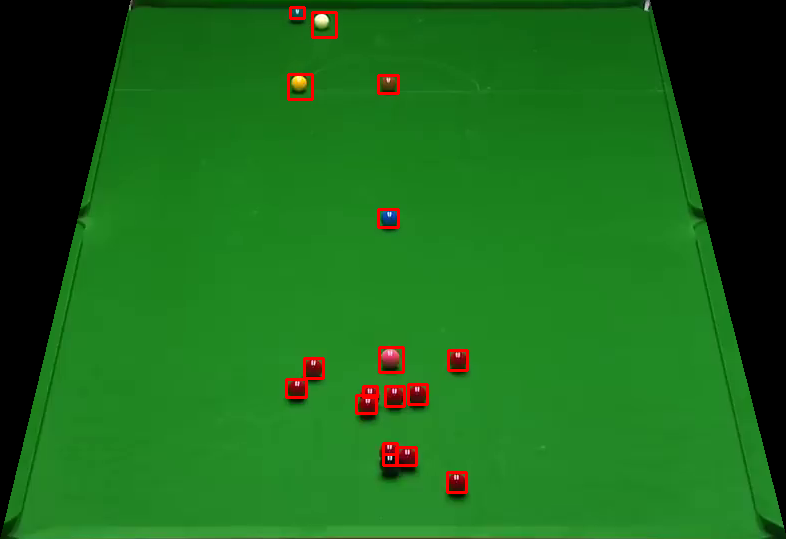

{'white': 1, 'red': 10, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 10, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
25


green red black
86965200.0 40598550.0 27953100.0


green red black
87852600.0 41264100.0 27953100.0


black red green
30716280.0 16836120.0 3855600.0


red black green
53335800.0 49266000.0 42840000.0


green red brown
20306160.0 20049120.0 5012280.0


green red black
91677600.0 37056600.0 19920600.0


green red black
96504750.0 42373350.0 16195050.0


green red black
79039800.0 37056600.0 25704000.0


green red brown
90071100.0 39045600.0 20188350.0


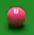

green pink brown
228801300.0 41572650.0 16689750.0


green red black
92955150.0 35496000.0 21297600.0


green red black
95173650.0 37492650.0 15307650.0


green blue dark_green
100245600.0 27203400.0 13280400.0


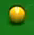

green yellow brown
260663550.0 39145050.0 25186350.0


green brown black
115453800.0 40483800.0 3427200.0


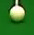

green white brown
243973800.0 47338200.0 16082850.0


green dark_green white
35505945.0 17102340.0 2230740.0


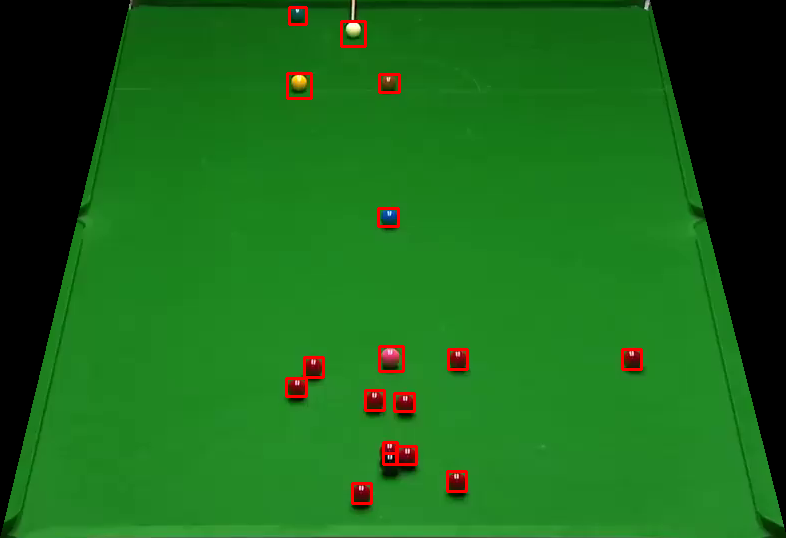

green red black
85855950.0 44370000.0 26178300.0


red black green
56334600.0 50122800.0 42625800.0


black red green
31230360.0 17478720.0 4498200.0


red green black
20948760.0 19406520.0 4498200.0


green red black
88893000.0 38984400.0 20349000.0


green red black
92955150.0 33277500.0 27287550.0


green red black
76683600.0 39627000.0 25061400.0


green red black
86521500.0 37936350.0 19079100.0


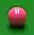

green pink brown
225766800.0 40055400.0 18813900.0


green red black
94286250.0 42595200.0 16638750.0


green red black
92955150.0 34386750.0 21519450.0


green blue dark_green
101316600.0 31059000.0 14565600.0


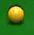

green yellow brown
259449750.0 40055400.0 22758750.0


green brown black
117167400.0 36414000.0 3213000.0


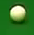

green white brown
247615200.0 46427850.0 24882900.0


green red brown
42384060.0 21935610.0 17474130.0


green dark_green blue
41454585.0 12454965.0 3346110.0


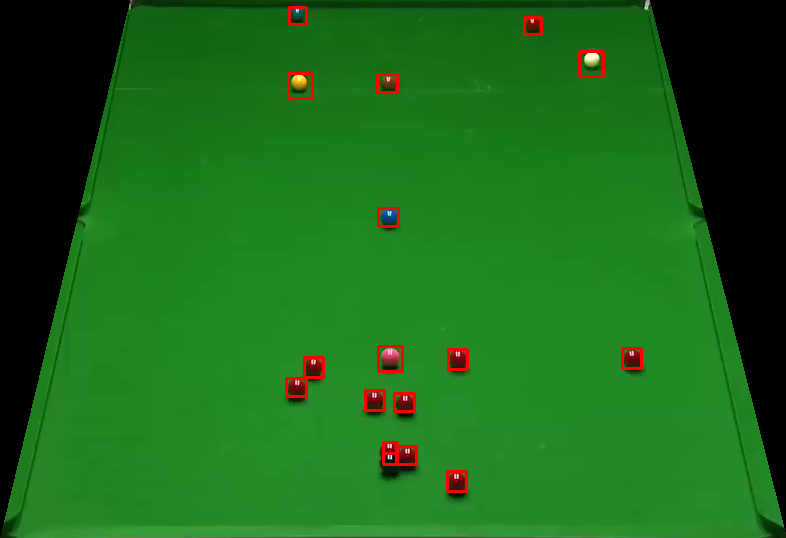

{'white': 1, 'red': 10, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
{'white': 1, 'red': 10, 'blue': 1, 'pink': 1, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 1}
NO NO True
0 0 True
  True
acc = 88.0%


In [0]:
#9
acc = 0

for i in range(1, 26):
    print(i)
    cap = cv.VideoCapture(folder_in + 'Task2/'+ str(i) +'.mp4')
    length = int(cap.get(cv.CAP_PROP_FRAME_COUNT))
    current_frame = 0

    ret, frame = cap.read() # Read the frame
    num_balls_init, balls_init = get_numbers_and_colors(frame)

    for _ in range(length-10):
        ret, frame = cap.read() # Read the frame
    ret, frame = cap.read() # Read the frame
    num_balls_final, balls_final = get_numbers_and_colors(frame)

    print(balls_init)
    print(balls_final)

    my_ans = ""
    my_color = ""
    my_pocket = 0

    if cmp_dict(balls_init, balls_final) == True:
        my_ans = "NO"
    else:
        my_ans = "YES"
        my_color = cmp_dict(balls_init, balls_final)
        my_pocket = get_suspicious_pockets(folder_in + 'Task2/'+ str(i) +'.mp4', my_color)

    # load ground truth
    ans_truth  = ""
    pocket_truth = 0
    color_truth = ""
    with open(folder_in + 'Task2/ground-truth/' + str(i) + '_gt.txt') as f:
        ans_truth = f.readline().replace('\n', '')
        if ans_truth == "YES":
            pocket_truth = int(f.readline())
            color_truth = f.readline().replace('\n', '')

    print(my_ans, ans_truth, my_ans == ans_truth)
    print(my_pocket, pocket_truth, my_pocket == pocket_truth)
    print(my_color, color_truth, my_color == color_truth)

    if my_ans == ans_truth:
        if ans_truth == "NO":
            acc += 1
        else:
            acc += 0.5
            if my_color == color_truth:
                acc += 0.25
            if my_pocket == pocket_truth:
                acc += 0.25
        
print('acc = ' + str(acc * 4) + '%')

In [0]:
#10
def task2(path):

    cap = cv.VideoCapture(path)
    length = int(cap.get(cv.CAP_PROP_FRAME_COUNT))
    current_frame = 0

    ret, frame = cap.read() # Read the frame
    num_balls_init, balls_init = get_numbers_and_colors(frame, False)

    for _ in range(length-10):
        ret, frame = cap.read() # Read the frame
    ret, frame = cap.read() # Read the frame
    num_balls_final, balls_final = get_numbers_and_colors(frame, False)

    #print(balls_init)
    #print(balls_final)

    my_ans = ""
    my_color = ""
    my_pocket = 0

    if cmp_dict(balls_init, balls_final) == True:
        my_ans = "NO"
    else:
        my_ans = "YES"
        my_color = cmp_dict(balls_init, balls_final)
        my_pocket = get_suspicious_pockets(path, my_color)

    return my_ans, my_color, my_pocket

In [134]:
#11
my_ans, my_color, my_pocket = task2(folder_in + 'Task2/1.mp4')
print(my_ans, my_color, my_pocket)

I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
YES red 1


# **Task 3**
You receive a test set of 25 videos containing a player making a shot. In each of the 25 videos the snooker table is seen from above. The task is to track the cue ball (the white ball) and another specified ball. The initial bounding boxes of the two balls to be tracked are provided for the first frame (they follow the format [xmin ymin xmax ymax], where (xmin,ymin) is the top left corner and (xmax,ymax) is the bottom right corner of the initial bounding-box). By correctly solving the tracking problem for a video you will earn 0.04 points (0.02 points for each correctly tracked ball). In each video we will consider that your algorithm correctly tracks a ball if in more (greater or equal) than 80% of the frames your algorithm correctly localizes the ball to be tracked. We consider that your algorithm correctly localizes the ball to be tracked in a specific frame if the value of the IOU (intersection over union) beetween the window provided by your algorithm and the ground-truth window is more than 20%.The first frame for which we provide the bounding boxes initialization has index 0, the last frame of a video with N frames has index N − 1. 

In [0]:
#1
def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the intersection area
    if float(boxAArea + boxBArea - interArea) > 0:
        iou = interArea / float(boxAArea + boxBArea - interArea)
    else: 
        iou = 1
    # return the intersection over union value
    return iou

In [0]:
#2
def compute_percentage_tracking(gt_bboxes, predicted_bboxes, num_frames):
    num_frames = int(num_frames)
    
    tp = 0
    fp = 0
    
    gt_dict = {}
    for gt_box in gt_bboxes:
        gt_dict[gt_box[0]] = gt_box[1:]
    
    pred_dict = {}
    for pred_bbox in predicted_bboxes:
        pred_dict[pred_bbox[0]] = pred_bbox[1:]
        
    for i in range(num_frames):
        if gt_dict.get(i, None) is None and pred_dict.get(i, None) is None: # the ball is not on the table
            tp += 1 
        
        elif gt_dict.get(i, None) is not None and pred_dict.get(i, None) is None: # the ball is not detected
            fp += 1
            
        elif gt_dict.get(i, None) is None and pred_dict.get(i, None) is not None: # the ball is not on the table, but it is 'detected'
            fp += 1
            
        elif gt_dict.get(i, None) is not None and pred_dict.get(i, None) is not None: # the ball is on the table and it is detected
            
            iou = bb_intersection_over_union(gt_dict[i], pred_dict[i])
            if iou >= 0.2:
                tp += 1
            else:
                fp += 1 
             
            
    print(tp, fp)
    assert tp + fp == num_frames
    perc = tp / (tp + fp)
    
    return perc

In [0]:
#3
def track_ball_using_hist_of_colors(video_path, first_box, max_number_of_frame_to_run, show_results = True):
    
    bboxes = []
    
    cap = cv.VideoCapture(video_path)
    ret, first_frame = cap.read() # Read the first frame 
    
    (x, y, X, Y) = first_box
    w = X-x
    h = Y-y
    track_window = (x, y, w, h)
    
    roi = first_frame[y: y + h, x: x + w]
    annotated_frame = cv.rectangle(first_frame, (x, y), (x+w,y+h), 255, 2)
 
    if show_results:
        cv2_imshow(annotated_frame)
    
    roi_hist = cv.calcHist([roi], [0 ,1, 2], None, [4, 4, 4], [0, 256, 0, 256, 0, 256]) 
    roi_hist_norm = roi_hist / roi_hist.sum()

    roi_gray = cv.cvtColor(roi, cv.COLOR_BGR2GRAY)
    
    frame_idx = 0
    while cap.isOpened():
        frame_idx += 1
        ret, frame = cap.read()

        if ret is True: 
            frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
            mask1 = np.int8(np.zeros(frame_gray.shape))
            center = (y + h//2, x + h//2)

            y_min = np.max((0, center[0] - (3*h)))
            y_max = np.min((frame.shape[0], center[0] + (3*h)))
            x_min = np.max((0, center[1] - (3*w)))
            x_max = np.min((frame.shape[1], center[1] + (3*w)))
            
            mask1[y_min: y_max, x_min: x_max] = 255

            frame_gray_mask = cv.bitwise_and(frame_gray,frame_gray,mask=mask1)

            res = cv.matchTemplate(frame_gray_mask, roi_gray, cv.TM_CCOEFF_NORMED)        
            min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

            y = max_loc[1]
            x = max_loc[0]
            bboxes.append([frame_idx, x, y, x + w, y + h])
            img2 = cv.rectangle(frame, (x, y), (x + w, y + h), 255, 2)
            if show_results:
                cv2_imshow(img2)
            
            if current_frame > max_number_of_frame_to_run:
                break

        else:
            break
    # after playing the video, release the video capture    
    cap.release()
    # close all the frames
    cv.destroyAllWindows()
    return bboxes

In [0]:
#4
def track_ball_using_CSRT_tracker(video_path, first_box, max_number_of_frame_to_run, show_results = True):
    
    bboxes = []
    
    cap = cv.VideoCapture(video_path)
    ret, first_frame = cap.read() # Read the first frame 
    
    (x, y, X, Y) = first_box
    w = X-x
    h = Y-y
    track_window = (x-10, y-10, w+20, h+20)
    
    roi = first_frame[y: y + h, x: x + w]
    annotated_frame = cv.rectangle(first_frame, (x, y), (x+w,y+h), 255, 2)
 
    if show_results:
        cv2_imshow(annotated_frame)
    
    tracker = cv.TrackerCSRT_create()
    tracker.init(first_frame, track_window)
    frame_idx = 0

    while cap.isOpened():
        frame_idx += 1
        ret, frame = cap.read()

        if ret is True:             
            (success, box) = tracker.update(frame)

            if success:
                (x, y, w, h) = [int(p) for p in box]
                x = x + 10
                y = y + 10
                w = w - 20
                h = h - 20
                cv.rectangle(frame, (x, y), (x + w, y + h),
                    (0, 255, 0), 2)

            bboxes.append([frame_idx, x, y, x + w, y + h])
            img2 = cv.rectangle(frame, (x, y), (x + w, y + h), 255, 2)
            if show_results:
                cv2_imshow(img2)

            if frame_idx > max_number_of_frame_to_run:
                break
                
        else:
            break
    # after playing the video, release the video capture    
    cap.release()
    # close all the frames
    cv.destroyAllWindows()
    return bboxes

In [0]:
#5
idx = 3
video_name = folder_in + "Task3/" + str(idx) + ".mp4"

first_frame1 = None
first_frame2 = None
max_number_of_frame_to_run1 = 0
max_number_of_frame_to_run2 = 0

with open(folder_in + "Task3/" + str(idx) + "_ball_1.txt") as f:
    max_number_of_frame_to_run1 = int(f.readline().split(' ')[0])
    ans_truth = f.readline().replace('\n', '').split(' ')
    first_frame1 = (int(ans_truth[1]), int(ans_truth[2]), int(ans_truth[3]), int(ans_truth[4]))

with open(folder_in + "Task3/" + str(idx) + "_ball_2.txt") as f:
    max_number_of_frame_to_run2 = int(f.readline().split(' ')[0])
    ans_truth = f.readline().replace('\n', '').split(' ')
    first_frame2 = (int(ans_truth[1]), int(ans_truth[2]), int(ans_truth[3]), int(ans_truth[4]))

bboxes1 = track_ball_using_CSRT_tracker(video_name, first_frame1, max_number_of_frame_to_run1, False)
bboxes2 = track_ball_using_CSRT_tracker(video_name, first_frame2, max_number_of_frame_to_run2, False)

#bboxes3 = track_ball_using_hist_of_colors(video_name, first_frame1, max_number_of_frame_to_run1, False)
#bboxes4 = track_ball_using_hist_of_colors(video_name, first_frame2, max_number_of_frame_to_run2, False)

In [0]:
#6
def get_coordinates_of_interet(frame):
    imgColor = frame.copy()
    img = cv.cvtColor(imgColor, cv.COLOR_BGR2GRAY)
            
    bottom_left_corner, bottom_right_corner, top_right_corner, top_left_corner, middle_left_corner, middle_right_corner = get_pockets(img.copy(), False)
    if bottom_left_corner is None or bottom_right_corner is None or top_right_corner is None or top_left_corner is None or middle_right_corner is None or middle_left_corner is None:
        return None, None, None, None, None, None

    interestRaze = 75

    area_of_interest_1 = [top_left_corner[1] - interestRaze, top_left_corner[1] + interestRaze, top_left_corner[0] - interestRaze, top_left_corner[0] + interestRaze]
    area_of_interest_2 = [top_right_corner[1] - interestRaze, top_right_corner[1] + interestRaze, top_right_corner[0] - interestRaze, top_right_corner[0] + interestRaze]
    area_of_interest_3 = [bottom_left_corner[1] - interestRaze, bottom_left_corner[1] + interestRaze, bottom_left_corner[0] - interestRaze, bottom_left_corner[0] + interestRaze]
    area_of_interest_4 = [bottom_right_corner[1] - interestRaze, bottom_right_corner[1] + interestRaze, bottom_right_corner[0] - interestRaze, bottom_right_corner[0] + interestRaze]
    area_of_interest_5 = [middle_left_corner[1] - interestRaze, middle_left_corner[1] + interestRaze, middle_left_corner[0] - interestRaze, middle_left_corner[0] + interestRaze]
    area_of_interest_6 = [middle_right_corner[1] - interestRaze, middle_right_corner[1] + interestRaze, middle_right_corner[0] - interestRaze, middle_right_corner[0] + interestRaze]

    return area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6

In [0]:
#7
def update_boxes(video_path, boxes, show_results = True):
    cap = cv.VideoCapture(video_path)  
    current_frame = 0

    ret, frame = cap.read() # Read the frame
    area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_coordinates_of_interet(frame)
    while area_of_interest_1 is None:
        current_frame = current_frame + 1
        ret, frame = cap.read() # Read the frame
        area_of_interest_1, area_of_interest_2, area_of_interest_3, area_of_interest_4, area_of_interest_5, area_of_interest_6 = get_coordinates_of_interet(frame)

    is_moving = False
    frame_start_moving = 0
    for i in range(5, len(boxes), 5):
        if bb_intersection_over_union(boxes[i-5][1:], boxes[i][1:]) < 0.5:
            is_moving = True
            frame_start_moving = i -5
            break

    if show_results:
        print("frame_start_moving = ", frame_start_moving)

    if is_moving:
        frame_end_moving = len(boxes) - 1
        for i in range(frame_start_moving + 5, len(boxes), 5):
            if bb_intersection_over_union(boxes[i-5][1:], boxes[i][1:]) > 0.9:
                frame_end_moving = i
                break

        if show_results:
            print("frame_end_moving = ", frame_end_moving)
            print(area_of_interest_3)
            print(boxes[frame_end_moving][1:])

            img2 = cv.rectangle(frame, (area_of_interest_3[2], area_of_interest_3[0]), (area_of_interest_3[3], area_of_interest_3[1]), (255,0,0), 2)
            img2 = cv.rectangle(frame, (boxes[frame_start_moving][1], boxes[frame_start_moving][2]), (boxes[frame_start_moving][3], boxes[frame_start_moving][4]), (0,255,0), 2)
            img2 = cv.rectangle(frame, (boxes[frame_end_moving][1], boxes[frame_end_moving][2]), (boxes[frame_end_moving][3], boxes[frame_end_moving][4]), (0,0,255), 2)
            cv2_imshow(img2)
        
        result = boxes
        if area_of_interest_1[0] <= boxes[frame_end_moving][2] <= area_of_interest_1[1] and area_of_interest_1[0] <= boxes[frame_end_moving][4] <= area_of_interest_1[1] and area_of_interest_1[2] <= boxes[frame_end_moving][1] <= area_of_interest_1[3] and area_of_interest_1[2] <= boxes[frame_end_moving][3] <= area_of_interest_1[3]:
            result = boxes[:frame_end_moving]
            print("case1")
        elif area_of_interest_2[0] <= boxes[frame_end_moving][2] <= area_of_interest_2[1] and area_of_interest_2[0] <= boxes[frame_end_moving][4] <= area_of_interest_2[1] and area_of_interest_2[2] <= boxes[frame_end_moving][1] <= area_of_interest_2[3] and area_of_interest_2[2] <= boxes[frame_end_moving][3] <= area_of_interest_2[3]:
            result = boxes[:frame_end_moving]
            print("case2")
        elif area_of_interest_3[0] <= boxes[frame_end_moving][2] <= area_of_interest_3[1] and area_of_interest_3[0] <= boxes[frame_end_moving][4] <= area_of_interest_3[1] and area_of_interest_3[2] <= boxes[frame_end_moving][1] <= area_of_interest_3[3] and area_of_interest_3[2] <= boxes[frame_end_moving][3] <= area_of_interest_3[3]:
            result = boxes[:frame_end_moving]
            print("case3")
        elif area_of_interest_4[0] <= boxes[frame_end_moving][2] <= area_of_interest_4[1] and area_of_interest_4[0] <= boxes[frame_end_moving][4] <= area_of_interest_4[1] and area_of_interest_4[2] <= boxes[frame_end_moving][1] <= area_of_interest_4[3] and area_of_interest_4[2] <= boxes[frame_end_moving][3] <= area_of_interest_4[3]:
            result = boxes[:frame_end_moving]
            print("case4")
        elif area_of_interest_5[0] <= boxes[frame_end_moving][2] <= area_of_interest_5[1] and area_of_interest_5[0] <= boxes[frame_end_moving][4] <= area_of_interest_5[1] and area_of_interest_1[2] <= boxes[frame_end_moving][1] <= area_of_interest_5[3] and area_of_interest_5[2] <= boxes[frame_end_moving][3] <= area_of_interest_5[3]:
            result = boxes[:frame_end_moving]
            print("case5")
        elif area_of_interest_6[0] <= boxes[frame_end_moving][2] <= area_of_interest_6[1] and area_of_interest_6[0] <= boxes[frame_end_moving][4] <= area_of_interest_6[1] and area_of_interest_1[2] <= boxes[frame_end_moving][1] <= area_of_interest_6[3] and area_of_interest_6[2] <= boxes[frame_end_moving][3] <= area_of_interest_6[3]:
            result = boxes[:frame_end_moving]
            print("case6")

        return result
    else:
        return boxes

In [100]:
#8
bboxes1_new = update_boxes(video_name, bboxes1, False)
bboxes2_new = update_boxes(video_name, bboxes2, False)

case3


In [0]:
#9
# load the ground-truth file
ball1_gt = np.loadtxt(folder_in + "Task3/ground-truth/" + str(idx) + "_ball_1_gt.txt")
ball2_gt = np.loadtxt(folder_in + "Task3/ground-truth/" + str(idx) + "_ball_2_gt.txt")

In [102]:
#10
compute_percentage_tracking(ball1_gt[1:], bboxes1_new, ball1_gt[0][0])

190 6


0.9693877551020408

In [103]:
#11
compute_percentage_tracking(ball2_gt[1:], bboxes2_new, ball2_gt[0][0])

181 15


0.923469387755102

In [104]:
#12
acc = 0
for idx in range (1, 26):

    video_name = folder_in + "Task3/" + str(idx) + ".mp4"

    first_frame1 = None
    first_frame2 = None
    max_number_of_frame_to_run1 = 0
    max_number_of_frame_to_run2 = 0

    with open(folder_in + "Task3/" + str(idx) + "_ball_1.txt") as f:
        max_number_of_frame_to_run1 = int(f.readline().split(' ')[0])
        ans_truth = f.readline().replace('\n', '').split(' ')
        first_frame1 = (int(ans_truth[1]), int(ans_truth[2]), int(ans_truth[3]), int(ans_truth[4]))

    with open(folder_in + "Task3/" + str(idx) + "_ball_2.txt") as f:
        max_number_of_frame_to_run2 = int(f.readline().split(' ')[0])
        ans_truth = f.readline().replace('\n', '').split(' ')
        first_frame2 = (int(ans_truth[1]), int(ans_truth[2]), int(ans_truth[3]), int(ans_truth[4]))

    bboxes1 = track_ball_using_CSRT_tracker(video_name, first_frame1, max_number_of_frame_to_run1, False)
    bboxes2 = track_ball_using_CSRT_tracker(video_name, first_frame2, max_number_of_frame_to_run2, False)

    #bboxes3 = track_ball_using_hist_of_colors(video_name, first_frame1, max_number_of_frame_to_run1, False)
    #bboxes4 = track_ball_using_hist_of_colors(video_name, first_frame2, max_number_of_frame_to_run2, False)

    bboxes1_new = update_boxes(video_name, bboxes1, False)
    bboxes2_new = update_boxes(video_name, bboxes2, False)

    # load the ground-truth file
    ball1_gt = np.loadtxt(folder_in + "Task3/ground-truth/" + str(idx) + "_ball_1_gt.txt")
    ball2_gt = np.loadtxt(folder_in + "Task3/ground-truth/" + str(idx) + "_ball_2_gt.txt")

    acc1 = compute_percentage_tracking(ball1_gt[1:], bboxes1_new, ball1_gt[0][0])
    acc2 = compute_percentage_tracking(ball2_gt[1:], bboxes2_new, ball2_gt[0][0])
    print(idx, acc1, acc2)
    if acc1 > 0.8:
        acc += 0.5
    if acc2 > 0.8:
        acc += 0.5

print("acc=", acc * 4, "%")

case2
253 3
243 13
1 0.98828125 0.94921875
194 1
194 1
2 0.9948717948717949 0.9948717948717949
case3
190 6
181 15
3 0.9693877551020408 0.923469387755102
144 12
31 125
4 0.9230769230769231 0.1987179487179487
case5
case3
89 67
109 47
5 0.5705128205128205 0.6987179487179487
33 251
35 249
6 0.11619718309859155 0.12323943661971831
case3
279 1
268 12
7 0.9964285714285714 0.9571428571428572
45 269
264 50
8 0.14331210191082802 0.8407643312101911
259 1
70 190
9 0.9961538461538462 0.2692307692307692
case6
201 1
192 10
10 0.995049504950495 0.9504950495049505
case3
209 1
195 15
11 0.9952380952380953 0.9285714285714286
41 170
42 169
12 0.1943127962085308 0.1990521327014218
209 1
209 1
13 0.9952380952380953 0.9952380952380953
115 187
301 1
14 0.38079470198675497 0.9966887417218543
case3
211 1
202 10
15 0.9952830188679245 0.9528301886792453
330 1
330 1
16 0.9969788519637462 0.9969788519637462
case6
215 1
205 11
17 0.9953703703703703 0.9490740740740741
case4
149 2
134 17
18 0.9867549668874173 0.887417

In [0]:
#13
def task3(video_name, init_ball1, init_ball2):

    first_frame1 = None
    first_frame2 = None
    max_number_of_frame_to_run1 = 0
    max_number_of_frame_to_run2 = 0

    with open(init_ball1) as f:
        max_number_of_frame_to_run1 = int(f.readline().split(' ')[0])
        ans_truth = f.readline().replace('\n', '').split(' ')
        first_frame1 = (int(ans_truth[1]), int(ans_truth[2]), int(ans_truth[3]), int(ans_truth[4]))

    with open(init_ball2) as f:
        max_number_of_frame_to_run2 = int(f.readline().split(' ')[0])
        ans_truth = f.readline().replace('\n', '').split(' ')
        first_frame2 = (int(ans_truth[1]), int(ans_truth[2]), int(ans_truth[3]), int(ans_truth[4]))

    bboxes1 = track_ball_using_CSRT_tracker(video_name, first_frame1, max_number_of_frame_to_run1, False)
    bboxes2 = track_ball_using_CSRT_tracker(video_name, first_frame2, max_number_of_frame_to_run2, False)

    #bboxes3 = track_ball_using_hist_of_colors(video_name, first_frame1, max_number_of_frame_to_run1, False)
    #bboxes4 = track_ball_using_hist_of_colors(video_name, first_frame2, max_number_of_frame_to_run2, False)

    bboxes1_new = update_boxes(video_name, bboxes1, False)
    bboxes2_new = update_boxes(video_name, bboxes2, False)

    return bboxes1_new, bboxes2_new

In [106]:
#14
bboxes1, bboxes2 = task3(folder_in + 'Task3/1.mp4', folder_in + "Task3/1_ball_1.txt", folder_in + "Task3/1_ball_2.txt")
print(bboxes1, bboxes2)

case2
[[1, 373, 266, 394, 292], [2, 373, 266, 393, 291], [3, 373, 266, 394, 292], [4, 374, 267, 394, 292], [5, 373, 267, 394, 293], [6, 373, 267, 393, 292], [7, 373, 267, 394, 293], [8, 374, 267, 393, 291], [9, 373, 266, 393, 291], [10, 374, 267, 394, 292], [11, 374, 268, 392, 291], [12, 373, 266, 393, 291], [13, 372, 266, 393, 292], [14, 374, 268, 394, 293], [15, 374, 268, 393, 292], [16, 374, 268, 392, 291], [17, 374, 267, 393, 291], [18, 374, 268, 392, 291], [19, 373, 266, 393, 291], [20, 374, 267, 394, 292], [21, 374, 268, 392, 291], [22, 373, 266, 393, 291], [23, 374, 267, 394, 292], [24, 374, 268, 392, 291], [25, 374, 267, 393, 291], [26, 374, 268, 392, 291], [27, 373, 266, 393, 291], [28, 374, 267, 394, 292], [29, 374, 268, 392, 291], [30, 373, 267, 393, 292], [31, 374, 268, 393, 292], [32, 373, 266, 393, 291], [33, 374, 267, 394, 292], [34, 374, 268, 392, 291], [35, 373, 267, 393, 292], [36, 374, 268, 393, 292], [37, 373, 266, 393, 291], [38, 373, 267, 393, 292], [39, 375, 265,

# **(bonus) Task 4**
You receive a test set of 25 videos containing a player making a shot. Different than the previous tasks, in this videos the snooker table can be filmed from different viewpoints (not only from above). The task is to track the cue ball. The task here is much harder as you have diferent scales of the cue ball, changes in camera viewpoint, the initial bounding box of the white ball is not provided. The initial bounding box of the cue ball to be tracked is provided for the first frame (it follows the format [xmin ymin xmax ymax], where (xmin,ymin) is the top left corner and (xmax,ymax) is the bottom right corner of the initial bounding-box). By correctly solving the tracking problem for a video you will earn 0.04 points. The rules described at Task 3 apply here, meaning that your algorithm should correctly localizes the cue ball in more than 80% of the frames, at each frame correctly localization means that the window provided by your algorithm should have IOU more than 20% with respect to the ground-truth window. The first frame for which we provide the bounding boxes initialization has index 0, the last frame of a video with N frames has index N − 1.

In [0]:
#1


# **Running the entire code**

In [0]:
#1
def run_task_1(have_ground_truth = False):
    acc_colors = 0
    acc_numbers = 0

    for i in range(1, 51):
        # change to test folder
        imgColor = cv.imread(folder_in + 'Task1/'+ str(i) +'.jpg')
        
        balls, num_balls = task1(imgColor)

        with open(folder_out + 'Task1/' + str(i) + '.txt', 'w') as f:
            f.write(str(num_balls) + '\n')
            for color, nr in balls.items(): 
                f.write(str(nr) + " " + color + '\n')
        
        
        if have_ground_truth:
            # load ground truth
            ground_truth = {}
            num_balls_truth  = 0
            with open(folder_in + 'Task1/ground-truth/' + str(i) + '_gt.txt') as f:
                num_balls_truth = int(f.readline())
                lines = f.readlines()
                for line in lines:
                    info = line.replace('\n', '').split(' ')
                    nr = int(info[0])
                    color = info[1]

                    ground_truth[color] = nr

            ok = True
            nr = 0
            for color, number in balls.items(): 
                nr += number
                if color == 'dark_green':
                    if ground_truth['green'] != number:
                        ok = False
                else:
                    if ground_truth[color] != number:
                        ok = False
                        print("greseala - ground_truth:", ground_truth[color], "me: ", number, color)

            if ok:
                acc_colors += 1
            else:
                print(i)
                print(num_balls_truth, num_balls)     
                print(ground_truth)
                print(balls)

            if num_balls_truth == nr:
                acc_numbers += 1

                ####################
            #cv.imwrite(data_dir_drive + '/data/aux/' + str(i) + '.jpg', masked_image)

    if have_ground_truth:
        print('acc numbers = ' + str(acc_numbers * 2) + '%')
        print('acc colors = ' + str(acc_colors * 2) + '%')

In [126]:
#2
run_task_1(True)

greseala - ground_truth: 0 me:  1 black
5
1 2
{'white': 1, 'black': 0, 'pink': 0, 'blue': 0, 'green': 0, 'brown': 0, 'yellow': 0, 'red': 0}
{'white': 1, 'red': 0, 'blue': 0, 'pink': 0, 'dark_green': 0, 'brown': 0, 'yellow': 0, 'black': 1}
greseala - ground_truth: 3 me:  4 red
greseala - ground_truth: 1 me:  0 pink
greseala - ground_truth: 1 me:  0 yellow
8
10 9
{'white': 1, 'black': 1, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 3}
{'white': 1, 'red': 4, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 0, 'black': 1}
greseala - ground_truth: 3 me:  4 red
greseala - ground_truth: 1 me:  0 pink
9
9 9
{'white': 1, 'black': 0, 'pink': 1, 'blue': 1, 'green': 1, 'brown': 1, 'yellow': 1, 'red': 3}
{'white': 1, 'red': 4, 'blue': 1, 'pink': 0, 'dark_green': 1, 'brown': 1, 'yellow': 1, 'black': 0}
greseala - ground_truth: 1 me:  3 red
greseala - ground_truth: 1 me:  0 pink
greseala - ground_truth: 1 me:  0 yellow
12
8 8
{'white': 1, 'black': 1, 'pink': 1, 'blue'

In [0]:
#3
def run_task_2(have_ground_truth = False):

    acc = 0

    for i in range(1, 26):
        print(i)
        
        my_ans, my_color, my_pocket = task2(folder_in + 'Task2/'+ str(i) +'.mp4')

        with open(folder_out + 'Task2/' + str(i) + '.txt', 'w') as f:
            f.write(my_ans + '\n')
            if my_ans == 'YES':
                f.write(str(my_pocket) + '\n' + my_color)

        if have_ground_truth:
            # load ground truth
            ans_truth  = ""
            pocket_truth = 0
            color_truth = ""
            with open(folder_in + 'Task2/ground-truth/' + str(i) + '_gt.txt') as f:
                ans_truth = f.readline().replace('\n', '')
                if ans_truth == "YES":
                    pocket_truth = int(f.readline())
                    color_truth = f.readline().replace('\n', '')

            print(my_ans, ans_truth, my_ans == ans_truth)
            print(my_pocket, pocket_truth, my_pocket == pocket_truth)
            print(my_color, color_truth, my_color == color_truth)

            if my_ans == ans_truth:
                if ans_truth == "NO":
                    acc += 1
                else:
                    acc += 0.5
                    if my_color == color_truth:
                        acc += 0.25
                    if my_pocket == pocket_truth:
                        acc += 0.25

    if have_ground_truth:        
        print('acc = ' + str(acc * 4) + '%')

In [137]:
#4
run_task_2(True)

1
I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
YES YES True
1 2 False
red red True
2
NO NO True
0 0 True
  True
3
NO YES False
0 3 False
 black False
4
YES YES True
1 6 False
yellow yellow True
5
NO YES False
0 3 False
 black False
6
YES YES True
0 4 False
blue black False
7
YES YES True
3 3 True
red red True
8
I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
I can't calculate the top pockets
I can't calculate the bottom pockets
I can't calculate the bottom pockets
YES YES True
5 5 True
red red True
9
YES YES True
4 4 True
red red True
10
YES YES True
6 6 True
blue blue True
11
YES YES True
3 3 True
red red True
12
YES YES True
3 3 True
black black True
13
NO NO True
0 0 True
  True
14
NO NO True
0 0 True
  True
15
YES YES True
3 3 True
red red True
16
NO NO True
0 0 True
  True
17
YES YES True
6 6 True
blue blue True
18
YES YES True
4 4 True
red red True
19
NO NO T

In [0]:
#5
def run_task_3(have_ground_truth = False):
    acc = 0
    for idx in range (1, 26):

        video_name = folder_in + "Task3/" + str(idx) + ".mp4"
        txt_ball_1 = folder_in + "Task3/" + str(idx) + "_ball_1.txt"
        txt_ball_2 = folder_in + "Task3/" + str(idx) + "_ball_2.txt"

        bboxes1, bboxes2 = task3(video_name, txt_ball_1, txt_ball_2)

        info_ball_1 = ''
        with open(txt_ball_1) as f:
            info_ball_1 = f.readlines()
        with open(folder_out + 'Task3/' + str(idx) + '_ball_1.txt', 'w') as f:
            f.write(info_ball_1[0] + info_ball_1[1] + '\n')
            for box in bboxes1:
                f.write(str(box[0]) + ' ' + str(box[1]) + ' ' + str(box[2]) + ' ' + str(box[3]) + ' ' + str(box[4]) + '\n')

        info_ball_2 = ''
        with open(txt_ball_2) as f:
            info_ball_2 = f.readlines()
        with open(folder_out + 'Task3/' + str(idx) + '_ball_2.txt', 'w') as f:
            f.write(info_ball_2[0] + info_ball_2[1] + '\n')
            for box in bboxes2:
                f.write(str(box[0]) + ' ' + str(box[1]) + ' ' + str(box[2]) + ' ' + str(box[3]) + ' ' + str(box[4]) + '\n')

        if have_ground_truth:
            # load the ground-truth file
            ball1_gt = np.loadtxt(folder_in + "Task3/ground-truth/" + str(idx) + "_ball_1_gt.txt")
            ball2_gt = np.loadtxt(folder_in + "Task3/ground-truth/" + str(idx) + "_ball_2_gt.txt")

            acc1 = compute_percentage_tracking(ball1_gt[1:], bboxes1, ball1_gt[0][0])
            acc2 = compute_percentage_tracking(ball2_gt[1:], bboxes2, ball2_gt[0][0])
            print(idx, acc1, acc2)
            if acc1 > 0.8:
                acc += 0.5
            if acc2 > 0.8:
                acc += 0.5

    if have_ground_truth:
        print("acc=", acc * 4, "%")

In [139]:
#6
run_task_3(True)

case2
253 3
243 13
1 0.98828125 0.94921875
194 1
194 1
2 0.9948717948717949 0.9948717948717949
case3
190 6
181 15
3 0.9693877551020408 0.923469387755102
144 12
31 125
4 0.9230769230769231 0.1987179487179487
case5
case3
89 67
109 47
5 0.5705128205128205 0.6987179487179487
33 251
35 249
6 0.11619718309859155 0.12323943661971831
case3
279 1
268 12
7 0.9964285714285714 0.9571428571428572
45 269
264 50
8 0.14331210191082802 0.8407643312101911
259 1
70 190
9 0.9961538461538462 0.2692307692307692
case6
201 1
192 10
10 0.995049504950495 0.9504950495049505
case3
209 1
195 15
11 0.9952380952380953 0.9285714285714286
41 170
42 169
12 0.1943127962085308 0.1990521327014218
209 1
209 1
13 0.9952380952380953 0.9952380952380953
115 187
301 1
14 0.38079470198675497 0.9966887417218543
case3
211 1
202 10
15 0.9952830188679245 0.9528301886792453
330 1
330 1
16 0.9969788519637462 0.9969788519637462
case6
215 1
205 11
17 0.9953703703703703 0.9490740740740741
case4
149 2
134 17
18 0.9867549668874173 0.887417